# Combatting Partisan Homogenization in New Content Recommenders - Baselines

To-Do:
 * Run these with static word vectors and dynamic (contextual based vectors)

# Recent Updates:
* Changed the update logic
    * Before : Was updating only positive samples
    * Now : Updating both positive and negative samples

* Cluster Sampling:
    * Undersample the dominant class so distribution is equal

* Found bug in the regularization experiment
    * Same candidate pool was being used for different regularization settings ( forgot to reset)

# Main Components
1) Data Loading  
2) Sampling  
3) Text Preprocessing  
4) Vectorization  
5) Dimensionality Reductions  
6) Clustering  
7) Clustering Performance Check  
8) Cluster Filtering  
9) Pairwise Selection  
10) Model Training and Performance  
11) Pairwise score analysis


### Part 1 : Topic Clustering and Recommender Performance for Homogeneous and Heterogeneous Users
This is a classic setting, where we first identify different topics in the corpus using clustering then identify similar clusters and rank them by their similarity to perform a pairwise analysis of cluster similarity vs model performance metrics. 
* This can help identify how hard the problem is when topics are very similar to each other vs when they differ greatly in similarity
* Results:

### Part 2: Online Learning Setting (To simulate real world settings)
This is an online learning setting to simulate a real world recommendation system setting, to see how incoming user interactions affect the model performance  for both heterogeneous and homogenous users.
* For this setting we measure the performance metrics in 2 ways:
    * Active Learning Setting (Using a hold-out validation set)
    * Information Retrieval Setting (metrics @k calculations)
* Results:  

1) Model Performance Analysis :  
    * Check the F1 score calculation here , something is definetlyy wierd  --> DONE  
    * Calculate metrics@K  --> DONE

### Part 3: How Hard is Topic Detection
We compare the model performance of the online learning setting vs the intra-cluster setting (where we split our cluster 2 into train and validation).
We want to see which is easier for the model. The online learning task needs to be harder for this.
* Results:  

### Part 4: Limiting Spurrious Correlations
We want to limit the effect of spurrious correlations in the model to make it more robust by varying the regularization parameter.
* Results:  

1) Vary Regularization Parameters to down-weight spurious correlations  
2) Limiting the effect of different semantic use of words across topics  
    * Eg: Topic 1: Some word w might indicate a more conservative stance  
    * Topic 2: The same word w might indicate a liberal stance  
 
### Part 5: Varying Learning Rate

### Part 6: Mixed Data Performance

#### Important:
* Heterogenous User:
    * Conservative on Cluster 1 but Liberal on Cluster 2
* Homogeneous User:
    * Conservative on Cluster 1 and Cluster 2

In [1]:
# To-DO
# * Plotter for Precision for seperate C1, C2 for mixed data
# * Plotter for lr with mixed data (exists but change save path)
# * Plotter for lr with mixed data (seperate c1 and c2 performance)
# * Run all for other embeddings

In [2]:
import os
from collections import Counter,defaultdict
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import numpy as np
import pandas as pd
import pickle
import re
import seaborn as sns
from nltk.tokenize import sent_tokenize, word_tokenize
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import classification_report, f1_score
from sklearn.model_selection import StratifiedKFold
from sklearn.decomposition import PCA
from sklearn import metrics
import seaborn as sns
from sklearn.linear_model import LogisticRegressionCV,SGDClassifier,PassiveAggressiveClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.decomposition import TruncatedSVD
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import scale
import joblib
from joblib import Parallel, delayed
from functools import wraps
from time import time
import itertools
from functools import partial
import functools
import time
import warnings
import copy

In [3]:
warnings.filterwarnings('ignore')

In [4]:
SMALL_SIZE = 14
MEDIUM_SIZE = 16
BIGGER_SIZE = 18

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
plt.rcParams['axes.grid'] = True

In [5]:
np.random.seed(24101990)
RANDOM_SEED = np.random.randint(low=1, high=100000, size=1)[0]
print("Random_Seed Chosen : %s" %str(RANDOM_SEED))

Random_Seed Chosen : 15112


In [6]:
def timer(func):
    """
    Decorator to time a given function

    Parameters
    ----------
    func : generic
        The function to time

    Raises
    ------
    No Exceptions

    Returns
    -------
    value : generic
        The return value from func

    """
    @functools.wraps(func)
    def wrapper_timer(*args,**kwargs):
        start = time.perf_counter()
        value = func(*args,**kwargs)
        stop = time.perf_counter()
        run_time = stop - start
        print(f"\nFinished running {func.__name__!r} in {run_time/60.0:.4f} mins\n")
        return value
    return wrapper_timer

@timer
def preprocess_texts(text_lists):
    """
    """
    
    def select_first10(x):
        return " ".join(sent_tokenize(x)[:10])
    
    def to_lower(x):
        return x.lower()
    
    def remove_punc(x):
        return re.sub(r'[^\w\s]', '  ', x)
    
    def remove_small_words(x):
        return re.sub(r'\b\w{1,2}\b', '', x)
    
    def remove_spaces(x):
        return re.sub(' +', ' ', x)
    
    preprocess_pipe = [select_first10,to_lower,remove_punc,remove_small_words,remove_spaces]
    
    processed_texts = text_lists
    for preprocess_func in preprocess_pipe:
        print("Running : %s" %str(preprocess_func.__name__))
        processed_texts = Parallel(n_jobs=-1)(delayed(preprocess_func)(x) for x in processed_texts)

    return processed_texts

@timer
def load_data(path):
    """
    """
    df = pd.read_csv(path)
    print(df.columns)
    print("Df original shape : %s" %str(df.shape))
    # drop rows with text as nan
    df = df[df['text'].notna()]
    print("Df shape after dropping nan text : %s" %str(df.shape))
    #drop duplicates based on title
    df = df.drop_duplicates(subset=['title'], keep="first")
    print("Df shape after dropping duplicate articles based on title : %s" %str(df.shape))
    # drop articles that have stance = 0
    df = df[df["source_partisan_score"] != 0]
    print("Df shape after dropping 0 stance articles : %s" %str(df.shape))
    # convert articles of stance -1,+1,-2,+2
    df["binary_ps"] = df["source_partisan_score"].apply(lambda x: 1 if x>=1 else 0)
    
    return df

@timer
def sample_data(df,sample_size=0.2,seed=RANDOM_SEED):
    """
    """
    return df.sample(frac=sample_size, replace=False, random_state=seed)

@timer
def vectorization(df,min_df=30,max_df=0.75,seed=RANDOM_SEED):
    """
    """
    df["all_text"] = df["title"] + " " + df["processed_text"]
    tfidf_vectorizer = TfidfVectorizer(min_df=min_df, binary=False, max_df=max_df, stop_words='english')
    vectors = tfidf_vectorizer.fit_transform(df["all_text"])
    vocab = tfidf_vectorizer.vocabulary_
    print("vocab_size : %s"%str(len(vocab)))
    return vectors,vocab,tfidf_vectorizer

def load_embeddings():
    """
    """
    pass

def lookup_embeddings():
    """
    """
    pass



@timer
def dimensionality_reduction(vectors,mode="PCA",dim=500,seed=RANDOM_SEED):
    """
    """
    print("\nShape Before DIM REDUC : %s" %str(vectors.shape))
    if mode == "PCA":
        pca = PCA(n_components=dim,svd_solver="arpack",random_state=seed)
        vectors = pca.fit_transform(vectors.todense())
        print("Shape After DIM REDUC : %s" %str(vectors.shape))
        return vectors
    if mode == "SVD_LSA":
        tsvd = TruncatedSVD(n_components=dim,algorithm="arpack",random_state=seed)
        vectors = tsvd.fit_transform(vectors)
        print("Shape After DIM REDUC : %s" %str(vectors.shape))
        return vectors
    
    if mode == "UMAP":
        return None
    
    if mode == "None":
        return None

@timer
def run_clustering(vectors,seed=RANDOM_SEED,num_clusters=1000,clus_type="kmeans"):
    """
    """
    if clus_type == "kmeans":
        print("\nRunning KMEANS Clustering with k=%s" %str(num_clusters))
        km = MiniBatchKMeans(n_clusters=num_clusters, random_state=seed, n_init=3, max_iter=200, batch_size=1000)
        clusters = km.fit_predict(vectors)
        return clusters,km
    
    if clus_type == "spectral":
        return None
    
    if clus_type == "dbscan":
        return None

@timer
def get_cluster_sizes(cluster_clf):
    """
    """
    cluster_sizes = Counter(cluster_clf.labels_)
    return cluster_sizes

@timer
def score_cluster(vectors,cluster_clf,score_type="sil_score"):
    """
    """
    if score_type == "sil_score":
        sil_score = metrics.silhouette_score(vectors, cluster_clf.labels_, metric='euclidean')
        print("\nSilhouetter Score : %s" %str(sil_score))
        return sil_score
    
    return None

@timer
def get_cluster_pairs(num_clusters):
    """
    """
    cluster_pairs = list(itertools.combinations(range(num_clusters), 2))
    print("\nNumber of Cluster Pairs : %s" %str(len(cluster_pairs)))
    return cluster_pairs

@timer
def get_pairwise_dist(cluster_clf,dist_type="cosine"):
    """
    """
    pairwise_dist = None
    if dist_type == "cosine":
        pairwise_dist = cosine_similarity(cluster_clf.cluster_centers_)
    return pairwise_dist

@timer
def cluster2doc(num_texts,cluster_labels):
    """
    """
    cluster_2_doc = defaultdict(list)
    for index in range(num_texts):
        cluster = cluster_labels[index]
        cluster_2_doc[cluster].append(index)
    return cluster_2_doc


@timer
def filter_clusters(cluster_pairs,
                    doc_2_cluster_map,
                    cluster_sizes,
                    partisan_scores,
                    min_size=300,
                    max_size=5000,
                    min_partisan_size=0.3):
    """
    min_partisan_size : percentage of docs in the cluster that must have partisan score of 0 (and similarly 1), this removes pure clusters as well
    """

    def get_cluster_partisan_map(doc_2_cluster_map,partisan_scores):
        """
        """
        cluster_partisan_map = {}
        for cluster in doc_2_cluster_map:
            ps_scores = []
            for doc_id in doc_2_cluster_map[cluster]:
                ps_scores.append(partisan_scores[doc_id])
            cluster_partisan_map[cluster]=ps_scores
        
        return cluster_partisan_map
    
    cluster_partisan_map = get_cluster_partisan_map(doc_2_cluster_map,partisan_scores)
    
    def filter_min_max(cluster_pair,cluster_sizes):
        """
        Boolean Func
        """
        verdict = True
        cond1 = cluster_sizes[cluster_pair[0]] >= min_size and cluster_sizes[cluster_pair[0]] <= max_size 
        cond2 = cluster_sizes[cluster_pair[1]] >= min_size and cluster_sizes[cluster_pair[1]] <= max_size 
        if cond1 == True and cond2 == True:
            verdict = False
        
        return verdict
    
    partial_filter_min_max = partial(filter_min_max,cluster_sizes=cluster_sizes)
    
    def filter_partisan_size(cluster_pair,min_partisan_size,cluster_sizes,cluster_partisan_map):
        """
        Boolean Func
        takes a cluster pair and checks the partisan distribution compaired to its cluster size
        
        """
        conds = [True,True]
        for i,c in enumerate(cluster_pair):
            cluster_partisan = cluster_partisan_map[c]
            partisan_size = Counter(cluster_partisan)
            if partisan_size[0] >= int(cluster_sizes[c]*min_partisan_size) and partisan_size[1] >= int(cluster_sizes[c]*min_partisan_size):
                conds[i] = False
        
        if conds[0] == conds[1] == False:
            return False
        else:
            return True

    
    partial_filter_partisan_size = partial(filter_partisan_size,min_partisan_size=min_partisan_size,
                                                                cluster_sizes=cluster_sizes,
                                                                cluster_partisan_map=cluster_partisan_map)
    
    # filter for size
    filter_verdicts_min_max = Parallel(n_jobs=-1)(delayed(partial_filter_min_max)(c_p) for c_p in cluster_pairs)
    cp_filtered_min__max = [c_p for i,c_p in enumerate(cluster_pairs) if filter_verdicts_min_max[i] == False ]
    
    # filter for partisan dist
    filter_verdicts_partisan_size = Parallel(n_jobs=-1)(delayed(partial_filter_partisan_size)(c_p) for c_p in cp_filtered_min__max)
    filtered_cps = [c_p for i,c_p in enumerate(cp_filtered_min__max) if filter_verdicts_partisan_size[i]==False ]
    
#     filtered_cps = []
#     for index,cp in enumerate(cluster_pairs):
#         if not filter_verdicts_min_max[index] and not filter_verdicts_partisan_size[index]:
#             filtered_cps.append(cp)
    
    return filtered_cps

@timer
def get_top_100_clusterpairs(cluster_pairs,dist_matrix,reverse=True):
    """
    """
    sorted_cps = sorted(cluster_pairs,key=lambda x: dist_matrix[x[0],x[1]],reverse=reverse)[:100]
    return sorted_cps
    

def balanced_sampling(labels):
    """
    takes in a array of labels, undersamples the major class and returns the indices to keep
    """    
    labels = labels.astype(int)
    freqs = Counter(labels)
    pos_size = freqs[1]
    neg_size = freqs[0]
    
    min_class_size = min([pos_size,neg_size])
    
    pos_indices = []
    neg_indices = []

    for index in range(labels.shape[0]):
        if labels[index] == 1:
            pos_indices.append(index)
        else:
            neg_indices.append(index)
    
    
    pos_indices = np.random.choice(np.array(pos_indices),min_class_size,replace=False)
    neg_indices = np.random.choice(np.array(neg_indices),min_class_size,replace=False)
    
    res = np.concatenate([pos_indices,neg_indices])
    np.random.shuffle(res)
    
    return res
    
def create_train_test(cluster_pair,cluster2doc,X_feats,df,user_type="Heterogeneous"):
    """
    Labels are based on conservative when homogenous, or conservative on cluster 1 and liberal on cluster 2 if heterogeneous
    """
    c1 = cluster_pair[0]
    c2 = cluster_pair[1]
    
    cluster_1_doc_indices = cluster2doc[c1]
    cluster_2_doc_indices = cluster2doc[c2]
    
    x_train = X_feats[cluster_1_doc_indices]
    x_test = X_feats[cluster_2_doc_indices]
    
    ps_train = df["binary_ps"].values[cluster_1_doc_indices]
    ps_test = df["binary_ps"].values[cluster_2_doc_indices]
    
    assert ps_train != ps_test
    
    ps_train_indices_sample = balanced_sampling(ps_train)
    ps_test_indices_sample = balanced_sampling(ps_test)
    
    x_train = np.take(x_train, ps_train_indices_sample, axis=0)
    ps_train = np.take(ps_train,ps_train_indices_sample,axis=0)
    
    x_test = np.take(x_test, ps_test_indices_sample, axis=0)
    ps_test = np.take(ps_test,ps_test_indices_sample,axis=0) 
    
    if user_type == "Heterogeneous":
        y_train = ps_train
#         print("\nTrain :")
#         print("True Label : %s"%str(ps_train[:10]))
#         print("Inverted Label : %s" %str(y_train[:10]))
        y_test = list(map(lambda x: 0.0 if x==1.0 else 1.0,ps_test))
#         print("\nTest :")
#         print("True Label : %s" %str(ps_test[:10]))
#         print("Inverted Label : %s" %str(y_test[:10]))
    
    if user_type == "Homogeneous":
        y_train = ps_train
        y_test = ps_test
    
    u_train,c_train = np.unique(y_train, return_counts=True)
    u_test,c_test = np.unique(y_test, return_counts=True)
#     print("Train Label Dist :\n %s : %s\n %s:%s" %(str(u_train[0]),str(c_train[0]),str(u_train[1]),str(c_train[1])))
#     print("Test Label Dist :\n %s : %s\n %s:%s" %(str(u_test[0]),str(c_test[0]),str(u_test[1]),str(c_test[1])))
    
    assert x_train.shape[0] == len(y_train)
    assert x_test.shape[0] == len(y_test)
    
    return x_train,x_test,y_train,y_test,cluster_1_doc_indices,cluster_2_doc_indices


def get_scores(y_test,predictions,threshold,using_thresh=True):
    """
    """
    if using_thresh:
        predicted_probas = predictions[:,1]
        predictions = np.where(predicted_probas>=threshold,1,0).flatten()
    f1 = metrics.f1_score(y_test,predictions,zero_division=0,average="macro")
    precision = metrics.precision_score(y_test,predictions,zero_division=0,average="macro")
    recall = metrics.recall_score(y_test,predictions,zero_division=0,average="macro")
    accuracy = metrics.accuracy_score(y_test,predictions)
    
    return f1,precision,recall,accuracy

def get_scores_wot(y_test,predictions):
    """
    """
    f1 = metrics.f1_score(y_test,predictions,zero_division=0,average="macro")
    precision = metrics.precision_score(y_test,predictions,average="macro")
    recall = metrics.recall_score(y_test,predictions,average="macro")
    accuracy = metrics.accuracy_score(y_test,predictions)
    
    return f1,precision,recall,accuracy
    

@timer
def run_model(x_train,x_test,y_train,y_test,seed=RANDOM_SEED):
    """
    """
    clf = LogisticRegressionCV(cv=5,random_state=seed,max_iter=1000,n_jobs=-1,class_weight="balanced").fit(x_train, y_train)
    predicted_probas = clf.predict_proba(x_test)
    return clf,predicted_probas


def plot_size_dist(cluster_sizes):
    """
    """
    plt.figure(figsize=(20,10))
    plt.bar(cluster_sizes.keys(), cluster_sizes.values(),width=2)
    plt.xlabel("Cluster-Number")
    plt.ylabel("Documents in Cluster")
    plt.title("Cluster Size Distribution")
    plt.savefig("Graphs/cluster_size_dist.pdf")
    plt.show()
    
    

@timer
def plot_sim_vs_score(df_results,threshold):
    """
    """
    fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(15,15))
    axes = ax.ravel()
    sim_score = df_results["Cosine Distance"].tolist()
    scores = df_results["threshold - %s"%str(threshold)].tolist()
    f1,precision,recall,accuracy = zip(*scores)
    
    s = 50
    
    axes[0].scatter(sim_score,f1,marker="*",s=s)
    z = np.polyfit(sim_score,f1, 1)
    p = np.poly1d(z)
    axes[0].plot(sim_score,p(sim_score),"r--")
    axes[0].set_xlabel("Cosine Similarity between cluster pairs")
    axes[0].set_ylabel("F1-Score")
    axes[0].set_ylim(0.0,1.0)
    
    axes[1].scatter(sim_score,precision,marker="o",s=s)
    z = np.polyfit(sim_score,precision, 1)
    p = np.poly1d(z)
    axes[1].plot(sim_score,p(sim_score),"r--")
    axes[1].set_xlabel("Cosine Similarity between cluster pairs")
    axes[1].set_ylabel("Precision")
    axes[1].set_ylim(0.0,1.0)
    
    axes[2].scatter(sim_score,recall,marker="^",s=s)
    z = np.polyfit(sim_score,recall, 1)
    p = np.poly1d(z)
    axes[2].plot(sim_score,p(sim_score),"r--")
    axes[2].set_xlabel("Cosine Similarity between cluster pairs")
    axes[2].set_ylabel("Recall")
    axes[2].set_ylim(0.0,1.0)
    
    axes[3].scatter(sim_score,accuracy,marker="+",s=s)
    z = np.polyfit(sim_score,accuracy, 1)
    p = np.poly1d(z)
    axes[3].plot(sim_score,p(sim_score),"r--")
    axes[3].set_xlabel("Cosine Similarity between cluster pairs")
    axes[3].set_ylabel("Accuracy")
    axes[3].set_ylim(0.0,1.0)
    
    fig.suptitle("Cluster Similarity vs Classifier Performance | Threshold : %s" %str(threshold))
    fig.tight_layout()
    fig.savefig("Graphs/cluster_sim_vs_model_perf.pdf")
    plt.show()

def plot_helper(x1,x2,y1,y2,ax,ax_index,marker="*",s=50):
    """
    """
    ax[ax_index].scatter(x1,y1,marker=marker,color="tab:blue",s=s,label="Heterogeneous User")
    ax[ax_index].scatter(x2,y2,marker=marker,color="tab:red",s=s,label="Homogeneous User")
    
    sns.regplot(x=np.array(x1), y=np.array(y1),ax=ax[ax_index],color="cornflowerblue")
    sns.regplot(x=np.array(x2), y=np.array(y2),ax=ax[ax_index],color="lightcoral")
    
    ax[ax_index].legend(loc="upper right")
    
    
@timer
def plot_sim_vs_score_all_users(df_results_hetero,df_results_homo,threshold):
    """
    """
    fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(15,15))
    axes = ax.ravel()
    
    sim_score_hetero = df_results_hetero["Cosine Distance"].tolist()
    scores_hetero = df_results_hetero["threshold - %s"%str(threshold)].tolist()
    f1_hetero,precision_hetero,recall_hetero,accuracy_hetero = zip(*scores_hetero)
    
    sim_score_homo = df_results_homo["Cosine Distance"].tolist()
    scores_homo = df_results_homo["threshold - %s"%str(threshold)].tolist()
    f1_homo,precision_homo,recall_homo,accuracy_homo = zip(*scores_homo)
    
    s = 50
    
    plot_helper(x1=sim_score_hetero,
                x2=sim_score_homo,
                y1=f1_hetero,
                y2=f1_homo,
                ax=axes,
                ax_index=0,
                marker="*",
                s=50)
    axes[0].set_xlabel("Cosine Similarity between cluster pairs")
    axes[0].set_ylabel("F1-Score")
    axes[0].set_ylim(0.0,1.0)
    
    plot_helper(x1=sim_score_hetero,
            x2=sim_score_homo,
            y1=precision_hetero,
            y2=precision_homo,
            ax=axes,
            ax_index=1,
            marker="o",
            s=50)
    axes[1].set_xlabel("Cosine Similarity between cluster pairs")
    axes[1].set_ylabel("Precision")
    axes[1].set_ylim(0.0,1.0)

    plot_helper(x1=sim_score_hetero,
                x2=sim_score_homo,
                y1=recall_hetero,
                y2=recall_homo,
                ax=axes,
                ax_index=2,
                marker="^",
                s=50)
    axes[2].set_xlabel("Cosine Similarity between cluster pairs")
    axes[2].set_ylabel("Recall")
    axes[2].set_ylim(0.0,1.0)

    plot_helper(x1=sim_score_hetero,
                x2=sim_score_homo,
                y1=accuracy_hetero,
                y2=accuracy_homo,
                ax=axes,
                ax_index=3,
                marker="+",
                s=50)
    axes[3].set_xlabel("Cosine Similarity between cluster pairs")
    axes[3].set_ylabel("Accuracy")
    axes[3].set_ylim(0.0,1.0)
    
    
    fig.suptitle("Cluster Similarity vs Classifier Performance | Threshold : %s" %str(threshold))
    fig.tight_layout()
    fig.savefig("Graphs/cluster_sim_vs_model_perf_%s.pdf"%str(int(threshold*10)))
    plt.show()
    
@timer
def run_train_all(X,cluster_2_doc_map,df,cluster_pairs,cosine_mat,thresholds = [0.5,0.7,0.9],user_type="Heterogeneous"):
    """
    """
    results = defaultdict(list)
    for index,cp in enumerate(cluster_pairs):
            print("Training model for cluster pair : %s" %str(index))
            x_train,x_test,y_train,y_test,cluster_1_doc_indices,cluster_2_doc_indices = create_train_test(cluster_pair=cp,
                                                              cluster2doc=cluster_2_doc_map,
                                                              X_feats=X,
                                                              df=df,
                                                              user_type=user_type)

            clf,predicted_probas = run_model(x_train,x_test,y_train,y_test)

            for t in thresholds:
                f1,precision,recall,accuracy = get_scores(y_test,
                                                          predictions=predicted_probas,
                                                          threshold=t)
                results[t].append((f1,precision,recall,accuracy))
    
    
    
    df_results = pd.DataFrame(cluster_pairs,columns=["Cluster1","Cluster2"])
    sim_score = [cosine_mat[cp[0],cp[1]] for cp in cluster_pairs]
    df_results["Cosine Distance"] = sim_score
    for k in results:
        df_results["threshold - %s"%str(k)] = results[k]
    
    return df_results

@timer
def run_online_setting_active(X,cluster_2_doc_map,df,cluster_pairs,cosine_mat,user_type="Heterogeneous"):
    """
    """
    cp_scores_map = {}
    
    for index,cp in enumerate(cluster_pairs):
        print("Training model for cluster pair : %s" %str(index))
        x_train,x_test,y_train,y_test,cluster_1_doc_indices,cluster_2_doc_indices = create_train_test(cluster_pair=cp,
                                                          cluster2doc=cluster_2_doc_map,
                                                          X_feats=X,
                                                          df=df,
                                                          user_type=user_type)
        
        
        # Initial Training on Cluster 1
        estimators = [SGDClassifier()]
        all_param_grids = {0:{"loss":["log"],
                              "penalty":["l1","l2"],
                              "alpha":[0.0001,0.001,0.01],
                              "random_state":[RANDOM_SEED],
                              "n_jobs":[-1]}}
        best_models = []
        for index_est,estimator in enumerate(estimators):
            gcv = GridSearchCV(estimator,all_param_grids[index_est],scoring="f1_macro",n_jobs=-1)
            gcv.fit(x_train,y_train)
            best_model = gcv.best_estimator_
            best_models.append(best_model)
        
        # Online Training on Cluster 2 with updates(partial_fit)
        # for each estimator run 
        scores_map = defaultdict(lambda : defaultdict(list))
        models=["logistic_regression"]
        for index_bm,clf in enumerate(best_models):
            model = models[index_bm]
            N = 100
            
            # Lets try stratified split
            x_test_sub, x_test_val, y_test_sub, y_test_val = train_test_split(x_test,
                                                                              y_test,
                                                                              train_size=N,
                                                                              random_state=RANDOM_SEED,
                                                                              shuffle=True,
                                                                              stratify=y_test)
            
            
            y_true_sub = []
            y_preds = []
            
            candidate_pool_x = copy.deepcopy(x_test_sub)
            candidate_pool_y = copy.deepcopy(y_test_sub)
            
            for i in range(N):
                # recommend article to user
                probas = clf.predict_proba(candidate_pool_x)[:,1]
                rank_indices = np.argsort(probas)
                top_index = rank_indices[-1]
                
                # user likes/dislikes
                # Heterogeneous user's will like liberal articles, while Homogeneous users will like conservative articles
                # So given a recommended article he will like or unlike it depending on the partisan of the article(labels are already created)
                # To measure precision and recall , is it after N updates that we measure model performance on the validation set of the articles
                pred_verdict = candidate_pool_y[top_index]
                y_preds.append(pred_verdict)
                    
                
                # update the model only if recommended item was liked by the user
              
                clf.partial_fit(candidate_pool_x[top_index].reshape(1, -1),np.array([candidate_pool_y[top_index]]))
                
                # update candidate pool
                candidate_pool_x = np.delete(candidate_pool_x, (top_index), axis=0)
                candidate_pool_y = np.delete(candidate_pool_y,(top_index),axis=0)
                
      
                # Active Learning Based Metric Calculations
                f1,precision,recall,accuracy = get_scores_wot(y_test_val,
                                                          predictions=clf.predict(x_test_val))

                scores_map[model]["f1"].append(f1)
                scores_map[model]["precision"].append(precision)
                scores_map[model]["recall"].append(recall)
                scores_map[model]["accuracy"].append(accuracy) 
        
        cp_scores_map[cp] = scores_map
    return cp_scores_map

@timer
def run_online_setting_atK(X,cluster_2_doc_map,df,cluster_pairs,cosine_mat,user_type="Heterogeneous"):
    """
    """
    cp_scores_map = {}
    results_df_map = {}
    for index,cp in enumerate(cluster_pairs):
        print("Training model for cluster pair : %s" %str(cp))
        x_train,x_test,y_train,y_test,cluster_1_doc_indices,cluster_2_doc_indices = create_train_test(cluster_pair=cp,
                                                          cluster2doc=cluster_2_doc_map,
                                                          X_feats=X,
                                                          df=df,
                                                          user_type=user_type)
        
        # Initial Training on Cluster 1
        estimators = [SGDClassifier()]
        all_param_grids = {0:{"loss":["log"],
                              "penalty":["l1","l2"],
                              "alpha":[0.0001,0.001,0.01],
                              "random_state":[RANDOM_SEED],
                              "n_jobs":[-1]}}
        best_models = []
        for index_est,estimator in enumerate(estimators):
            gcv = GridSearchCV(estimator,all_param_grids[index_est],scoring="f1_macro",n_jobs=-1)
            gcv.fit(x_train,y_train)
            best_model = gcv.best_estimator_
            best_models.append(best_model)
        
        # Online Training on Cluster 2 with updates(partial_fit)
        # for each estimator run 
        scores_map = defaultdict(lambda : defaultdict(list))
        models=["logistic_regression"]
        
        # To measure @K Precision
        # Set N=200 (min cluster size is 500, and min partisan size = 0.4*500=200)
        for index_bm,clf in enumerate(best_models):
            model = models[index_bm]
            N = 200
            total_relevant_docs = Counter(y_test)[1.0]
            liked_docs_recommended = 0
            y_true_sub = []
            y_preds = []
            candidate_pool_x = copy.deepcopy(x_test)
            candidate_pool_y = copy.deepcopy(y_test)
            
            
            for i in range(N):
                # recommend article to user
                probas = clf.predict_proba(candidate_pool_x)[:,1]
                rank_indices = np.argsort(probas)
                top_index = rank_indices[-1]
     
                pred_verdict = candidate_pool_y[top_index]
                y_preds.append(pred_verdict)
                    
                
                # update the model 
                
                clf.partial_fit(candidate_pool_x[top_index].reshape(1, -1),np.array([candidate_pool_y[top_index]]))
                
                # update candidate pool
                candidate_pool_x = np.delete(candidate_pool_x, (top_index), axis=0)
                candidate_pool_y = np.delete(candidate_pool_y,(top_index),axis=0)
                
                
                # Recall @K
                recall = Counter(y_preds[:i+1])[1.0]/total_relevant_docs
                # Precision @K
                precision = (Counter(y_preds[:i+1])[1.0])/len(y_preds[:i+1])
                # F1 @K (with zero division handle)
                f1 = None
                if recall+precision == 0.0:
                    f1 = 0.0
                else:
                    f1 = 2 *((recall*precision)/(recall+precision))

                scores_map[model]["f1"].append(f1)
                scores_map[model]["precision"].append(precision)
                scores_map[model]["recall"].append(recall)
        
        df_temp = pd.DataFrame()
        df_temp["Shown at K"] = y_preds
        df_temp["Recall at K"] = scores_map[model]["recall"]
        df_temp["Precision at K"] = scores_map[model]["precision"]
        results_df_map[cp] = df_temp
        cp_scores_map[cp] = scores_map
    return cp_scores_map, results_df_map


@timer
def run_single_cluster_performance(X,cluster_2_doc_map,df,cluster_pairs,cosine_mat,cluster_2_use=2,user_type="Heterogeneous"):
    """
    Measures Systems Performance on a Single Cluster, used to test the performance on cluster 2 just to compare
    how well the recommendation system seems to be able to detect change in topics
    """
    cp_scores_map = {}
    N=200
    for index,cp in enumerate(cluster_pairs):
        print("Training model for cluster pair : %s" %str(index))
        x_train,x_test,y_train,y_test,cluster_1_doc_indices,cluster_2_doc_indices = create_train_test(cluster_pair=cp,
                                                          cluster2doc=cluster_2_doc_map,
                                                          X_feats=X,
                                                          df=df,
                                                          user_type=user_type)
        
        if cluster_2_use == 2:
            x_train = x_test
            y_train = y_test
        
        # Bootstrap data and candidate pool
        x_bootstrap, x_cp, y_bootstrap, y_cp = train_test_split(x_train,
                                                                y_train,
                                                                test_size=N,
                                                                random_state=RANDOM_SEED,
                                                                shuffle=True,
                                                                stratify=y_train)
        
        # Initial Training on Cluster 1
        estimators = [SGDClassifier()]
        all_param_grids = {0:{"loss":["log"],
                              "penalty":["l1","l2"],
                              "alpha":[0.0001,0.001,0.01],
                              "random_state":[RANDOM_SEED],
                              "n_jobs":[-1]}}
        best_models = []
        for index_est,estimator in enumerate(estimators):
            gcv = GridSearchCV(estimator,all_param_grids[index_est],scoring="f1_macro",n_jobs=-1)
            gcv.fit(x_bootstrap,y_bootstrap)
            best_model = gcv.best_estimator_
            best_models.append(best_model)
        
        scores_map = defaultdict(lambda : defaultdict(list))
        models=["logistic_regression"]
        
      
        for index_bm,clf in enumerate(best_models):
            model = models[index_bm]
            total_relevant_docs = Counter(y_cp)[1.0]
            total_interactions = int(N/2)
            liked_docs_recommended = 0
            y_preds = []
            
            candidate_pool_x = copy.deepcopy(x_cp)
            candidate_pool_y = copy.deepcopy(y_cp)
            
            for i in range(total_interactions):
                # recommend article to user
                probas = clf.predict_proba(candidate_pool_x)[:,1]
                rank_indices = np.argsort(probas)
                top_index = rank_indices[-1]
     
                pred_verdict = candidate_pool_y[top_index]
                y_preds.append(pred_verdict)
                    
                
                # update the model 
                clf.partial_fit(candidate_pool_x[top_index].reshape(1, -1),np.array([candidate_pool_y[top_index]]))
                
                # update candidate pool
                candidate_pool_x = np.delete(candidate_pool_x, (top_index), axis=0)
                candidate_pool_y = np.delete(candidate_pool_y,(top_index),axis=0)
                
                
                # Recall @K
                recall = Counter(y_preds)[1.0]/total_relevant_docs
                # Precision @K
                precision = (Counter(y_preds)[1.0])/len(y_preds)
                # F1 @K (with zero division handle)
                f1 = None
                if recall+precision == 0.0:
                    f1 = 0.0
                else:
                    f1 = 2 *((recall*precision)/(recall+precision))

                scores_map[model]["f1"].append(f1)
                scores_map[model]["precision"].append(precision)
                scores_map[model]["recall"].append(recall)
        
        cp_scores_map[cp] = scores_map
    return cp_scores_map
            

@timer
def run_regularization_variation(X,cluster_2_doc_map,df,cluster_pairs,cosine_mat,
                                 user_type="Heterogeneous",
                                 reg_constants=[0.0001,0.001,0.01,0.1,1.0]):
    """
    """
    cp_scores_map = {}
    N=100
    for index,cp in enumerate(cluster_pairs):
        print("Training model for cluster pair : %s" %str(index))
        x_train,x_test,y_train,y_test,cluster_1_doc_indices,cluster_2_doc_indices = create_train_test(cluster_pair=cp,
                                                          cluster2doc=cluster_2_doc_map,
                                                          X_feats=X,
                                                          df=df,
                                                          user_type=user_type)
        
        scores_map = defaultdict(lambda : defaultdict(list))
        for regc in reg_constants:
            
            clf = None
            if regc <= 0.0:
                clf = SGDClassifier(loss="log",penalty="l2",alpha=regc,learning_rate="constant",random_state=RANDOM_SEED,eta0=0.001)
            
            else:
                clf = SGDClassifier(loss="log",penalty="l2",alpha=regc,random_state=RANDOM_SEED)
                
            clf.fit(x_train,y_train)
            
            
            total_relevant_docs = Counter(y_test)[1.0]
            total_interactions = N
            liked_docs_recommended = 0
            y_preds = []
            candidate_pool_x = copy.deepcopy(x_test)
            candidate_pool_y = copy.deepcopy(y_test)
            
            for i in range(total_interactions):
                # recommend article to user
                probas = clf.predict_proba(candidate_pool_x)[:,1]
                rank_indices = np.argsort(probas)
                top_index = rank_indices[-1]
     
                pred_verdict = candidate_pool_y[top_index]
                y_preds.append(pred_verdict)
                    
                
                # update the model 
                clf.partial_fit(candidate_pool_x[top_index].reshape(1, -1),np.array([candidate_pool_y[top_index]]))
                
                # update candidate pool
                candidate_pool_x = np.delete(candidate_pool_x, (top_index), axis=0)
                candidate_pool_y = np.delete(candidate_pool_y,(top_index),axis=0)
                
                
                # Recall @K
                recall = Counter(y_preds)[1.0]/total_relevant_docs
                # Precision @K
                precision = (Counter(y_preds)[1.0])/len(y_preds)
                # F1 @K (with zero division handle)
                f1 = None
                if recall+precision == 0.0:
                    f1 = 0.0
                else:
                    f1 = 2 *((recall*precision)/(recall+precision))

                
                scores_map[str(regc)]["f1"].append(f1)
                scores_map[str(regc)]["precision"].append(precision)
                scores_map[str(regc)]["recall"].append(recall)
                
        cp_scores_map[cp] = scores_map
    return cp_scores_map

def regularization_plot_helper(reg_scores,clr,marker,axes,s=50,reg_score=0.0001):
    """
    """
    x = [i for i in range(len(reg_scores["f1"]))]
  
    axes[0].scatter(x,reg_scores["f1"],marker=marker,color=clr,s=s,label=str(reg_score))
    sns.regplot(x=np.array(x),y=reg_scores["f1"],ax=axes[0],color=clr)
    
    axes[1].scatter(x,reg_scores["precision"],marker=marker,color=clr,s=s,label=str(reg_score))
    sns.regplot(x=np.array(x),y=reg_scores["precision"],ax=axes[1],color=clr)
    
    axes[2].scatter(x,reg_scores["recall"],marker=marker,color=clr,s=s,label=str(reg_score))
    sns.regplot(x=np.array(x),y=reg_scores["recall"],ax=axes[2],color=clr)
    
    axes[0].legend(loc="upper right")
    axes[1].legend(loc="upper right")
    axes[2].legend(loc="upper right")
    

@timer
def plot_regularization_vs_metrics_at_k(scores_,regularization_constants=[0.0001,0.001,0.01,0.1,1.0],user_type="Heterogeneous",single=True):
    """
    3 sub plots for each metric:
    In each subplot, k lines (one for every regularization setting used)
    So multiple colors needed for each regularization setting
    """
    fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(15,15))
    axes = ax.ravel()
    
    clrs = sns.color_palette("tab10", n_colors=len(regularization_constants))
    markers = [i for i in Line2D.markers][:len(regularization_constants)]
    
    for index,rc in enumerate(scores_.keys()):
        regularization_plot_helper(reg_scores=scores_[str(rc)],
                                   clr=clrs[index],
                                   marker=markers[index],
                                   axes=axes,
                                   s=25,
                                   reg_score=rc)
        
    axes[0].set_xlabel("N Articles Recommended")
    axes[0].set_ylabel("F1-Score")
    axes[0].set_ylim(0.0,1.0)
    
    axes[1].set_xlabel("N Articles Recommended")
    axes[1].set_ylabel("Precision")
    axes[1].set_ylim(0.0,1.0)
    
    axes[2].set_xlabel("N Articles Recommended")
    axes[2].set_ylabel("Recall")
    axes[2].set_ylim(0.0,1.0)
    
    axes[3].axis("off")
    
    if single:
        fig.suptitle("Regularization Constant vs Model Performance (Metrics @K) | Random Single Cluster Pair --> %s" %str(user_type))
        fig.tight_layout()
        fig.savefig("Graphs/regularization_vs_model_performance_single_%s.pdf" %str(user_type))
    else:
        fig.suptitle("Regularization Constant vs Model Performance (Metrics @K) | Cumulative Performance across all Cluster Pairs --> %s" %str(user_type))
        fig.tight_layout()
        fig.savefig("Graphs/regularization_vs_model_performance_cumu_%s.pdf"%str(user_type))
    
    plt.show()

@timer
def combine_scores_reg_vs_metrics_at_k(scores_):
    """
    """
    combined_scores_map = defaultdict(lambda : defaultdict(list))
    f1_cumu = defaultdict(list)
    recall_cumu = defaultdict(list)
    precision_cumu = defaultdict(list)
    for cp in scores_:
        for rc in scores_[cp]:
            f1_cumu[rc].append(scores_[cp][rc]["f1"])
            recall_cumu[rc].append(scores_[cp][rc]["recall"])
            precision_cumu[rc].append(scores_[cp][rc]["precision"])
         
    
    # Average over N (articles recommended/columns)
    for rc in f1_cumu:
        combined_scores_map[rc]["f1"] = np.mean(np.array(f1_cumu[rc]),axis=0)
    
    for rc in recall_cumu:
        combined_scores_map[rc]["recall"] = np.mean(np.array(recall_cumu[rc]),axis=0)

    for rc in precision_cumu:
        combined_scores_map[rc]["precision"] = np.mean(np.array(precision_cumu[rc]),axis=0)
    
    return combined_scores_map

@timer
def plot_regularization_vs_metrics_at_k_cumu(scores_,user_type="Heterogeneous",regularization_constants=[0.0001,0.001,0.01,0.1,1.0]):
    """
    """
    cumu_scores = combine_scores_reg_vs_metrics_at_k(scores_)
    plot_regularization_vs_metrics_at_k(cumu_scores,
                                        regularization_constants=regularization_constants,
                                        user_type=user_type,
                                        single=False)
    
@timer
def plot_lr_vs_metrics_at_k(scores_,lr=[0.0001,0.001,0.01,0.1,1.0],user_type="Heterogeneous",single=True,mixed_data=False):
    """
    3 sub plots for each metric:
    In each subplot, k lines (one for every regularization setting used)
    So multiple colors needed for each regularization setting
    """
    fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(15,15))
    axes = ax.ravel()
    
    clrs = sns.color_palette("tab10", n_colors=len(lr))
    markers = [i for i in Line2D.markers][:len(lr)]
    
    for index,rc in enumerate(scores_.keys()):
        regularization_plot_helper(reg_scores=scores_[str(rc)],
                                   clr=clrs[index],
                                   marker=markers[index],
                                   axes=axes,
                                   s=25,
                                   reg_score=rc)
        
    axes[0].set_xlabel("N Articles Recommended")
    axes[0].set_ylabel("F1-Score")
    axes[0].set_ylim(0.0,1.0)
    
    axes[1].set_xlabel("N Articles Recommended")
    axes[1].set_ylabel("Precision")
    axes[1].set_ylim(0.0,1.0)
    
    axes[2].set_xlabel("N Articles Recommended")
    axes[2].set_ylabel("Recall")
    axes[2].set_ylim(0.0,1.0)
    
    axes[3].axis("off")
    
    if single:
        fig.suptitle("Learning Rate vs Model Performance (Metrics @K) | Random Single Cluster Pair --> %s" %str(user_type))
        fig.tight_layout()
        if mixed_data:
            fig.savefig("Graphs/lr_vs_model_performance_single_mixed_%s.pdf"%str(user_type))
        else:
            fig.savefig("Graphs/lr_vs_model_performance_single_%s.pdf" %str(user_type))
    else:
        fig.suptitle("Learning Rate vs Model Performance (Metrics @K) | Cumulative Performance across all Cluster Pairs --> %s" %str(user_type))
        fig.tight_layout()
        if mixed_data:
            fig.savefig("Graphs/lr_vs_model_performance_cumu_mixed_%s.pdf"%str(user_type))
        else:
            fig.savefig("Graphs/lr_vs_model_performance_cumu_%s.pdf"%str(user_type))
    
    plt.show()
    
@timer
def plot_lr_vs_metrics_at_k_cumu(scores_,user_type="Heterogeneous",lr=[0.0001,0.001,0.01,0.1,1.0],mixed_data=False):
    """
    """
    cumu_scores = combine_scores_reg_vs_metrics_at_k(scores_)
    plot_lr_vs_metrics_at_k(cumu_scores,
                            lr=lr,
                            user_type=user_type,
                            mixed_data=mixed_data,
                            single=False)
        

@timer
def run_learningrate_variation(X,sample_df,cluster_2_doc_map,df,cluster_pairs,cosine_mat,
                                 user_type="Heterogeneous",
                                 lr=[0.001,0.01,0.1,1.0,10],debug=False):
    """
    """
    cp_scores_map = {}
    results_df_map_100 = {}
    results_df_map_500 = {}
    for index,cp in enumerate(cluster_pairs):
        print("Training model for cluster pair : %s" %str(index))
        x_train,x_test,y_train,y_test,cluster_1_doc_indices,cluster_2_doc_indices = create_train_test(cluster_pair=cp,
                                                          cluster2doc=cluster_2_doc_map,
                                                          X_feats=X,
                                                          df=df,
                                                          user_type=user_type)
        
        # check 
        scores_map = defaultdict(lambda : defaultdict(list))
        for l_r in lr:
            print("\n*************** CP = %s , LR = %s ****************" %(str(cp),str(l_r)))
            clf = SGDClassifier(loss="log",penalty="l2",eta0=l_r,learning_rate="constant",random_state=RANDOM_SEED)
            print(str(clf))
            clf.fit(x_train,y_train)
            
            
            total_relevant_docs = Counter(y_test)[1.0]
            total_interactions = 200
            liked_docs_recommended = 0
            y_preds = []
            y_pred_text = []
            candidate_pool_x = copy.deepcopy(x_test)
            candidate_pool_y = copy.deepcopy(y_test)
            
#             if l_r == 100 or l_r == 500:
#                 print("\nTotal Rel Docs : %s" %str(total_relevant_docs))
#                 print("Candidate Pool Y Label Dist Original :\n")
#                 print(Counter(candidate_pool_y))
            
            for i in range(total_interactions):
                # recommend article to user
#                 if l_r == 100 or l_r == 500:
#                     print("Candidate Pool Size : %s"%str(len(candidate_pool_y)))
#                     print("Candidate Pool Y Label Dist : %s" %str(sorted(Counter(candidate_pool_y).items(), key=lambda pair: pair[0], reverse=True)))
                
                probas = clf.predict_proba(candidate_pool_x)[:,1]
                rank_indices = np.argsort(probas)
                top_index = rank_indices[-1]
#                 if debug ==True:
#                     print("\nTop Ranked Article at : %s" %str(i))
#                     print(sample_df["processed_text"].iloc[cluster_2_doc_indices[top_index]])
                pred_verdict = candidate_pool_y[top_index]
#                 if l_r == 100 or l_r == 500:
#                     print(pred_verdict)
                y_preds.append(pred_verdict)
                y_pred_text.append(sample_df["processed_text"].iloc[cluster_2_doc_indices[top_index]])
                    
                
                # update the model 
                clf.partial_fit(candidate_pool_x[top_index].reshape(1, -1),np.array([candidate_pool_y[top_index]]))
                
                # update candidate pool
                candidate_pool_x = np.delete(candidate_pool_x, (top_index), axis=0)
                candidate_pool_y = np.delete(candidate_pool_y,(top_index),axis=0)
                cp_original_index = np.delete(cluster_2_doc_indices,(top_index),axis=0)
                
                # Recall @K
                recall = Counter(y_preds)[1.0]/total_relevant_docs
                # Precision @K
                precision = (Counter(y_preds)[1.0])/len(y_preds)
                # F1 @K (with zero division handle)
                f1 = None
                if recall+precision == 0.0:
                    f1 = 0.0
                else:
                    f1 = 2 *((recall*precision)/(recall+precision))

                
                scores_map[str(l_r)]["f1"].append(f1)
                scores_map[str(l_r)]["precision"].append(precision)
                scores_map[str(l_r)]["recall"].append(recall)
                scores_map[str(l_r)]["y_pred_text"] = y_pred_text
                
            clf = None
                
        cp_scores_map[cp] = scores_map
        df_temp = pd.DataFrame()
        df_temp["Shown at K"] = y_preds
        df_temp["Recall at K"] = scores_map["100"]["recall"]
        df_temp["Precision at K"] = scores_map["100"]["precision"]
        df_temp["Top Article"] = scores_map["100"]["y_pred_text"]
        results_df_map_100[cp] = df_temp
        
        df_temp = pd.DataFrame()
        df_temp["Shown at K"] = y_preds
        df_temp["Recall at K"] = scores_map["500"]["recall"]
        df_temp["Precision at K"] = scores_map["500"]["precision"]
        df_temp["Top Article"] = scores_map["500"]["y_pred_text"]
        results_df_map_500[cp] = df_temp
        
    return cp_scores_map,results_df_map_100,results_df_map_500

@timer
def run_mixeddata_performance_check(X,
                                    cluster_2_doc_map,
                                    df,
                                    cluster_pairs,
                                    cosine_mat,
                                    user_type="Heterogeneous",):
    """
    """
    cp_scores_map = {}
    
    for index,cp in enumerate(cluster_pairs):
        print("Training model for cluster pair : %s" %str(index))
        x_train,x_test,y_train,y_test,cluster_1_doc_indices,cluster_2_doc_indices = create_train_test(cluster_pair=cp,
                                                          cluster2doc=cluster_2_doc_map,
                                                          X_feats=X,
                                                          df=df,
                                                          user_type=user_type)
        
        
        # get candidate pool from train
        x_bootstrap, x_train_cp, y_bootstrap, y_train_cp = train_test_split(x_train,
                                                                y_train,
                                                                test_size=100,
                                                                random_state=RANDOM_SEED,
                                                                shuffle=True,
                                                                stratify=y_train)
        
        # get candidate pool from test
        x_test_cp, _,  y_test_cp,_ = train_test_split(x_test,
                                                    y_test,
                                                    train_size=100,
                                                    random_state=RANDOM_SEED,
                                                    shuffle=True,
                                                    stratify=y_test)
        
        # Initial Training on Cluster 1
        estimators = [SGDClassifier()]
        all_param_grids = {0:{"loss":["log"],
                              "penalty":["l1","l2"],
                              "alpha":[0.0001,0.001,0.01],
                              "random_state":[RANDOM_SEED],
                              "n_jobs":[-1]}}
        best_models = []
        for index_est,estimator in enumerate(estimators):
            gcv = GridSearchCV(estimator,all_param_grids[index_est],scoring="f1_macro",n_jobs=-1)
            gcv.fit(x_bootstrap,y_bootstrap)
            best_model = gcv.best_estimator_
            best_models.append(best_model)
        
        # Online Training on Cluster 2 with updates(partial_fit)
        # for each estimator run 
        scores_map = defaultdict(lambda : defaultdict(list))
        models=["logistic_regression"]
        
        # To measure @K Precision
        for index_bm,clf in enumerate(best_models):
            model = models[index_bm]
            N = 200
            total_relevant_docs = Counter(y_test)[1.0]
            liked_docs_recommended = 0
            y_true_sub = []
            y_preds = []
            
            # at the kth iteration we need to calculate precision of model on data from c1 and c2 seperately
            # so at each iteration calculate precision for both seperately
            # then when plotting use a mask to plot the scores i.e
            # plot(x,y_c1) where y_c1 has a mask for all items from c2
            # plot(x,y_c2) where y_c2 has a mask for all items from c1
            y_pred_c1 = []
            
            y_pred_c2 = []
            
            cwclus = []
            
            candidate_pool_train_x = copy.deepcopy(x_train_cp)
            candidate_pool_train_y = copy.deepcopy(y_train_cp)
            
            c1_total_rel = Counter(candidate_pool_train_y)[1.0]
            
            candidate_pool_test_x = copy.deepcopy(x_test_cp)
            candidate_pool_test_y = copy.deepcopy(y_test_cp)
            
            c2_total_rel = Counter(candidate_pool_test_y)[1.0]
            
            candidate_pool_x = np.concatenate([candidate_pool_train_x,candidate_pool_test_x],axis=0)
            candidate_pool_y = np.concatenate([candidate_pool_train_y,candidate_pool_test_y])
            which_cluster = np.concatenate([np.array([1]*candidate_pool_train_x.shape[0]),
                                            np.array([2]*candidate_pool_test_x.shape[0])])
            
            def unison_shuffled_copies(a, b, c):
                """
                """
                assert len(a) == len(b) == len(c)
                p = np.random.permutation(len(a))
                return a[p], b[p], c[p]
            
            candidate_pool_x , candidate_pool_y, which_cluster = unison_shuffled_copies(candidate_pool_x,candidate_pool_y, which_cluster)
            
            
            for i in range(N):
                # recommend article to user
                probas = clf.predict_proba(candidate_pool_x)[:,1]
                rank_indices = np.argsort(probas)
                top_index = rank_indices[-1]
     
                pred_verdict = candidate_pool_y[top_index]
                y_preds.append(pred_verdict)
                cwclus.append(which_cluster[top_index])
                
                # update the model 
                clf.partial_fit(candidate_pool_x[top_index].reshape(1, -1),np.array([candidate_pool_y[top_index]]))
                
                # update candidate pool
                candidate_pool_x = np.delete(candidate_pool_x, (top_index), axis=0)
                candidate_pool_y = np.delete(candidate_pool_y,(top_index),axis=0)
                
                # record which cluster recommended item came from
                scores_map[model]["which_cluster"].append(which_cluster[top_index])
                
                which_cluster = np.delete(which_cluster,(top_index),axis=0)
                
                # Recall @K
                recall = Counter(y_preds)[1.0]/total_relevant_docs
                recall_c1 = Counter([pred for ind,pred in enumerate(y_preds) if cwclus[ind] == 1])[1.0]/c1_total_rel
                recall_c2 = Counter([pred for ind,pred in enumerate(y_preds) if cwclus[ind] == 2])[1.0]/c2_total_rel
                
                # Precision @K
                precision = (Counter(y_preds)[1.0])/len(y_preds)
                precision_c1 = 0.0
                precision_c2 = 0.0
                if len([pred for ind,pred in enumerate(y_preds) if cwclus[ind] == 1])>0:
                    precision_c1 = Counter([pred for ind,pred in enumerate(y_preds) if cwclus[ind] == 1])[1.0]/len([pred for ind,pred in enumerate(y_preds) if cwclus[ind] == 1])
                if len([pred for ind,pred in enumerate(y_preds) if cwclus[ind] == 2])>0:
                    precision_c2 = Counter([pred for ind,pred in enumerate(y_preds) if cwclus[ind] == 2])[1.0]/len([pred for ind,pred in enumerate(y_preds) if cwclus[ind] == 2])
                
                # F1 @K (with zero division handle)
                f1 = None
                f1_c1 = None
                f1_c2 = None
                if recall+precision == 0.0:
                    f1 = 0.0
                if recall_c1 + precision_c1 == 0.0:
                    f1_c1 = 0.0
                if recall_c2 + precision_c2 == 0.0:
                    f1_c2 = 0.0
                
                if recall+precision != 0.0: 
                    f1 = 2 *((recall*precision)/(recall+precision))
                if recall_c1 + precision_c1 != 0.0:
                    f1_c1 = 2 *((recall_c1*precision_c1)/(recall_c1+precision_c1))
                if recall_c2 + precision_c2 != 0.0:     
                    f1_c2 = 2 *((recall_c2*precision_c2)/(recall_c2+precision_c2))

                scores_map[model]["f1"].append(f1)
                scores_map[model]["f1_c1"].append(f1_c1)
                scores_map[model]["f1_c2"].append(f1_c2)
                scores_map[model]["precision"].append(precision)
                scores_map[model]["precision_c1"].append(precision_c1)
                scores_map[model]["precision_c2"].append(precision_c2)
                scores_map[model]["recall"].append(recall)
                scores_map[model]["recall_c1"].append(recall_c1)
                scores_map[model]["recall_c2"].append(recall_c2)
        
        cp_scores_map[cp] = scores_map
    return cp_scores_map
        
        
        
@timer
def plot_online_setting_per_clusterpair(scores_homo,scores_hetero,active=True,single=True):
    """
    We have to plot:
    1) N vs score for both users
    2) Cluster similarity vs score for both users
    """
    figsize = None
    if active:
        figsize = (15,15)
    
    if not active:
        figsize = (15,15)
        
    fig,ax = plt.subplots(nrows=2,ncols=2,figsize=figsize)
    axes = ax.ravel()
    
    plot_helper(x1=[i for i in range(len(scores_hetero["logistic_regression"]["f1"]))],
                x2=[i for i in range(len(scores_hetero["logistic_regression"]["f1"]))],
                y1=scores_hetero["logistic_regression"]["f1"],
                y2=scores_homo["logistic_regression"]["f1"],
                ax=axes,
                ax_index=0,
                marker="*",
                s=50)
    axes[0].set_xlabel("N Articles Recommended")
    axes[0].set_ylabel("F1-Score")
    axes[0].set_ylim(0.0,1.0)
    
    plot_helper(x1=[i for i in range(len(scores_hetero["logistic_regression"]["precision"]))],
                x2=[i for i in range(len(scores_hetero["logistic_regression"]["precision"]))],
                y1=scores_hetero["logistic_regression"]["precision"],
                y2=scores_homo["logistic_regression"]["precision"],
                ax=axes,
                ax_index=1,
                marker="o",
                s=50)
    axes[1].set_xlabel("N Articles Recommended")
    axes[1].set_ylabel("Precision")
    axes[1].set_ylim(0.0,1.0)
    
    plot_helper(x1=[i for i in range(len(scores_hetero["logistic_regression"]["recall"]))],
                x2=[i for i in range(len(scores_hetero["logistic_regression"]["recall"]))],
                y1=scores_hetero["logistic_regression"]["recall"],
                y2=scores_homo["logistic_regression"]["recall"],
                ax=axes,
                ax_index=2,
                marker="^",
                s=50)
    axes[2].set_xlabel("N Articles Recommended")
    axes[2].set_ylabel("Recall")
    axes[2].set_ylim(0.0,1.0)
    
    if active:
        plot_helper(x1=[i for i in range(len(scores_hetero["logistic_regression"]["accuracy"]))],
                    x2=[i for i in range(len(scores_hetero["logistic_regression"]["accuracy"]))],
                    y1=scores_hetero["logistic_regression"]["accuracy"],
                    y2=scores_homo["logistic_regression"]["accuracy"],
                    ax=axes,
                    ax_index=3,
                    marker="+",
                    s=50)
        axes[3].set_xlabel("N Articles Recommended")
        axes[3].set_ylabel("Accuracy")
        axes[3].set_ylim(0.0,1.0)
    
    if not active:
        axes[3].axis("off")
    
    if active:
        if single:
            fig.suptitle("Online Learning Setting :(Using Validation Set) | Random Single Cluster Pair")
            fig.tight_layout()
            fig.savefig("Graphs/user_interaction_vs_model_performance_using_val.pdf")
        else:
            fig.suptitle("Online Learning Setting :(Using Validation Set) | Cumulative Performance across all Cluster Pairs")
            fig.tight_layout()
            fig.savefig("Graphs/user_interaction_vs_model_performance_using_val_cumu.pdf")
    
    if not active:
        if single:
            fig.suptitle("Online Learning Setting: (Metrics @K) | Random Single Cluster Pair")
            fig.tight_layout()
            fig.savefig("Graphs/user_interaction_vs_model_performance.pdf")
        else:
            fig.suptitle("Online Learning Setting: (Metrics @K) | Cumulative Performance across all Cluster Pairs")
            fig.tight_layout()
            fig.savefig("Graphs/user_interaction_vs_model_performance_cumu.pdf")
            
    plt.show()

def plot_helper_all_cp(x1,y1,ax,color,cp,marker="*",s=50):
    """
    """
    ax.scatter(x1,y1,marker=marker,color=color,s=s,label=cp)
#     sns.regplot(x=np.array(x1), y=np.array(y1),ax=ax,color=color)

@timer
def plot_all_cp_online(scores_cp,user_type,metric="precision"):
    """
    """
    fig,ax = plt.subplots(nrows=1,ncols=1,figsize=(20,10))
    axes = ax
    
    norm = matplotlib.colors.Normalize(vmin=1.0, vmax=len(scores_cp.keys()))
    
    cmap = matplotlib.cm.get_cmap('Spectral')
    
    colors = [cmap(norm(index+1)) for index,_ in enumerate(scores_cp.keys())]
    
    for i,cp in enumerate(scores_cp.keys()):
        plot_helper_all_cp(x1 = [k for k in range(len(scores_cp[cp]['logistic_regression'][metric]))],
                           y1 = scores_cp[cp]['logistic_regression'][metric],
                           ax = ax,
                           color = colors[i],
                           cp = cp,
                           marker="o",
                           s=20)
    
    axes.legend(bbox_to_anchor=(1.1, 1.05),ncol=4,handleheight=2.4, labelspacing=0.05,title="Cluster Pairs")
    axes.set_xlabel("N Articles Recommended")
    axes.set_ylabel(metric.upper()+" @K")
    axes.set_ylim(0.0,1.0)
    fig.suptitle("%s | %s" %(metric.upper(),user_type))
    fig.tight_layout()
    fig.savefig("Graphs/user_interaction_vs_model_performance_precision_all_cps_%s.pdf" %str(user_type))
    plt.show()
    
    pass

@timer
def plot_all_cp_singlecluster(scores_cp,metric="precision"):
    """
    """
    fig,ax = plt.subplots(nrows=1,ncols=1,figsize=(20,10))
    axes = ax
    
    norm = matplotlib.colors.Normalize(vmin=1.0, vmax=len(scores_cp.keys()))
    
    cmap = matplotlib.cm.get_cmap('Spectral')
    
    colors = [cmap(norm(index+1)) for index,_ in enumerate(scores_cp.keys())]
    
    for i,cp in enumerate(scores_cp.keys()):
        plot_helper_all_cp(x1 = [k for k in range(len(scores_cp[cp]['logistic_regression'][metric]))],
                           y1 = scores_cp[cp]['logistic_regression'][metric],
                           ax = ax,
                           color = colors[i],
                           cp = cp,
                           marker="o",
                           s=20)
    
    axes.legend(bbox_to_anchor=(1.1, 1.05),ncol=4,handleheight=2.4, labelspacing=0.05,title="Cluster Pairs")
    axes.set_xlabel("N Articles Recommended")
    axes.set_ylabel(metric.upper()+" @K")
    axes.set_ylim(0.0,1.0)
    fig.suptitle("%s | %s" %(metric.upper(),"Single Cluster Performance"))
    fig.tight_layout()
    fig.savefig("Graphs/user_interaction_vs_model_performance_precision_all_cps_single_cluster.pdf")
    plt.show()
    

def plot_helper_scp(x1,x2,y1,y2,ax,ax_index,marker="*",s=50):
    """
    """
    ax[ax_index].scatter(x1,y1,marker=marker,color="tab:blue",s=s,label="Liberal")
    ax[ax_index].scatter(x2,y2,marker=marker,color="tab:red",s=s,label="Conservative")
    
    sns.regplot(x=np.array(x1), y=np.array(y1),ax=ax[ax_index],color="cornflowerblue")
    sns.regplot(x=np.array(x2), y=np.array(y2),ax=ax[ax_index],color="lightcoral")
    
    ax[ax_index].legend(loc="upper right")
    
@timer
def plot_single_cluster_performance(scores_homo,scores_hetero,single=True):
    """
    """
    fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(15,15))
    axes = ax.ravel()
    
    plot_helper_scp(x1=[i for i in range(len(scores_hetero["logistic_regression"]["f1"]))],
                x2=[i for i in range(len(scores_homo["logistic_regression"]["f1"]))],
                y1=scores_hetero["logistic_regression"]["f1"],
                y2=scores_homo["logistic_regression"]["f1"],
                ax=axes,
                ax_index=0,
                marker="*",
                s=50)
    axes[0].set_xlabel("N Articles Recommended")
    axes[0].set_ylabel("F1-Score")
    axes[0].set_ylim(0.0,1.0)
    
    plot_helper_scp(x1=[i for i in range(len(scores_hetero["logistic_regression"]["precision"]))],
                x2=[i for i in range(len(scores_homo["logistic_regression"]["precision"]))],
                y1=scores_hetero["logistic_regression"]["precision"],
                y2=scores_homo["logistic_regression"]["precision"],
                ax=axes,
                ax_index=1,
                marker="o",
                s=50)
    axes[1].set_xlabel("N Articles Recommended")
    axes[1].set_ylabel("Precision")
    axes[1].set_ylim(0.0,1.0)
    
    plot_helper_scp(x1=[i for i in range(len(scores_hetero["logistic_regression"]["recall"]))],
                x2=[i for i in range(len(scores_homo["logistic_regression"]["recall"]))],
                y1=scores_hetero["logistic_regression"]["recall"],
                y2=scores_homo["logistic_regression"]["recall"],
                ax=axes,
                ax_index=2,
                marker="^",
                s=50)
    axes[2].set_xlabel("N Articles Recommended")
    axes[2].set_ylabel("Recall")
    axes[2].set_ylim(0.0,1.0)
    
    axes[3].axis("off")
    
    if single:
        fig.suptitle("Single Cluster Performance: (Metrics @K) | Random Single Cluster Pair")
        fig.tight_layout()
        fig.savefig("Graphs/user_interaction_vs_model_performance_single_cluster.pdf")
    else:
        fig.suptitle("Single Cluster Performance: (Metrics @K) | Cumulative Performance across all Cluster Pairs")
        fig.tight_layout()
        fig.savefig("Graphs/user_interaction_vs_model_performance_cumu_single_cluster.pdf")
    
    plt.show()

@timer
def plot_mixed_data_all_cp_perf(scores_cp,user_type,metric="precision"):
    """
    """
    fig,ax = plt.subplots(nrows=1,ncols=1,figsize=(20,10))
    axes = ax
    
    norm = matplotlib.colors.Normalize(vmin=1.0, vmax=len(scores_cp.keys()))
    
    cmap = matplotlib.cm.get_cmap('Spectral')
#     cmap = matplotlib.cm.get_cmap('viridis')
    
    colors = [cmap(norm(index+1)) for index,_ in enumerate(scores_cp.keys())]
    
    for i,cp in enumerate(scores_cp.keys()):
        plot_helper_all_cp(x1 = [k for k in range(len(scores_cp[cp]['logistic_regression'][metric]))],
                           y1 = scores_cp[cp]['logistic_regression'][metric],
                           ax = ax,
                           color = colors[i],
                           cp = cp,
                           marker="o",
                           s=20)
    
    axes.legend(bbox_to_anchor=(1.1, 1.05),ncol=4,handleheight=2.4, labelspacing=0.05,title="Cluster Pairs")
    axes.set_xlabel("N Articles Recommended")
    axes.set_ylabel(metric.upper()+" @K")
    axes.set_ylim(0.0,1.0)
    fig.suptitle("%s | %s -> %s" %(metric.upper(),"Mixed Data Performance",user_type))
    fig.tight_layout()
    fig.savefig("Graphs/user_interaction_vs_model_performance_precision_all_cps_mixed_data_%s.pdf"%str(user_type))
    plt.show()

@timer
def plot_helper_md(x1,x2,y1,y2,ax,ax_index,which_cluster_1,which_cluster_2,marker="*",s=50):
    """
    """
    which_cluster_1 = np.array(which_cluster_1)
    which_cluster_2 = np.array(which_cluster_2)
    y1_masked_c1 = np.ma.masked_where(which_cluster_1==2,y1)
    y1_masked_c2 = np.ma.masked_where(which_cluster_1==1,y1)
    y2_masked_c1 = np.ma.masked_where(which_cluster_2==2,y2)
    y2_masked_c2 = np.ma.masked_where(which_cluster_2==1,y2)
    
    # Heterogeneous User
    ax[ax_index].scatter(x1,y1_masked_c1,marker=marker,alpha=0.5,color="orange",s=s,label="Cluster 1 - Heterogeneous User")
    sns.regplot(x=x1, y=y1_masked_c1,ax=ax[ax_index],color="orange")
    ax[ax_index].scatter(x1,y1_masked_c2,marker=marker,alpha=0.5,color="tab:blue",s=s,label="Cluster 2 - Heterogeneous User")
    sns.regplot(x=x1, y=y1_masked_c2,ax=ax[ax_index],color="tab:blue")
    # Heterogeneous User
    ax[ax_index].scatter(x2,y2_masked_c1,marker=marker,alpha=0.5,color="green",s=s,label="Cluster 1 - Homogeneous User")
    ax[ax_index].scatter(x2,y2_masked_c2,marker=marker,alpha=0.5,color="tab:red",s=s,label="Cluster 2 - Homogeneous User")
    
    ax[ax_index].legend(loc="upper right")

def plot_prec_sep(x,y_c1,y_c2,which_cluster,ax,col1="orange",col2="tab:blue",user_type="Heterogenous",marker="*",s=50):
    """
    per metric per user 
    plots a metric for a given user type (2 lines, one for cluster 1 and one for cluster 2)
    
    x -> K interactions
    y_c1 -> c1 metric
    y_c2 -> c2 metric
    which_cluster -> cluster the recommended item at kth interaction belongs to
    """
    y_c1_masked = np.ma.masked_where(which_cluster==2,y_c1)
    y_c2_masked = np.ma.masked_where(which_cluster==1,y_c2)
    
    ax.scatter(x,y_c1_masked,marker=marker,alpha=0.5,color=col1,s=s,label="%s User - Cluster 1"%str(user_type))
    ax.scatter(x,y_c2_masked,marker=marker,alpha=0.5,color=col2,s=s,label="%s User - Cluster 2"%str(user_type))
    
@timer
def plot_mixed_data_performance_per_cluster(scores_homo,scores_hetero):
    """
    """
    fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(26,15))
    axes = ax.ravel()
    
    # f1
    
    #hetero
    plot_prec_sep(x=[i for i in range(len(scores_hetero["logistic_regression"]["f1"]))],
                  y_c1 = scores_hetero["logistic_regression"]["f1_c1"],
                  y_c2=scores_hetero["logistic_regression"]["f1_c2"],
                  which_cluster=scores_hetero["logistic_regression"]["which_cluster"],
                  ax=axes[0],
                  col1="orange",
                  col2="tab:blue",
                  user_type="Heterogeneous",
                  marker="*",
                  s=50)
    
    plot_prec_sep(x=[i for i in range(len(scores_homo["logistic_regression"]["f1"]))],
              y_c1 = scores_homo["logistic_regression"]["f1_c1"],
              y_c2=scores_homo["logistic_regression"]["f1_c2"],
              which_cluster=scores_homo["logistic_regression"]["which_cluster"],
              ax=axes[0],
              col1="green",
              col2="tab:red",
              user_type="Homogeneous",
              marker="*",
              s=50)
    
    axes[0].legend(loc="upper right",bbox_to_anchor=(1.55, 1))
    axes[0].set_xlabel("N Articles Recommended")
    axes[0].set_ylabel("F1-Score")
    axes[0].set_ylim(0.0,1.0)
    
    #precision
    plot_prec_sep(x=[i for i in range(len(scores_hetero["logistic_regression"]["precision"]))],
                  y_c1 = scores_hetero["logistic_regression"]["precision_c1"],
                  y_c2=scores_hetero["logistic_regression"]["precision_c2"],
                  which_cluster=scores_hetero["logistic_regression"]["which_cluster"],
                  ax=axes[1],
                  col1="orange",
                  col2="tab:blue",
                  user_type="Heterogeneous",
                  marker="o",
                  s=50)
    
    plot_prec_sep(x=[i for i in range(len(scores_homo["logistic_regression"]["precision"]))],
              y_c1 = scores_homo["logistic_regression"]["precision_c1"],
              y_c2=scores_homo["logistic_regression"]["precision_c2"],
              which_cluster=scores_homo["logistic_regression"]["which_cluster"],
              ax=axes[1],
              col1="green",
              col2="tab:red",
              user_type="Homogeneous",
              marker="o",
              s=50)
    
    axes[1].legend(loc="upper right",bbox_to_anchor=(1.55, 1))
    axes[1].set_xlabel("N Articles Recommended")
    axes[1].set_ylabel("Precision")
    axes[1].set_ylim(0.0,1.0)
    
    #recall
    plot_prec_sep(x=[i for i in range(len(scores_hetero["logistic_regression"]["recall"]))],
                  y_c1 = scores_hetero["logistic_regression"]["recall_c1"],
                  y_c2=scores_hetero["logistic_regression"]["recall_c2"],
                  which_cluster=scores_hetero["logistic_regression"]["which_cluster"],
                  ax=axes[2],
                  col1="orange",
                  col2="tab:blue",
                  user_type="Heterogeneous",
                  marker="^",
                  s=50)
    
    plot_prec_sep(x=[i for i in range(len(scores_homo["logistic_regression"]["recall"]))],
              y_c1 = scores_homo["logistic_regression"]["recall_c1"],
              y_c2=scores_homo["logistic_regression"]["recall_c2"],
              which_cluster=scores_homo["logistic_regression"]["which_cluster"],
              ax=axes[2],
              col1="green",
              col2="tab:red",
              user_type="Homogeneous",
              marker="^",
              s=50)
    
    axes[2].legend(loc="upper right",bbox_to_anchor=(1.55, 1))
    axes[2].set_xlabel("N Articles Recommended")
    axes[2].set_ylabel("Recall")
    axes[2].set_ylim(0.0,1.0)
    
    axes[3].axis("off")
    
    fig.suptitle("Mixed Cluster Performance: (Metrics @K) | Random Single Cluster Pair")
    fig.tight_layout()
    fig.savefig("Graphs/user_interaction_vs_model_performance_mixed_cluster.pdf")
    
    plt.show()
    
    
@timer
def plot_mixed_data_performance(scores_homo,scores_hetero,single=True):
    """
    """
    fig,ax = plt.subplots(nrows=2,ncols=2,figsize=(15,15))
    axes = ax.ravel()
    
    plot_helper_func = None
    if not single:
        plot_helper_func = plot_helper
    else:
        plot_helper_func = partial(plot_helper_md,
                                   which_cluster_1=scores_hetero["logistic_regression"]["which_cluster"],
                                   which_cluster_2=scores_homo["logistic_regression"]["which_cluster"])
    
    plot_helper_func(x1=[i for i in range(len(scores_hetero["logistic_regression"]["f1"]))],
                x2=[i for i in range(len(scores_hetero["logistic_regression"]["f1"]))],
                y1=scores_hetero["logistic_regression"]["f1"],
                y2=scores_homo["logistic_regression"]["f1"],
                ax=axes,
                ax_index=0,
                marker="*",
                s=50)
    axes[0].set_xlabel("N Articles Recommended")
    axes[0].set_ylabel("F1-Score")
    axes[0].set_ylim(0.0,1.0)
    
    plot_helper_func(x1=[i for i in range(len(scores_hetero["logistic_regression"]["precision"]))],
                x2=[i for i in range(len(scores_hetero["logistic_regression"]["precision"]))],
                y1=scores_hetero["logistic_regression"]["precision"],
                y2=scores_homo["logistic_regression"]["precision"],
                ax=axes,
                ax_index=1,
                marker="o",
                s=50)
    axes[1].set_xlabel("N Articles Recommended")
    axes[1].set_ylabel("Precision")
    axes[1].set_ylim(0.0,1.0)
    
    plot_helper_func(x1=[i for i in range(len(scores_hetero["logistic_regression"]["recall"]))],
                x2=[i for i in range(len(scores_hetero["logistic_regression"]["recall"]))],
                y1=scores_hetero["logistic_regression"]["recall"],
                y2=scores_homo["logistic_regression"]["recall"],
                ax=axes,
                ax_index=2,
                marker="^",
                s=50)
    axes[2].set_xlabel("N Articles Recommended")
    axes[2].set_ylabel("Recall")
    axes[2].set_ylim(0.0,1.0)
    
    axes[3].axis("off")
    
    if single:
        fig.suptitle("Mixed Cluster Performance: (Metrics @K) | Random Single Cluster Pair")
        fig.tight_layout()
        fig.savefig("Graphs/user_interaction_vs_model_performance_mixed_cluster.pdf")
    else:
        fig.suptitle("Mixed Cluster Performance: (Metrics @K) | Cumulative Performance across all Cluster Pairs")
        fig.tight_layout()
        fig.savefig("Graphs/user_interaction_vs_model_performance_cumu_mixed_cluster.pdf")
    
    plt.show()
    
@timer
def combine_scores_cumu_online_setting(scores_,active=True):
    """
    """
    combined_scores_map = defaultdict(lambda : defaultdict(list))
    f1_cumu = []
    recall_cumu = []
    precision_cumu = []
    accuracy_cumu = []
    for cp in scores_:
        f1_cumu.append(scores_[cp]["logistic_regression"]["f1"])
        recall_cumu.append(scores_[cp]["logistic_regression"]["recall"])
        precision_cumu.append(scores_[cp]["logistic_regression"]["precision"])
        if active:
            accuracy_cumu.append(scores_[cp]["logistic_regression"]["accuracy"])
    
    # Average over N (articles recommended/columns)
    combined_scores_map["logistic_regression"]["f1"] = np.mean(np.array(f1_cumu),axis=0)
    combined_scores_map["logistic_regression"]["recall"] = np.mean(np.array(recall_cumu),axis=0)
    combined_scores_map["logistic_regression"]["precision"] = np.mean(np.array(precision_cumu),axis=0)
    if active:
        combined_scores_map["logistic_regression"]["accuracy"] = np.mean(np.array(accuracy_cumu),axis=0)
    
    return combined_scores_map
        
@timer
def plot_mixed_cluster_cumulative(scores_homo_cumulative,scores_hetero_cumulative):
    """
    """
    scores_homo = combine_scores_cumu_online_setting(scores_homo_cumulative,active=False)
    scores_hetero = combine_scores_cumu_online_setting(scores_hetero_cumulative,active=False)
    plot_mixed_data_performance(scores_homo,scores_hetero,single=False)
    
    
@timer
def plot_online_learning_cumulative(scores_homo_cumulative,scores_hetero_cumulative,active=True):
    """
    """
    scores_homo = combine_scores_cumu_online_setting(scores_homo_cumulative,active=active)
    scores_hetero = combine_scores_cumu_online_setting(scores_hetero_cumulative,active=active)
    plot_online_setting_per_clusterpair(scores_homo,scores_hetero,active=active,single=False)

@timer
def plot_single_cluster_cumulative(scores_homo_cumulative,scores_hetero_cumulative):
    """
    """
    scores_homo = combine_scores_cumu_online_setting(scores_homo_cumulative,active=False)
    scores_hetero = combine_scores_cumu_online_setting(scores_hetero_cumulative,active=False)
    plot_single_cluster_performance(scores_homo,scores_hetero,single=False)
    
    

In [7]:
@timer
def run_learningrate_variation_mixed_data(X,cluster_2_doc_map,df,cluster_pairs,cosine_mat,
                                 user_type="Heterogeneous",
                                 lr=[0.001,0.01,0.1,1.0,10]):
    """
    """
    cp_scores_map = {}
    N=200
    for index,cp in enumerate(cluster_pairs):
        print("Training model for cluster pair : %s" %str(index))
        x_train,x_test,y_train,y_test,cluster_1_doc_indices,cluster_2_doc_indices = create_train_test(cluster_pair=cp,
                                                          cluster2doc=cluster_2_doc_map,
                                                          X_feats=X,
                                                          df=df,
                                                          user_type=user_type)
        
        
        # get candidate pool from train
        x_bootstrap, x_train_cp, y_bootstrap, y_train_cp = train_test_split(x_train,
                                                                y_train,
                                                                test_size=100,
                                                                random_state=RANDOM_SEED,
                                                                shuffle=True,
                                                                stratify=y_train)
        
        # get candidate pool from test
        x_test_cp, _,  y_test_cp,_ = train_test_split(x_test,
                                                    y_test,
                                                    train_size=100,
                                                    random_state=RANDOM_SEED,
                                                    shuffle=True,
                                                    stratify=y_test)
        
        scores_map = defaultdict(lambda : defaultdict(list))
        for l_r in lr:
            clf = SGDClassifier(loss="log",penalty="l2",eta0=l_r,learning_rate="constant",random_state=RANDOM_SEED)
            clf.fit(x_bootstrap,y_bootstrap)
            
            
            total_relevant_docs = Counter(y_test)[1.0]
            total_interactions = N
            liked_docs_recommended = 0
            y_preds = []
            
            y_pred_c1 = []
            
            y_pred_c2 = []
            
            cwclus = []
            
            candidate_pool_train_x = copy.deepcopy(x_train_cp)
            candidate_pool_train_y = copy.deepcopy(y_train_cp)
            
            c1_total_rel = Counter(candidate_pool_train_y)[1.0]
            
            candidate_pool_test_x = copy.deepcopy(x_test_cp)
            candidate_pool_test_y = copy.deepcopy(y_test_cp)
            
            c2_total_rel = Counter(candidate_pool_test_y)[1.0]

            candidate_pool_x = np.concatenate([candidate_pool_train_x,candidate_pool_test_x],axis=0)
            candidate_pool_y = np.concatenate([candidate_pool_train_y,candidate_pool_test_y])
            which_cluster = np.concatenate([np.array([1]*candidate_pool_train_x.shape[0]),
                                            np.array([2]*candidate_pool_test_x.shape[0])])
            
            def unison_shuffled_copies(a, b, c):
                """
                """
                assert len(a) == len(b) == len(c)
                p = np.random.permutation(len(a))
                return a[p], b[p], c[p]
            
            candidate_pool_x , candidate_pool_y, which_cluster = unison_shuffled_copies(candidate_pool_x,candidate_pool_y, which_cluster)
            
            for i in range(total_interactions):
                # recommend article to user
                probas = clf.predict_proba(candidate_pool_x)[:,1]
                rank_indices = np.argsort(probas)
                top_index = rank_indices[-1]
     
                pred_verdict = candidate_pool_y[top_index]
                y_preds.append(pred_verdict)
                cwclus.append(which_cluster[top_index])    
                
                # update the model 
                
                clf.partial_fit(candidate_pool_x[top_index].reshape(1, -1),np.array([candidate_pool_y[top_index]]))
                
                # update candidate pool
                candidate_pool_x = np.delete(candidate_pool_x, (top_index), axis=0)
                candidate_pool_y = np.delete(candidate_pool_y,(top_index),axis=0)
                # record which cluster recommended item came from
                scores_map[str(l_r)]["which_cluster"].append(which_cluster[top_index])
                which_cluster = np.delete(which_cluster,(top_index),axis=0)
                
                # Recall @K
                recall = Counter(y_preds)[1.0]/total_relevant_docs
                recall_c1 = Counter([pred for ind,pred in enumerate(y_preds) if cwclus[ind] == 1])[1.0]/c1_total_rel
                recall_c2 = Counter([pred for ind,pred in enumerate(y_preds) if cwclus[ind] == 2])[1.0]/c2_total_rel
                
                # Precision @K
                precision = (Counter(y_preds)[1.0])/len(y_preds)
                precision_c1 = 0.0
                precision_c2 = 0.0
                if len([pred for ind,pred in enumerate(y_preds) if cwclus[ind] == 1])>0:
                    precision_c1 = Counter([pred for ind,pred in enumerate(y_preds) if cwclus[ind] == 1])[1.0]/len([pred for ind,pred in enumerate(y_preds) if cwclus[ind] == 1])
                if len([pred for ind,pred in enumerate(y_preds) if cwclus[ind] == 2])>0:
                    precision_c2 = Counter([pred for ind,pred in enumerate(y_preds) if cwclus[ind] == 2])[1.0]/len([pred for ind,pred in enumerate(y_preds) if cwclus[ind] == 2])
                
                # F1 @K (with zero division handle)
                f1 = None
                f1_c1 = None
                f1_c2 = None
                if recall+precision == 0.0:
                    f1 = 0.0
                if recall_c1 + precision_c1 == 0.0:
                    f1_c1 = 0.0
                if recall_c2 + precision_c2 == 0.0:
                    f1_c2 = 0.0
                
                if recall+precision != 0.0: 
                    f1 = 2 *((recall*precision)/(recall+precision))
                if recall_c1 + precision_c1 != 0.0:
                    f1_c1 = 2 *((recall_c1*precision_c1)/(recall_c1+precision_c1))
                if recall_c2 + precision_c2 != 0.0:     
                    f1_c2 = 2 *((recall_c2*precision_c2)/(recall_c2+precision_c2))

                scores_map[str(l_r)]["f1"].append(f1)
                scores_map[str(l_r)]["f1_c1"].append(f1_c1)
                scores_map[str(l_r)]["f1_c2"].append(f1_c2)
                scores_map[str(l_r)]["precision"].append(precision)
                scores_map[str(l_r)]["precision_c1"].append(precision_c1)
                scores_map[str(l_r)]["precision_c2"].append(precision_c2)
                scores_map[str(l_r)]["recall"].append(recall)
                scores_map[str(l_r)]["recall_c1"].append(recall_c1)
                scores_map[str(l_r)]["recall_c2"].append(recall_c2)
                
        cp_scores_map[cp] = scores_map
    return cp_scores_map

In [8]:
@timer
def plot_mixed_data_all_cp_perf(scores_cp,user_type,metric="precision"):
    """
    """
    fig,ax = plt.subplots(nrows=2,ncols=1,figsize=(20,10*2))
    axes = ax.ravel()
    
    norm = matplotlib.colors.Normalize(vmin=1.0, vmax=len(scores_cp.keys()))
    
    cmap_c1 = matplotlib.cm.get_cmap('Spectral')
    cmap_c2 = matplotlib.cm.get_cmap('viridis')
    
    colors_c1 = [cmap_c1(norm(index+1)) for index,_ in enumerate(scores_cp.keys())]
    colors_c2 = [cmap_c2(norm(index+1)) for index,_ in enumerate(scores_cp.keys())]
    
    for i,cp in enumerate(scores_cp.keys()):
        y1 = np.array(scores_cp[cp]['logistic_regression']["%s_c1"%metric])
        y2 = np.array(scores_cp[cp]['logistic_regression']["%s_c2"%metric])
        which_cluster = np.array(scores_cp[cp]['logistic_regression']["which_cluster"])
        y1_c1_masked = np.ma.masked_where(which_cluster==2,y1)
        y1_c2_masked = np.ma.masked_where(which_cluster==1,y2)
        
        plot_helper_all_cp(x1 = [k for k in range(len(scores_cp[cp]['logistic_regression'][metric]))],
                           y1 = y1_c1_masked,
                           ax = axes[0],
                           color = colors_c1[i],
                           cp = cp,
                           marker="o",
                           s=20)
        axes[0].title.set_text('Cluster 1')
        plot_helper_all_cp(x1 = [k for k in range(len(scores_cp[cp]['logistic_regression'][metric]))],
                           y1 = y1_c2_masked,
                           ax = axes[1],
                           color = colors_c2[i],
                           cp = cp,
                           marker="o",
                           s=20)
        axes[1].title.set_text('Cluster 2')
    axes[0].legend(bbox_to_anchor=(1.1, 1.05),ncol=4,handleheight=2.4, labelspacing=0.05,title="Cluster Pairs")
    axes[1].legend(bbox_to_anchor=(1.1, 1.05),ncol=4,handleheight=2.4, labelspacing=0.05,title="Cluster Pairs")
    axes[0].set_xlabel("N Articles Recommended")
    axes[1].set_xlabel("N Articles Recommended")
    axes[0].set_ylabel(metric.upper()+" @K")
    axes[1].set_ylabel(metric.upper()+" @K")
    axes[0].set_ylim(0.0,1.0)
    axes[1].set_ylim(0.0,1.0)
    fig.suptitle("%s | %s -> %s" %(metric.upper(),"Mixed Data Performance",user_type))
    fig.tight_layout()
    fig.savefig("Graphs/user_interaction_vs_model_performance_precision_all_cps_mixed_data_sep_%s.pdf"%str(user_type))
    plt.show()

In [9]:
# debugging , need to check
# duplicates
# what the predicitons are for the learning rate baseline (how is it getting predicitons as 1)
# check duplicates after train and test creation

def cluster_pair_duplicate_check(cluster_pairs,doc_2_cluster_map):
    """
    """
    cps_with_dups = 0
    for cp in cluster_pairs:
        c1_docs = set(doc_2_cluster_map[cp[0]])
        print(list(c1_docs)[:5])
        c2_docs = set(doc_2_cluster_map[cp[1]])
        print(list(c2_docs)[:5])
        dups = c1_docs.intersection(c2_docs)
        print(dups)
        print("\n")
        if len(dups) > 1:
            cps_with_dups += 1
    
    return cps_with_dups

In [10]:
def lr_mixed_plot_helper(x,y_c1,y_c2,which_cluster,clr,ax,marker,s=50,lr_score=0.001):
    """
    """
#     x = [i for i in range(len(reg_scores["f1"]))]
    y1_c1_masked = np.ma.masked_where(which_cluster==2,y_c1)
    y1_c2_masked = np.ma.masked_where(which_cluster==1,y_c2)
    
    #c1
    ax[0].scatter(x,y1_c1_masked,marker=marker,color=clr,s=s,label=str(lr_score))
    sns.regplot(x=np.array(x),y=y1_c1_masked,ax=ax[0],color=clr)
    #c2
    ax[1].scatter(x,y1_c2_masked,marker=marker,color=clr,s=s,label=str(lr_score))
    sns.regplot(x=np.array(x),y=y1_c2_masked,ax=ax[1],color=clr)
    
    
@timer
def plot_lr_vs_metrics_at_k_mixed(scores_,lr,user_type="Heterogeneous"):
    """
    for precision:
    2 plots side by side , one for cluster1, one for cluster2
    with precision on y
    """
    fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(17,8))
    axes = ax.ravel()
    
    clrs = sns.color_palette("tab10", n_colors=len(lr))
    markers = [i for i in Line2D.markers][:len(lr)]
    
    for index,l_r in enumerate(scores_.keys()):
        # for each lr setting we plot 2 subplots for each user type
        lr_mixed_plot_helper(x=[i for i in range(len(scores_[l_r]["f1"]))],
                             y_c1=scores_[l_r]["precision_c1"],
                             y_c2=scores_[l_r]["precision_c2"],
                             which_cluster=scores_[l_r]["which_cluster"],
                             clr=clrs[index],
                             ax=axes,
                             marker="o",
                             s=25,
                             lr_score=l_r)
    
    axes[0].set_xlabel("N Articles Recommended")
    axes[0].set_ylabel("Precision")
    axes[0].set_ylim(0.0,1.0)
    axes[0].set_title("Cluster 1 Performance")
    
    axes[1].set_xlabel("N Articles Recommended")
    axes[1].set_ylabel("Precision")
    axes[1].set_ylim(0.0,1.0)
    axes[1].set_title("Cluster 2 Performance")
    
    axes[0].legend(loc="upper right")
    axes[1].legend(loc="upper right")
    
    fig.suptitle("Learning Rate vs Model Performance (Metrics @K) | Performance for single cluster pair --> %s" %str(user_type))
    fig.tight_layout()
    fig.savefig("Graphs/lr_vs_model_performance_single_mixed_%s.pdf"%str(user_type))
    
    plt.show()

In [11]:
def plot_mixed_data_all_cp_precis_lr(scores_,user_type,lr,metric="precision"):
    """
    """
    lr_settings = len(lr)
    fig,ax = plt.subplots(nrows=lr_settings,ncols=2,figsize=(20,60))
    axes=ax.ravel()
    cmap_c1 = matplotlib.cm.get_cmap('Spectral')
    cmap_c2 = matplotlib.cm.get_cmap('viridis')
    
    norm = matplotlib.colors.Normalize(vmin=1.0, vmax=len(scores_.keys()))
    
    colors_c1 = [cmap_c1(norm(index+1)) for index,_ in enumerate(scores_.keys())]
    colors_c2 = [cmap_c2(norm(index+1)) for index,_ in enumerate(scores_.keys())]
    
    for j,cp in enumerate(scores_.keys()):
        for i,l_r in enumerate(scores_[cp].keys()):
            ax1 = ax[i,0]
            ax2 = ax[i,1]
            y1 = np.array(scores_[cp][l_r]["%s_c1"%metric])
            y2 = np.array(scores_[cp][l_r]["%s_c2"%metric])
            which_cluster = np.array(scores_[cp][l_r]["which_cluster"])
            y1_c1_masked = np.ma.masked_where(which_cluster==2,y1)
            y1_c2_masked = np.ma.masked_where(which_cluster==1,y2)

            plot_helper_all_cp(x1 = [k for k in range(len(scores_[cp][l_r][metric]))],
                               y1 = y1_c1_masked,
                               ax = ax1,
                               color = colors_c1[j],
                               cp = cp,
                               marker="o",
                               s=20)
            ax1.title.set_text('Cluster 1 - %s' %str(l_r))
            plot_helper_all_cp(x1 = [k for k in range(len(scores_[cp][l_r][metric]))],
                               y1 = y1_c2_masked,
                               ax = ax2,
                               color = colors_c2[j],
                               cp = cp,
                               marker="o",
                               s=20)
            ax2.title.set_text('Cluster 2 - %s' %str(l_r))
        
    for ax_ in axes:        
#         ax_.legend(bbox_to_anchor=(1.1, 1.05),ncol=4,handleheight=2.4, labelspacing=0.05,title="Cluster Pairs")
        ax_.set_xlabel("N Articles Recommended")
        ax_.set_ylabel(metric.upper()+" @K")
        ax_.set_ylim(0.0,1.0)
        
    fig.suptitle("%s | %s -> %s" %(metric.upper(),"Mixed Data Performance",user_type))
    fig.tight_layout()
    fig.savefig("Graphs/lr_vs_model_performance_precision_all_cps_mixed_data_sep_%s.pdf"%str(user_type))
    plt.show()

# Main Components

1) Data Loading  
2) Sampling  
3) Text Preprocessing  
4) Vectorization  
5) Dimensionality Reductions  
6) Clustering  
7) Clustering Performance Check  
8) Cluster Filtering  
9) Pairwise Selection  
10) Model Training and Performance  
11) Pairwise score analysis  

Index(['article_id', 'url', 'title', 'text', 'source', 'source_partisan_score',
       'tweet_id', 'tweet_screen_name', 'tweet_created_at', 'tweet_text'],
      dtype='object')
Df original shape : (921037, 10)
Df shape after dropping nan text : (919430, 10)
Df shape after dropping duplicate articles based on title : (912084, 10)
Df shape after dropping 0 stance articles : (630425, 10)

Finished running 'load_data' in 0.4024 mins


Finished running 'sample_data' in 0.0020 mins

Sampled Size: 126085
Running : select_first10
Running : to_lower
Running : remove_punc
Running : remove_small_words
Running : remove_spaces

Finished running 'preprocess_texts' in 0.3759 mins

vocab_size : 19015

Finished running 'vectorization' in 0.1918 mins


Shape Before DIM REDUC : (126085, 19015)
Shape After DIM REDUC : (126085, 500)

Finished running 'dimensionality_reduction' in 1.0687 mins


Running KMEANS Clustering with k=1000

Finished running 'run_clustering' in 0.2187 mins


Finished running 'get_cl

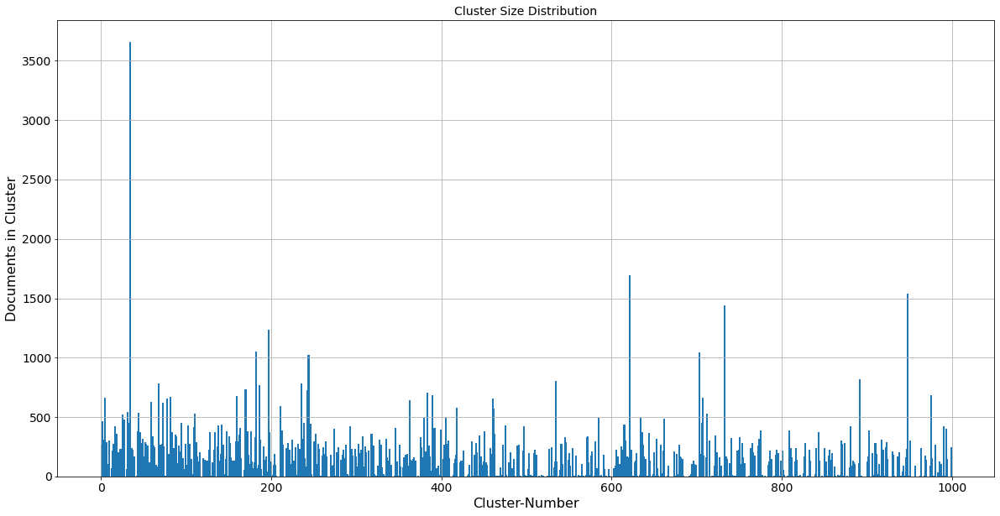


Finished running 'get_pairwise_dist' in 0.0001 mins


Number of Cluster Pairs : 499500

Finished running 'get_cluster_pairs' in 0.0016 mins

499500


In [12]:
# Pipeline test
# path = "/data/3/karthik/preference_prediction/articles.csv"

# Pipeline test
path = "../articles.csv"

main_df = load_data(path)

sampled_df = sample_data(df=main_df,sample_size=0.2,seed=RANDOM_SEED)
print("Sampled Size: %s" %str(sampled_df.shape[0]))

sampled_df["processed_text"] = preprocess_texts(text_lists=sampled_df["text"])

vectors,vocab,tfidf_vectorizer = vectorization(df=sampled_df,min_df=50,max_df=0.75,seed=RANDOM_SEED)

reduced_vectors = dimensionality_reduction(vectors=vectors,mode="SVD_LSA",dim=500,seed=RANDOM_SEED)

## to choose k
num_clusters_sett = [500,1000,2000,3000]
f_cp_map = {}

clusters,cluster_clf = run_clustering(vectors=reduced_vectors,seed=RANDOM_SEED,num_clusters=1000,clus_type="kmeans")

# cluster_score = score_cluster(vectors,cluster_clf,score_type="sil_score")

cluster_sizes = get_cluster_sizes(cluster_clf)

plot_size_dist(cluster_sizes)

cluster_pair_dist_mat = get_pairwise_dist(cluster_clf,dist_type="cosine")

cluster_pairs = get_cluster_pairs(num_clusters=1000)
print(len(cluster_pairs))

In [13]:
doc_2_cluster_map = cluster2doc(num_texts=sampled_df.shape[0],cluster_labels=cluster_clf.labels_)


Finished running 'cluster2doc' in 0.0006 mins



In [14]:
filtered_cluster_pairs = filter_clusters(cluster_pairs=cluster_pairs,
                                        doc_2_cluster_map=doc_2_cluster_map,
                                        cluster_sizes=cluster_sizes,
                                        partisan_scores=sampled_df["binary_ps"].tolist(),
                                        min_size=450,
                                        max_size=5000,
                                        min_partisan_size=0.4)

print("Filtered CLustered Pairs : %s" %str(len(filtered_cluster_pairs)))


Finished running 'filter_clusters' in 0.0775 mins

Filtered CLustered Pairs : 66


In [15]:
top100 = get_top_100_clusterpairs(cluster_pairs=filtered_cluster_pairs,dist_matrix=cluster_pair_dist_mat,reverse=True)


Finished running 'get_top_100_clusterpairs' in 0.0000 mins



## Cluster Similarity vs Model Performance

In [16]:
df_result = run_train_all(X = reduced_vectors,
                          cluster_2_doc_map = doc_2_cluster_map ,
                          df = sampled_df ,
                          cluster_pairs = top100,
                          cosine_mat = cluster_pair_dist_mat,
                          thresholds = [0.5,0.7,0.9],
                          user_type="Heterogeneous")

Training model for cluster pair : 0

Finished running 'run_model' in 0.0050 mins

Training model for cluster pair : 1

Finished running 'run_model' in 0.0053 mins

Training model for cluster pair : 2

Finished running 'run_model' in 0.0064 mins

Training model for cluster pair : 3

Finished running 'run_model' in 0.0065 mins

Training model for cluster pair : 4

Finished running 'run_model' in 0.0062 mins

Training model for cluster pair : 5

Finished running 'run_model' in 0.0071 mins

Training model for cluster pair : 6

Finished running 'run_model' in 0.0056 mins

Training model for cluster pair : 7

Finished running 'run_model' in 0.0058 mins

Training model for cluster pair : 8

Finished running 'run_model' in 0.0055 mins

Training model for cluster pair : 9

Finished running 'run_model' in 0.0063 mins

Training model for cluster pair : 10

Finished running 'run_model' in 0.0073 mins

Training model for cluster pair : 11

Finished running 'run_model' in 0.0070 mins

Training model

In [17]:
# for threshold in [0.5,0.7,0.9]:
#     plot_sim_vs_score(df_result,threshold)

In [18]:
df_result_homog = run_train_all(X = reduced_vectors,
                          cluster_2_doc_map = doc_2_cluster_map ,
                          df = sampled_df ,
                          cluster_pairs = top100,
                          cosine_mat = cluster_pair_dist_mat,
                          thresholds = [0.5,0.7,0.9],
                          user_type="Homogeneous")

Training model for cluster pair : 0

Finished running 'run_model' in 0.0057 mins

Training model for cluster pair : 1

Finished running 'run_model' in 0.0056 mins

Training model for cluster pair : 2

Finished running 'run_model' in 0.0065 mins

Training model for cluster pair : 3

Finished running 'run_model' in 0.0056 mins

Training model for cluster pair : 4

Finished running 'run_model' in 0.0056 mins

Training model for cluster pair : 5

Finished running 'run_model' in 0.0068 mins

Training model for cluster pair : 6

Finished running 'run_model' in 0.0065 mins

Training model for cluster pair : 7

Finished running 'run_model' in 0.0063 mins

Training model for cluster pair : 8

Finished running 'run_model' in 0.0050 mins

Training model for cluster pair : 9

Finished running 'run_model' in 0.0054 mins

Training model for cluster pair : 10

Finished running 'run_model' in 0.0072 mins

Training model for cluster pair : 11

Finished running 'run_model' in 0.0072 mins

Training model

In [19]:
# for threshold in [0.5,0.7,0.9]:
#     plot_sim_vs_score(df_result_homog,threshold)

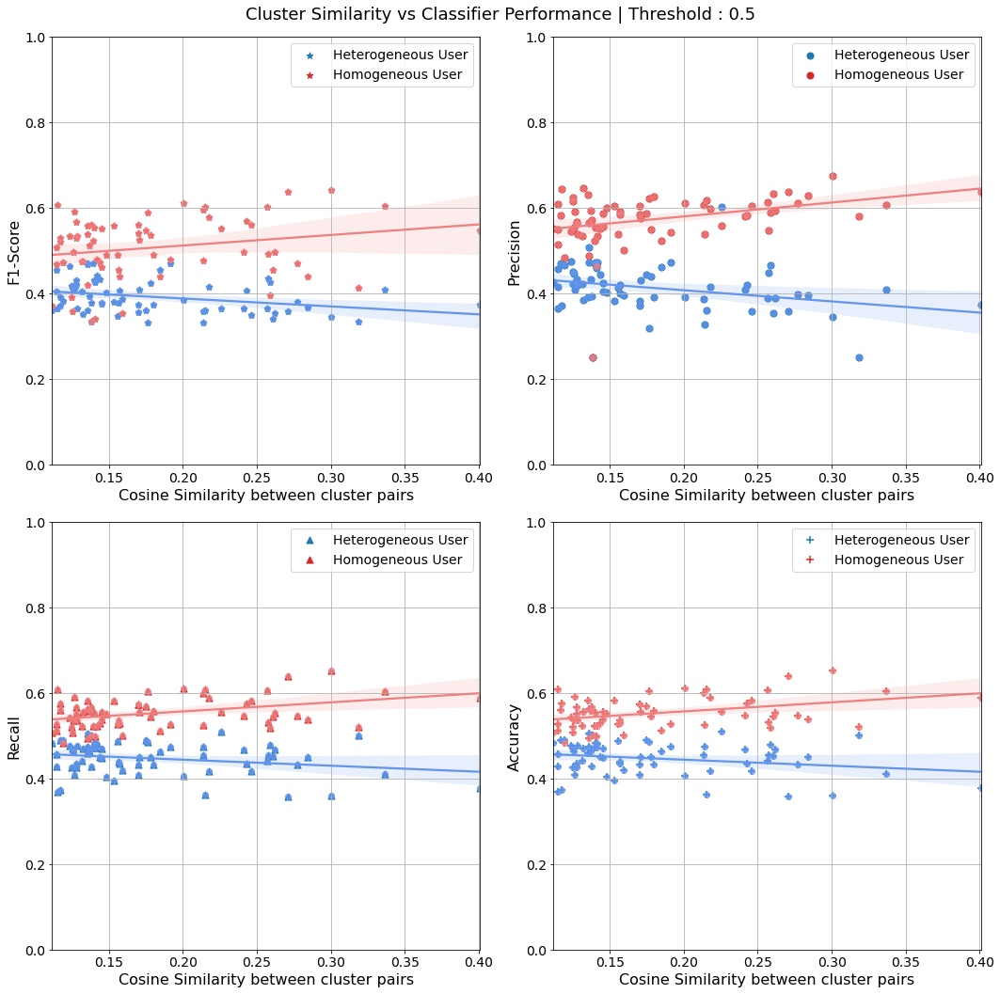


Finished running 'plot_sim_vs_score_all_users' in 0.0220 mins



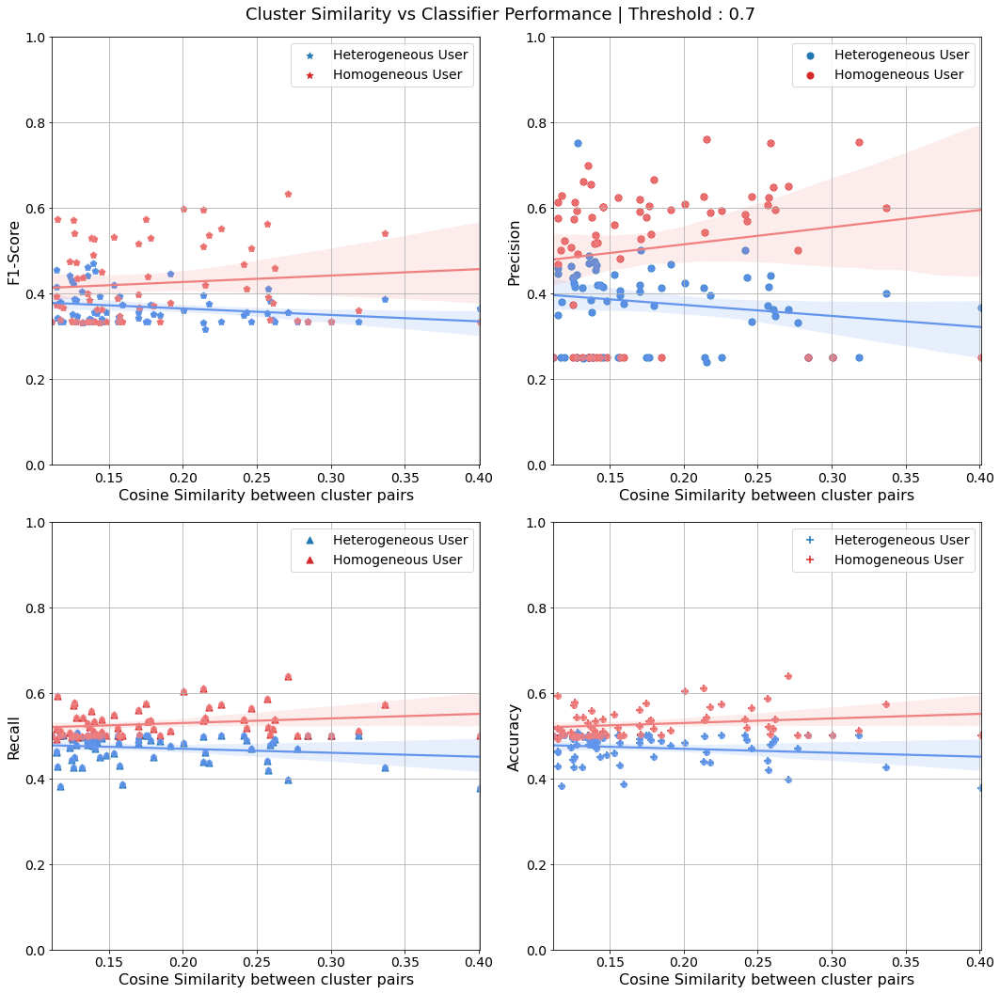


Finished running 'plot_sim_vs_score_all_users' in 0.0201 mins



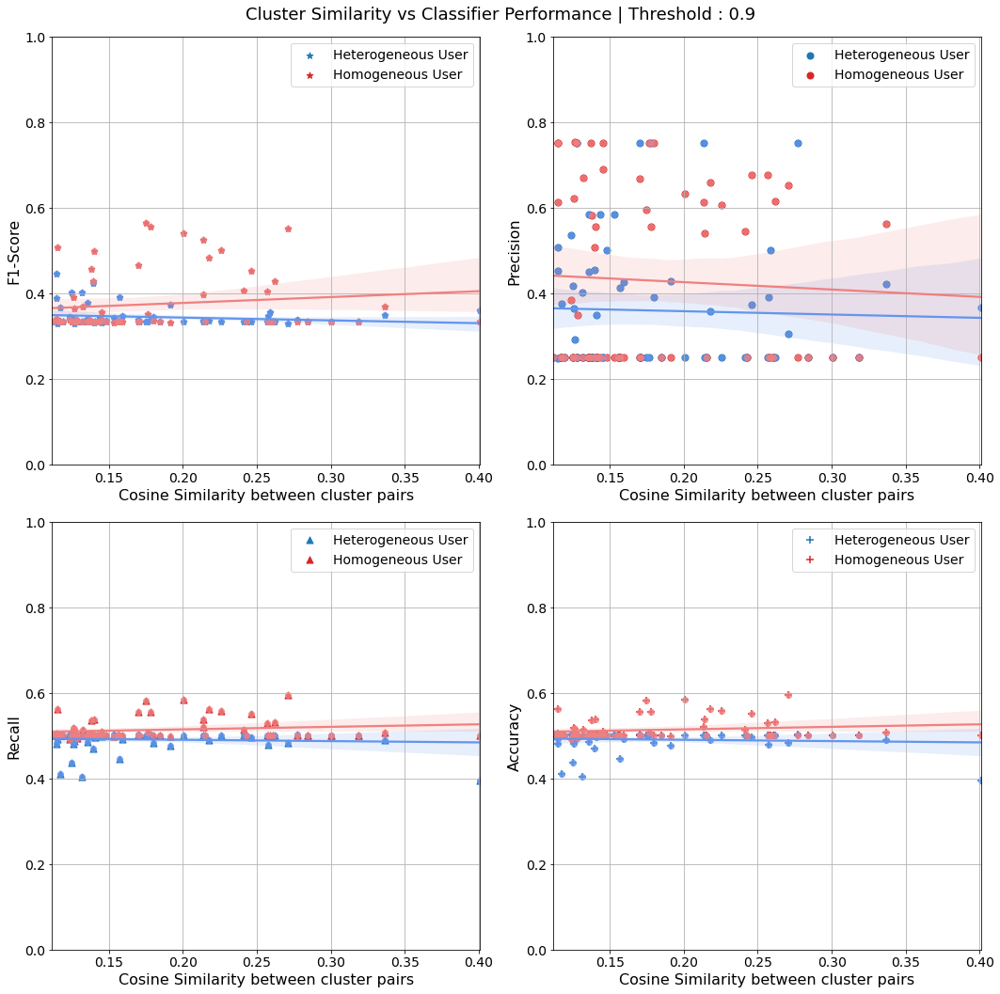


Finished running 'plot_sim_vs_score_all_users' in 0.0202 mins



In [20]:
for threshold in [0.5,0.7,0.9]:
    plot_sim_vs_score_all_users(df_results_hetero=df_result,
                                df_results_homo=df_result_homog,
                                threshold=threshold)

## Online Learning Setting - Active Learning Setting (Performance Measured on Held Out Validation Dataset)

In [21]:
hetero_scores = run_online_setting_active(X=reduced_vectors,
                                   cluster_2_doc_map=doc_2_cluster_map,
                                   df=sampled_df,
                                   cluster_pairs=top100,
                                   cosine_mat=cluster_pair_dist_mat,
                                   user_type="Heterogeneous")

Training model for cluster pair : 0
Training model for cluster pair : 1
Training model for cluster pair : 2
Training model for cluster pair : 3
Training model for cluster pair : 4
Training model for cluster pair : 5
Training model for cluster pair : 6
Training model for cluster pair : 7
Training model for cluster pair : 8
Training model for cluster pair : 9
Training model for cluster pair : 10
Training model for cluster pair : 11
Training model for cluster pair : 12
Training model for cluster pair : 13
Training model for cluster pair : 14
Training model for cluster pair : 15
Training model for cluster pair : 16
Training model for cluster pair : 17
Training model for cluster pair : 18
Training model for cluster pair : 19
Training model for cluster pair : 20
Training model for cluster pair : 21
Training model for cluster pair : 22
Training model for cluster pair : 23
Training model for cluster pair : 24
Training model for cluster pair : 25
Training model for cluster pair : 26
Training mo

In [22]:
homo_scores =  run_online_setting_active(X=reduced_vectors,
                                   cluster_2_doc_map=doc_2_cluster_map,
                                   df=sampled_df,
                                   cluster_pairs=top100,
                                   cosine_mat=cluster_pair_dist_mat,
                                   user_type="Homogeneous")

Training model for cluster pair : 0
Training model for cluster pair : 1
Training model for cluster pair : 2
Training model for cluster pair : 3
Training model for cluster pair : 4
Training model for cluster pair : 5
Training model for cluster pair : 6
Training model for cluster pair : 7
Training model for cluster pair : 8
Training model for cluster pair : 9
Training model for cluster pair : 10
Training model for cluster pair : 11
Training model for cluster pair : 12
Training model for cluster pair : 13
Training model for cluster pair : 14
Training model for cluster pair : 15
Training model for cluster pair : 16
Training model for cluster pair : 17
Training model for cluster pair : 18
Training model for cluster pair : 19
Training model for cluster pair : 20
Training model for cluster pair : 21
Training model for cluster pair : 22
Training model for cluster pair : 23
Training model for cluster pair : 24
Training model for cluster pair : 25
Training model for cluster pair : 26
Training mo

In [23]:
hetero_scores.keys()

dict_keys([(585, 712), (585, 707), (363, 418), (405, 585), (405, 707), (160, 363), (418, 892), (33, 707), (33, 585), (33, 712), (707, 712), (160, 892), (33, 390), (2, 585), (33, 405), (2, 33), (405, 712), (160, 418), (2, 405), (363, 892), (33, 160), (33, 73), (2, 712), (33, 892), (33, 418), (73, 160), (2, 707), (33, 363), (73, 390), (160, 405), (363, 585), (585, 892), (405, 892), (405, 418), (363, 405), (160, 585), (390, 585), (160, 390), (2, 418), (418, 585), (2, 892), (390, 712), (73, 707), (73, 585), (390, 405), (73, 405), (2, 363), (2, 160), (363, 712), (73, 363), (712, 892), (418, 712), (160, 712), (160, 707), (73, 892), (707, 892), (390, 707), (73, 712), (363, 707), (2, 390), (73, 418), (363, 390), (390, 418), (390, 892), (418, 707), (2, 73)])

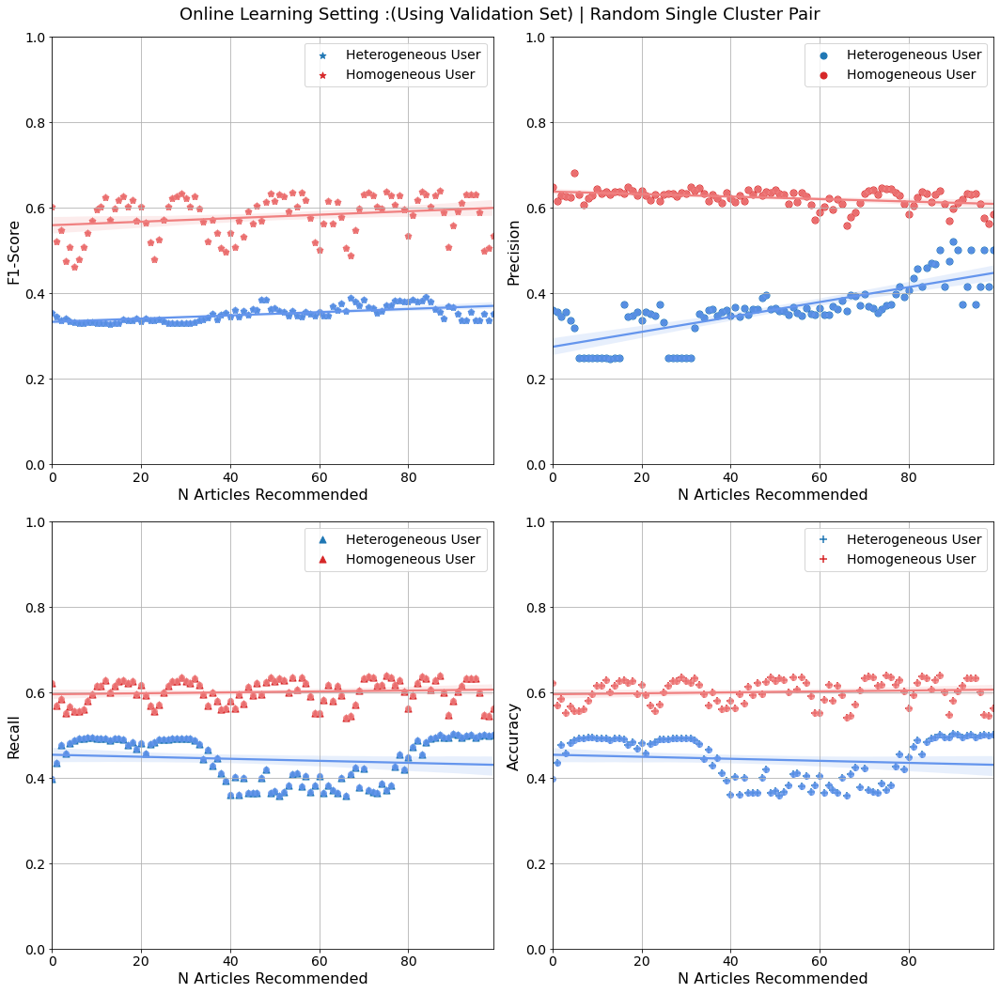


Finished running 'plot_online_setting_per_clusterpair' in 0.0209 mins



In [24]:
plot_online_setting_per_clusterpair(homo_scores[(585, 712)],hetero_scores[(585, 712)])

In [25]:
# plot_online_setting_per_clusterpair(homo_scores[(533, 780)],hetero_scores[(533, 780)])


Finished running 'combine_scores_cumu_online_setting' in 0.0000 mins


Finished running 'combine_scores_cumu_online_setting' in 0.0000 mins



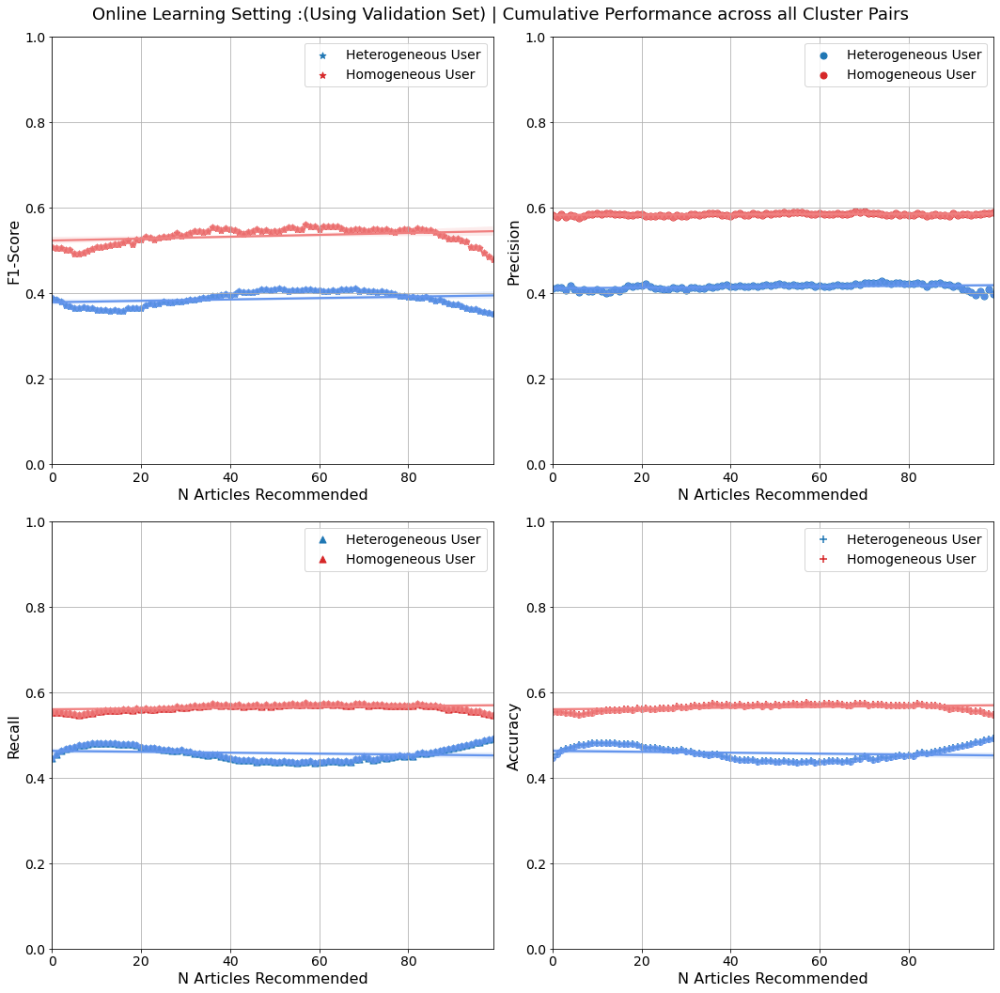


Finished running 'plot_online_setting_per_clusterpair' in 0.0199 mins


Finished running 'plot_online_learning_cumulative' in 0.0200 mins



In [26]:
plot_online_learning_cumulative(homo_scores,hetero_scores)

## Online Learning Setting - Information Retrieval Setting (Performance Metrics measured @Kth interaction)

In [27]:
hetero_scores,df_res_map_hetero = run_online_setting_atK(X=reduced_vectors,
                                   cluster_2_doc_map=doc_2_cluster_map,
                                   df=sampled_df,
                                   cluster_pairs=top100,
                                   cosine_mat=cluster_pair_dist_mat,
                                   user_type="Heterogeneous")

Training model for cluster pair : (585, 712)
Training model for cluster pair : (585, 707)
Training model for cluster pair : (363, 418)
Training model for cluster pair : (405, 585)
Training model for cluster pair : (405, 707)
Training model for cluster pair : (160, 363)
Training model for cluster pair : (418, 892)
Training model for cluster pair : (33, 707)
Training model for cluster pair : (33, 585)
Training model for cluster pair : (33, 712)
Training model for cluster pair : (707, 712)
Training model for cluster pair : (160, 892)
Training model for cluster pair : (33, 390)
Training model for cluster pair : (2, 585)
Training model for cluster pair : (33, 405)
Training model for cluster pair : (2, 33)
Training model for cluster pair : (405, 712)
Training model for cluster pair : (160, 418)
Training model for cluster pair : (2, 405)
Training model for cluster pair : (363, 892)
Training model for cluster pair : (33, 160)
Training model for cluster pair : (33, 73)
Training model for cluste

In [28]:
homo_scores, df_res_map_homo =  run_online_setting_atK(X=reduced_vectors,
                                   cluster_2_doc_map=doc_2_cluster_map,
                                   df=sampled_df,
                                   cluster_pairs=top100,
                                   cosine_mat=cluster_pair_dist_mat,
                                   user_type="Homogeneous")

Training model for cluster pair : (585, 712)
Training model for cluster pair : (585, 707)
Training model for cluster pair : (363, 418)
Training model for cluster pair : (405, 585)
Training model for cluster pair : (405, 707)
Training model for cluster pair : (160, 363)
Training model for cluster pair : (418, 892)
Training model for cluster pair : (33, 707)
Training model for cluster pair : (33, 585)
Training model for cluster pair : (33, 712)
Training model for cluster pair : (707, 712)
Training model for cluster pair : (160, 892)
Training model for cluster pair : (33, 390)
Training model for cluster pair : (2, 585)
Training model for cluster pair : (33, 405)
Training model for cluster pair : (2, 33)
Training model for cluster pair : (405, 712)
Training model for cluster pair : (160, 418)
Training model for cluster pair : (2, 405)
Training model for cluster pair : (363, 892)
Training model for cluster pair : (33, 160)
Training model for cluster pair : (33, 73)
Training model for cluste

In [29]:
hetero_scores.keys()

dict_keys([(585, 712), (585, 707), (363, 418), (405, 585), (405, 707), (160, 363), (418, 892), (33, 707), (33, 585), (33, 712), (707, 712), (160, 892), (33, 390), (2, 585), (33, 405), (2, 33), (405, 712), (160, 418), (2, 405), (363, 892), (33, 160), (33, 73), (2, 712), (33, 892), (33, 418), (73, 160), (2, 707), (33, 363), (73, 390), (160, 405), (363, 585), (585, 892), (405, 892), (405, 418), (363, 405), (160, 585), (390, 585), (160, 390), (2, 418), (418, 585), (2, 892), (390, 712), (73, 707), (73, 585), (390, 405), (73, 405), (2, 363), (2, 160), (363, 712), (73, 363), (712, 892), (418, 712), (160, 712), (160, 707), (73, 892), (707, 892), (390, 707), (73, 712), (363, 707), (2, 390), (73, 418), (363, 390), (390, 418), (390, 892), (418, 707), (2, 73)])

In [30]:
df_res_map_homo[(585, 712)].head(50)

,Shown at K,Recall at K,Precision at K
0,1,0.004292,1.000000
1,1,0.008584,1.000000
2,1,0.012876,1.000000
3,0,0.012876,0.750000
4,1,0.017167,0.800000
5,1,0.021459,0.833333
6,0,0.021459,0.714286
7,1,0.025751,0.750000
8,1,0.030043,0.777778
9,1,0.034335,0.800000


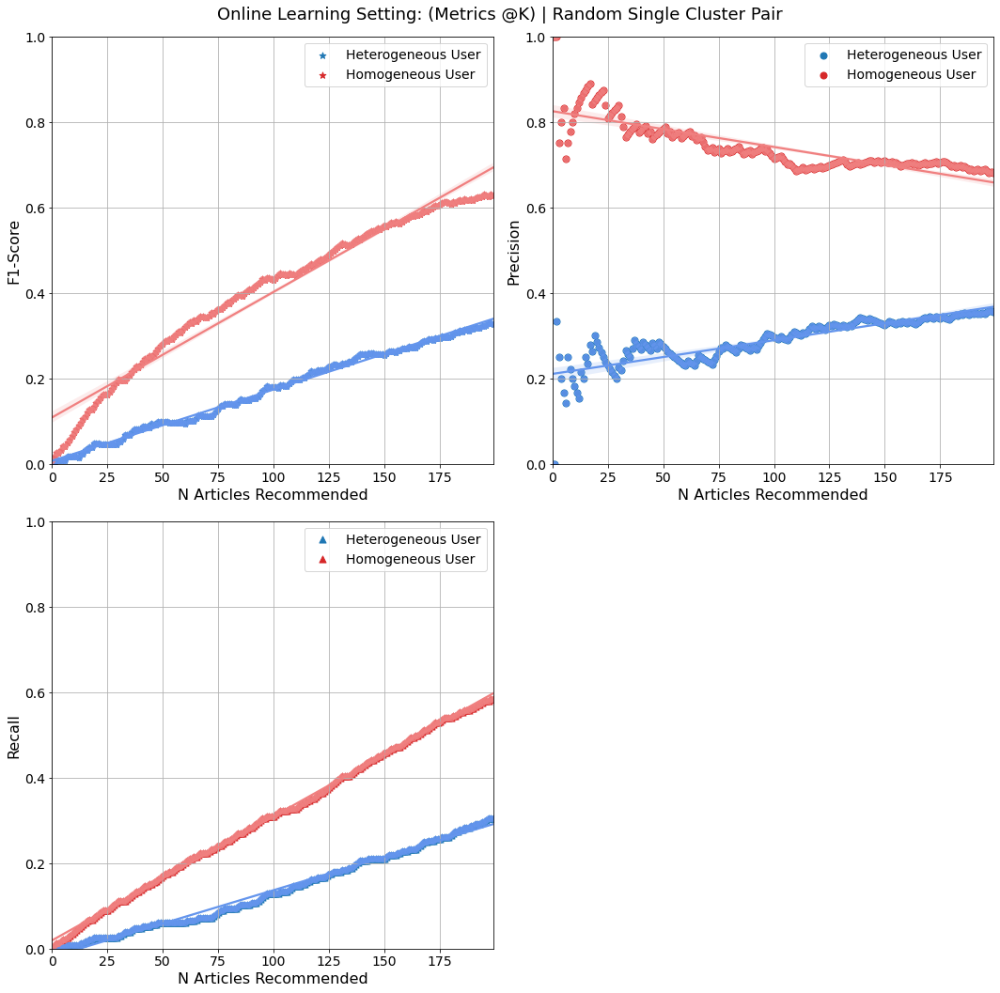


Finished running 'plot_online_setting_per_clusterpair' in 0.0178 mins



In [31]:
plot_online_setting_per_clusterpair(homo_scores[(585, 712)],hetero_scores[(585, 712)],single=True,active=False)

In [32]:
# plot_online_setting_per_clusterpair(homo_scores[(533, 780)],hetero_scores[(533, 780)],single=True,active=False)


Finished running 'combine_scores_cumu_online_setting' in 0.0000 mins


Finished running 'combine_scores_cumu_online_setting' in 0.0000 mins



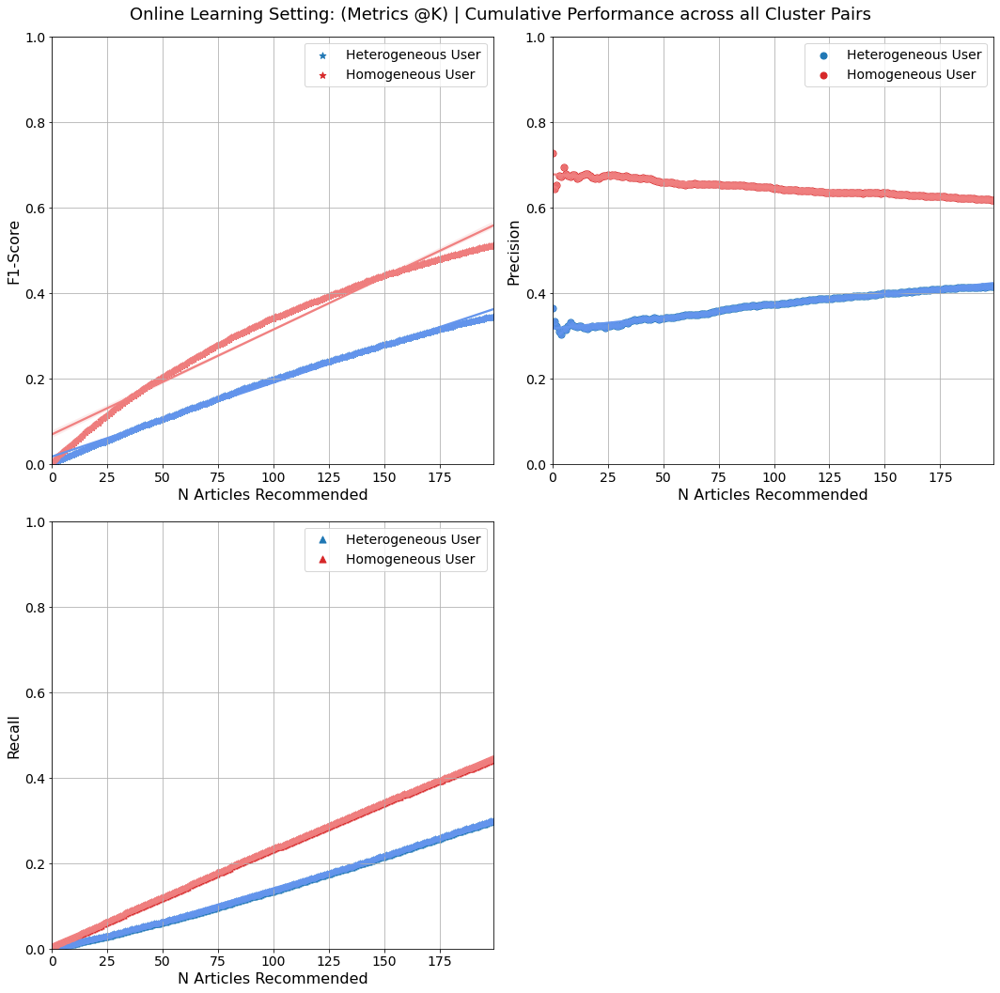


Finished running 'plot_online_setting_per_clusterpair' in 0.0182 mins


Finished running 'plot_online_learning_cumulative' in 0.0183 mins



In [33]:
plot_online_learning_cumulative(homo_scores,hetero_scores,active=False)

In [34]:
homo_scores[(585, 712)].keys()

dict_keys(['logistic_regression'])

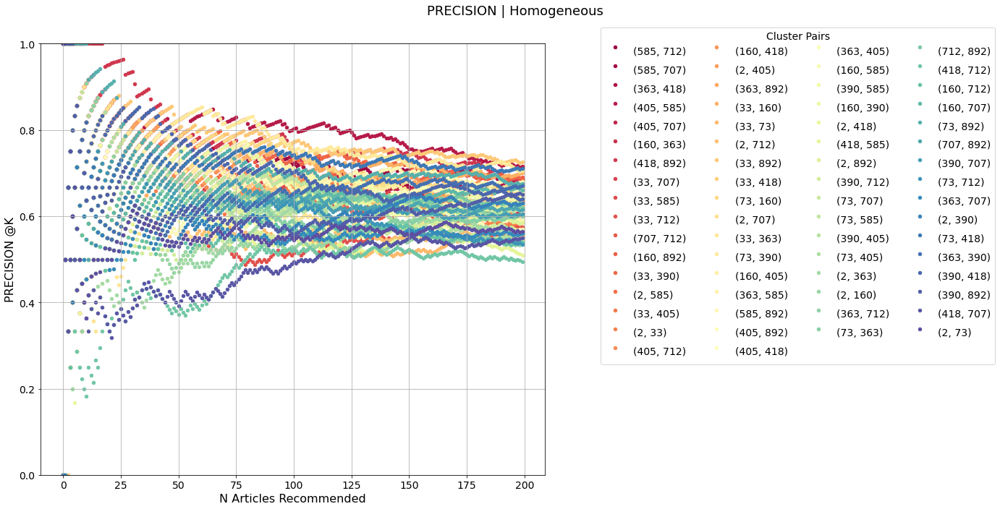


Finished running 'plot_all_cp_online' in 0.0411 mins



In [35]:
plot_all_cp_online(homo_scores,user_type="Homogeneous",metric="precision")

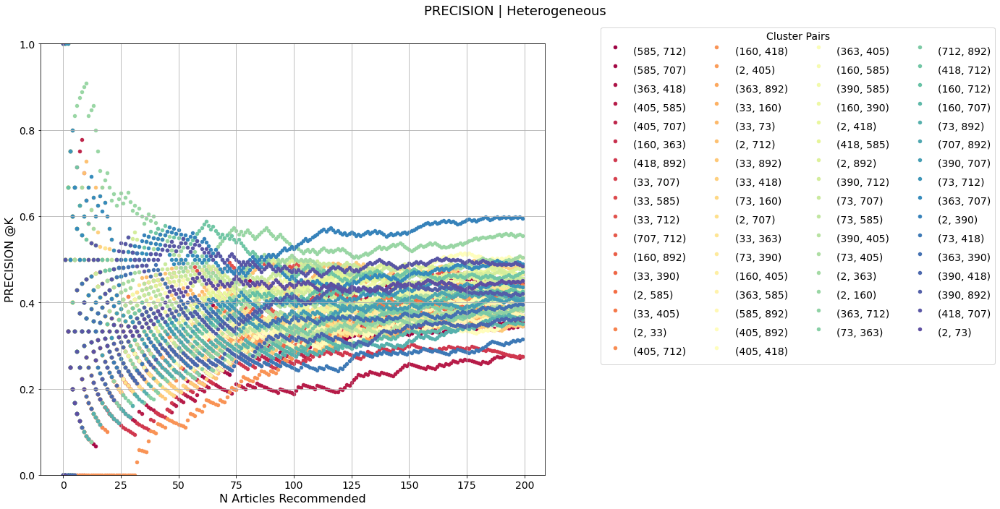


Finished running 'plot_all_cp_online' in 0.0414 mins



In [36]:
plot_all_cp_online(hetero_scores,user_type="Heterogeneous",metric="precision")

## Single Cluster Performance : To detect how hard the task of identifying change in topic

In [37]:
hetero_scores = run_single_cluster_performance(X=reduced_vectors,
                                   cluster_2_doc_map=doc_2_cluster_map,
                                   df=sampled_df,
                                   cluster_pairs=top100,
                                   cosine_mat=cluster_pair_dist_mat,
                                   user_type="Heterogeneous")

Training model for cluster pair : 0
Training model for cluster pair : 1
Training model for cluster pair : 2
Training model for cluster pair : 3
Training model for cluster pair : 4
Training model for cluster pair : 5
Training model for cluster pair : 6
Training model for cluster pair : 7
Training model for cluster pair : 8
Training model for cluster pair : 9
Training model for cluster pair : 10
Training model for cluster pair : 11
Training model for cluster pair : 12
Training model for cluster pair : 13
Training model for cluster pair : 14
Training model for cluster pair : 15
Training model for cluster pair : 16
Training model for cluster pair : 17
Training model for cluster pair : 18
Training model for cluster pair : 19
Training model for cluster pair : 20
Training model for cluster pair : 21
Training model for cluster pair : 22
Training model for cluster pair : 23
Training model for cluster pair : 24
Training model for cluster pair : 25
Training model for cluster pair : 26
Training mo

In [38]:
homo_scores =  run_single_cluster_performance(X=reduced_vectors,
                                   cluster_2_doc_map=doc_2_cluster_map,
                                   df=sampled_df,
                                   cluster_pairs=top100,
                                   cosine_mat=cluster_pair_dist_mat,
                                   user_type="Homogeneous")

Training model for cluster pair : 0
Training model for cluster pair : 1
Training model for cluster pair : 2
Training model for cluster pair : 3
Training model for cluster pair : 4
Training model for cluster pair : 5
Training model for cluster pair : 6
Training model for cluster pair : 7
Training model for cluster pair : 8
Training model for cluster pair : 9
Training model for cluster pair : 10
Training model for cluster pair : 11
Training model for cluster pair : 12
Training model for cluster pair : 13
Training model for cluster pair : 14
Training model for cluster pair : 15
Training model for cluster pair : 16
Training model for cluster pair : 17
Training model for cluster pair : 18
Training model for cluster pair : 19
Training model for cluster pair : 20
Training model for cluster pair : 21
Training model for cluster pair : 22
Training model for cluster pair : 23
Training model for cluster pair : 24
Training model for cluster pair : 25
Training model for cluster pair : 26
Training mo

In [39]:
hetero_scores.keys()

dict_keys([(585, 712), (585, 707), (363, 418), (405, 585), (405, 707), (160, 363), (418, 892), (33, 707), (33, 585), (33, 712), (707, 712), (160, 892), (33, 390), (2, 585), (33, 405), (2, 33), (405, 712), (160, 418), (2, 405), (363, 892), (33, 160), (33, 73), (2, 712), (33, 892), (33, 418), (73, 160), (2, 707), (33, 363), (73, 390), (160, 405), (363, 585), (585, 892), (405, 892), (405, 418), (363, 405), (160, 585), (390, 585), (160, 390), (2, 418), (418, 585), (2, 892), (390, 712), (73, 707), (73, 585), (390, 405), (73, 405), (2, 363), (2, 160), (363, 712), (73, 363), (712, 892), (418, 712), (160, 712), (160, 707), (73, 892), (707, 892), (390, 707), (73, 712), (363, 707), (2, 390), (73, 418), (363, 390), (390, 418), (390, 892), (418, 707), (2, 73)])

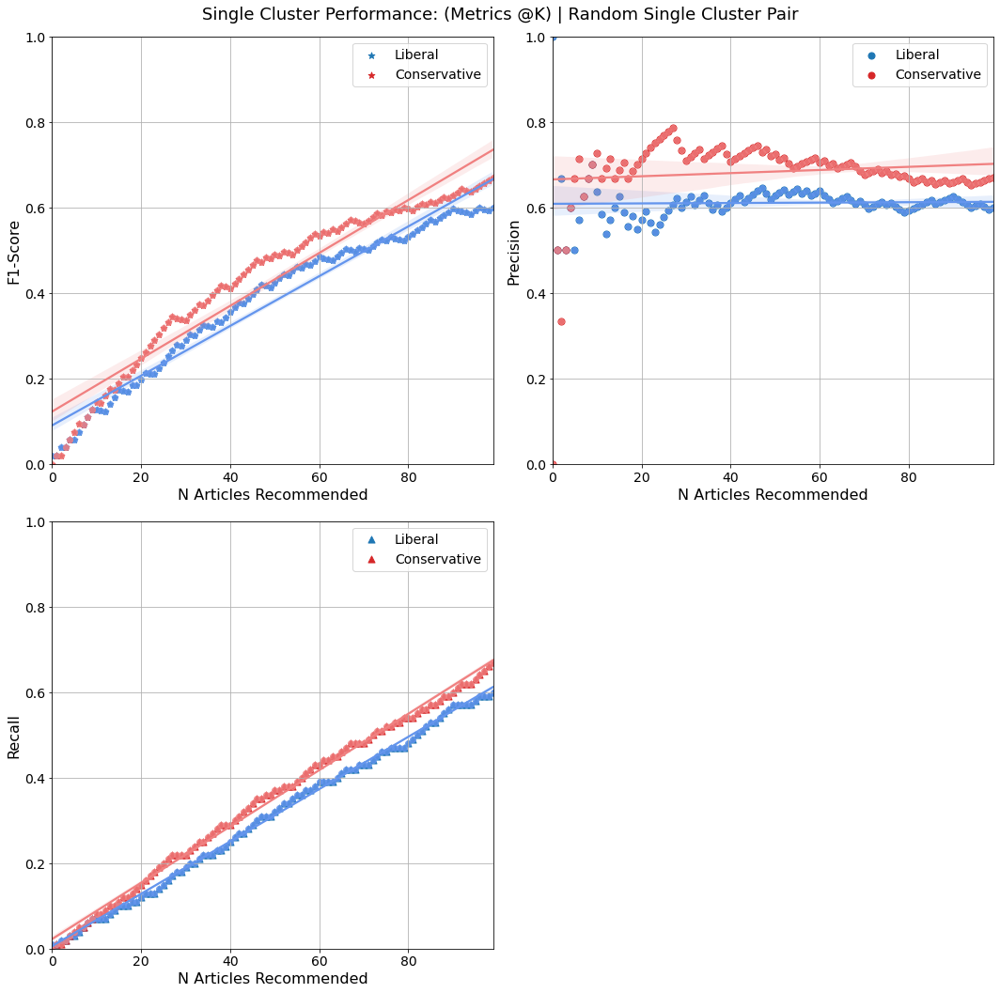


Finished running 'plot_single_cluster_performance' in 0.0163 mins



In [40]:
plot_single_cluster_performance(homo_scores[(585, 712)],hetero_scores[(585, 712)],single=True)


Finished running 'combine_scores_cumu_online_setting' in 0.0000 mins


Finished running 'combine_scores_cumu_online_setting' in 0.0000 mins



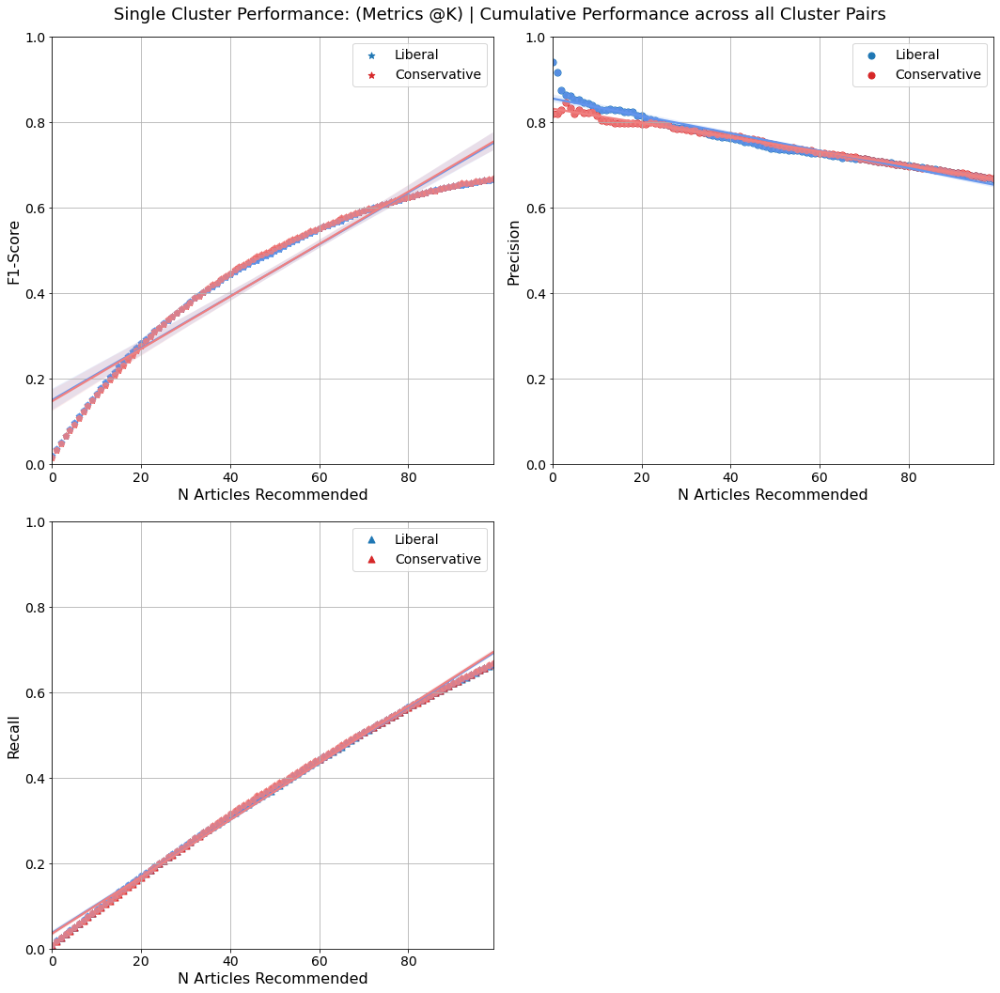


Finished running 'plot_single_cluster_performance' in 0.0160 mins


Finished running 'plot_single_cluster_cumulative' in 0.0161 mins



In [41]:
plot_single_cluster_cumulative(homo_scores,hetero_scores)

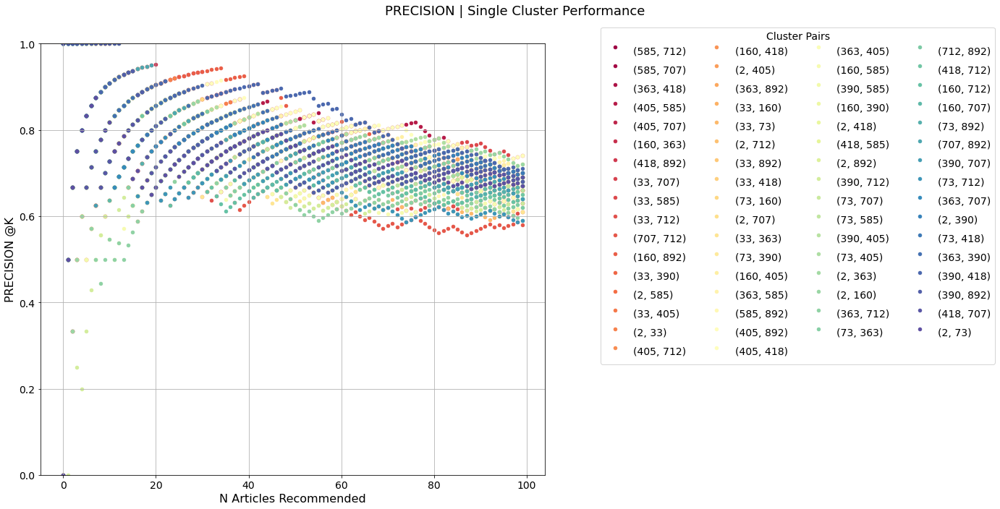


Finished running 'plot_all_cp_singlecluster' in 0.0378 mins



In [42]:
plot_all_cp_singlecluster(homo_scores)

## Regularization vs Performance@K

In [43]:
hetero_scores = run_regularization_variation(X=reduced_vectors,
                                   cluster_2_doc_map=doc_2_cluster_map,
                                   df=sampled_df,
                                   cluster_pairs=top100,
                                   cosine_mat=cluster_pair_dist_mat,
                                 user_type="Heterogeneous",
                                 reg_constants=[0.0001,0.001,0.01,0.1,0.0,1.0,10.0,20.0,50.0,100.0])

Training model for cluster pair : 0
Training model for cluster pair : 1
Training model for cluster pair : 2
Training model for cluster pair : 3
Training model for cluster pair : 4
Training model for cluster pair : 5
Training model for cluster pair : 6
Training model for cluster pair : 7
Training model for cluster pair : 8
Training model for cluster pair : 9
Training model for cluster pair : 10
Training model for cluster pair : 11
Training model for cluster pair : 12
Training model for cluster pair : 13
Training model for cluster pair : 14
Training model for cluster pair : 15
Training model for cluster pair : 16
Training model for cluster pair : 17
Training model for cluster pair : 18
Training model for cluster pair : 19
Training model for cluster pair : 20
Training model for cluster pair : 21
Training model for cluster pair : 22
Training model for cluster pair : 23
Training model for cluster pair : 24
Training model for cluster pair : 25
Training model for cluster pair : 26
Training mo

In [44]:
homo_scores = run_regularization_variation(X=reduced_vectors,
                                   cluster_2_doc_map=doc_2_cluster_map,
                                   df=sampled_df,
                                   cluster_pairs=top100,
                                   cosine_mat=cluster_pair_dist_mat,
                                 user_type="Homogeneous",
                                 reg_constants=[0.0001,0.001,0.01,0.1,0.0,1.0,10.0,20.0,50.0,100.0])

Training model for cluster pair : 0
Training model for cluster pair : 1
Training model for cluster pair : 2
Training model for cluster pair : 3
Training model for cluster pair : 4
Training model for cluster pair : 5
Training model for cluster pair : 6
Training model for cluster pair : 7
Training model for cluster pair : 8
Training model for cluster pair : 9
Training model for cluster pair : 10
Training model for cluster pair : 11
Training model for cluster pair : 12
Training model for cluster pair : 13
Training model for cluster pair : 14
Training model for cluster pair : 15
Training model for cluster pair : 16
Training model for cluster pair : 17
Training model for cluster pair : 18
Training model for cluster pair : 19
Training model for cluster pair : 20
Training model for cluster pair : 21
Training model for cluster pair : 22
Training model for cluster pair : 23
Training model for cluster pair : 24
Training model for cluster pair : 25
Training model for cluster pair : 26
Training mo

In [45]:
homo_scores.keys()

dict_keys([(585, 712), (585, 707), (363, 418), (405, 585), (405, 707), (160, 363), (418, 892), (33, 707), (33, 585), (33, 712), (707, 712), (160, 892), (33, 390), (2, 585), (33, 405), (2, 33), (405, 712), (160, 418), (2, 405), (363, 892), (33, 160), (33, 73), (2, 712), (33, 892), (33, 418), (73, 160), (2, 707), (33, 363), (73, 390), (160, 405), (363, 585), (585, 892), (405, 892), (405, 418), (363, 405), (160, 585), (390, 585), (160, 390), (2, 418), (418, 585), (2, 892), (390, 712), (73, 707), (73, 585), (390, 405), (73, 405), (2, 363), (2, 160), (363, 712), (73, 363), (712, 892), (418, 712), (160, 712), (160, 707), (73, 892), (707, 892), (390, 707), (73, 712), (363, 707), (2, 390), (73, 418), (363, 390), (390, 418), (390, 892), (418, 707), (2, 73)])

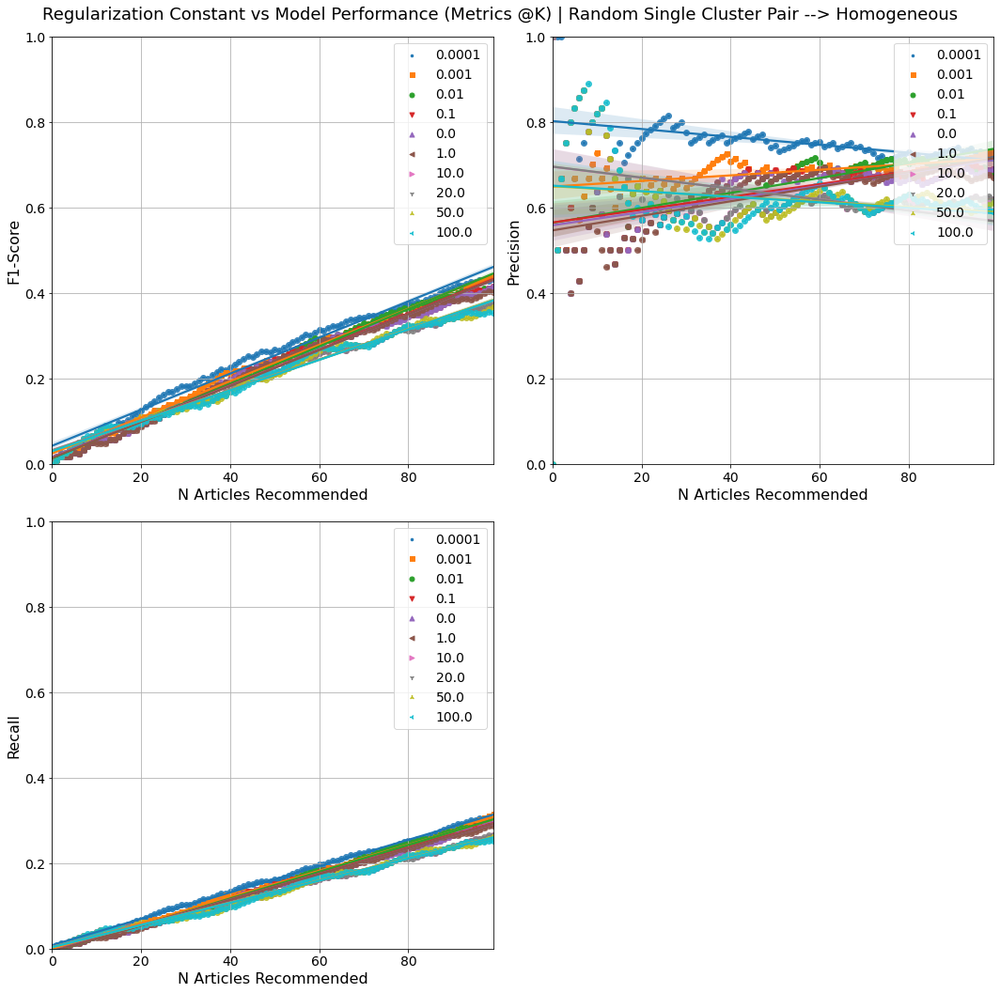


Finished running 'plot_regularization_vs_metrics_at_k' in 0.0595 mins



In [46]:
plot_regularization_vs_metrics_at_k(homo_scores[(585, 712)],
                            regularization_constants=[0.0001,0.001,0.01,0.1,0.0,1.0,10.0,20.0,50.0,100.0],
                            single=True,
                            user_type="Homogeneous")

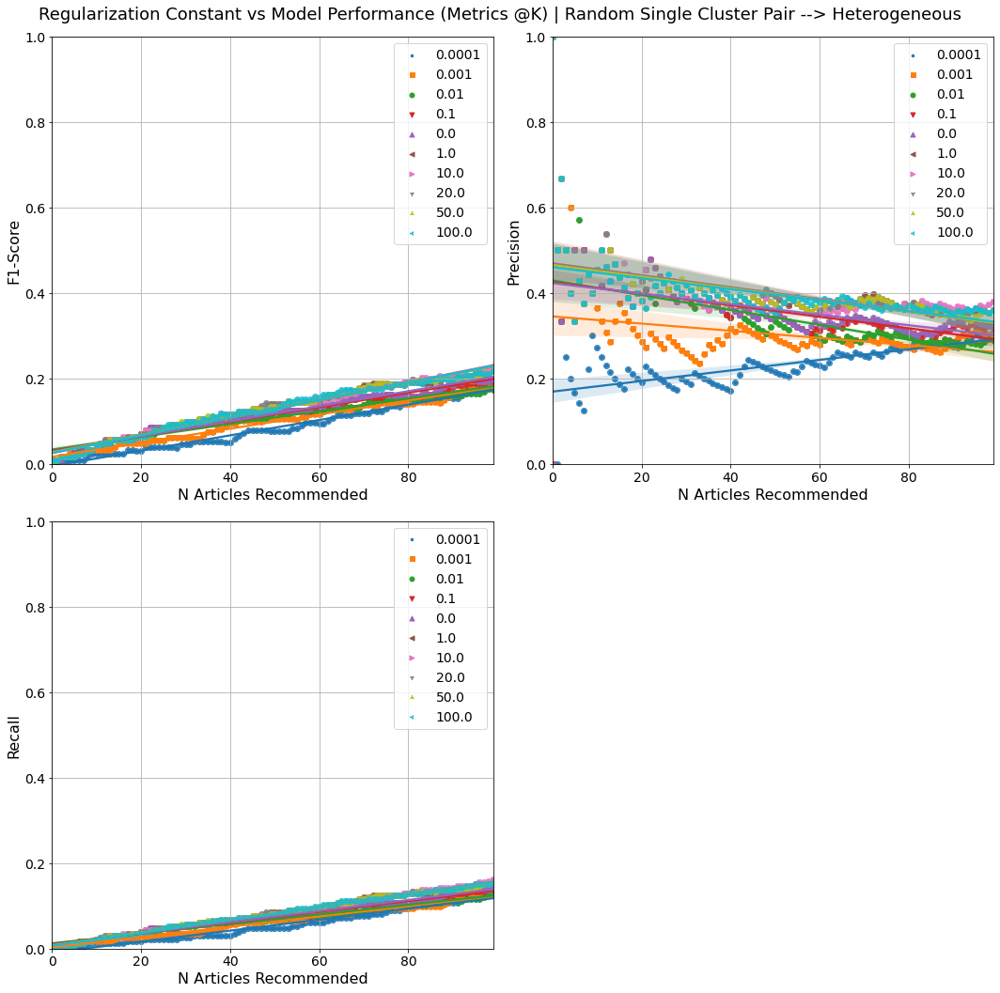


Finished running 'plot_regularization_vs_metrics_at_k' in 0.0581 mins



In [47]:
plot_regularization_vs_metrics_at_k(hetero_scores[(585, 712)],
                                    regularization_constants=[0.0001,0.001,0.01,0.1,0.0,1.0,10.0,20.0,50.0,100.0],
                                    single=True)


Finished running 'combine_scores_reg_vs_metrics_at_k' in 0.0002 mins



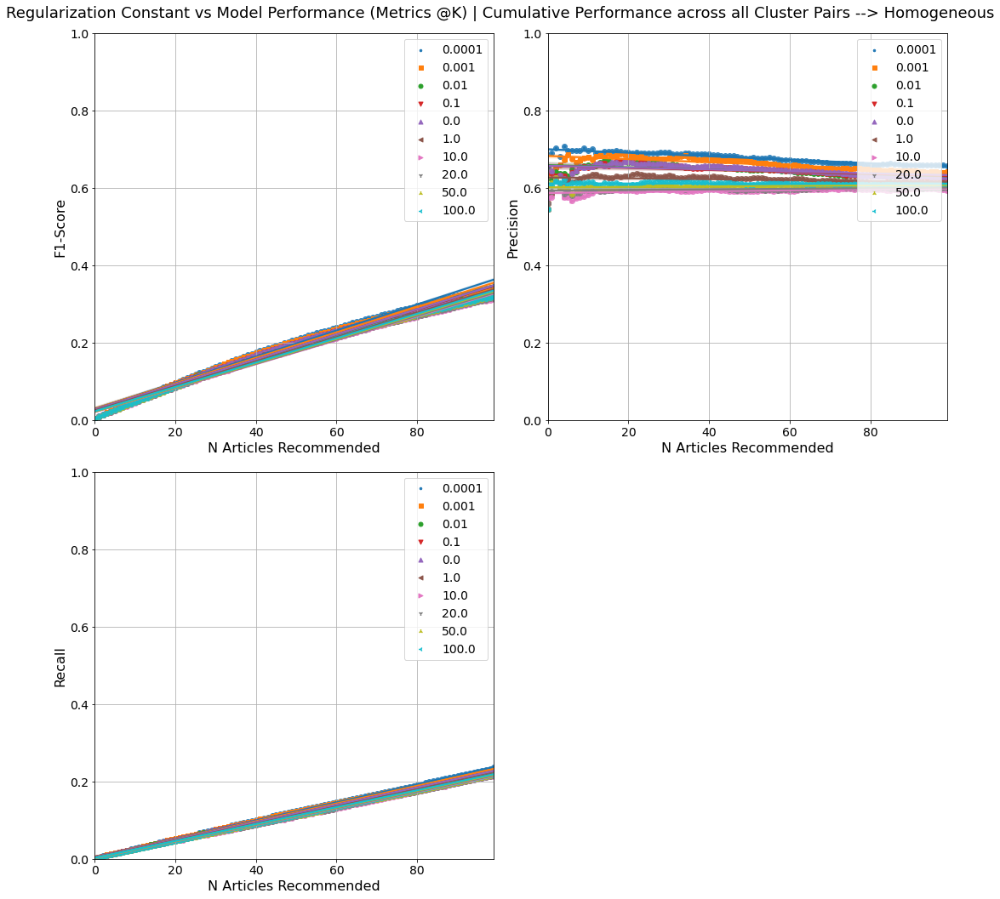


Finished running 'plot_regularization_vs_metrics_at_k' in 0.0592 mins


Finished running 'plot_regularization_vs_metrics_at_k_cumu' in 0.0594 mins



In [48]:
plot_regularization_vs_metrics_at_k_cumu(homo_scores,
                                         regularization_constants=[0.0001,0.001,0.01,0.1,0.0,1.0,10.0,20.0,50.0,100.0],
                                         user_type="Homogeneous")


Finished running 'combine_scores_reg_vs_metrics_at_k' in 0.0001 mins



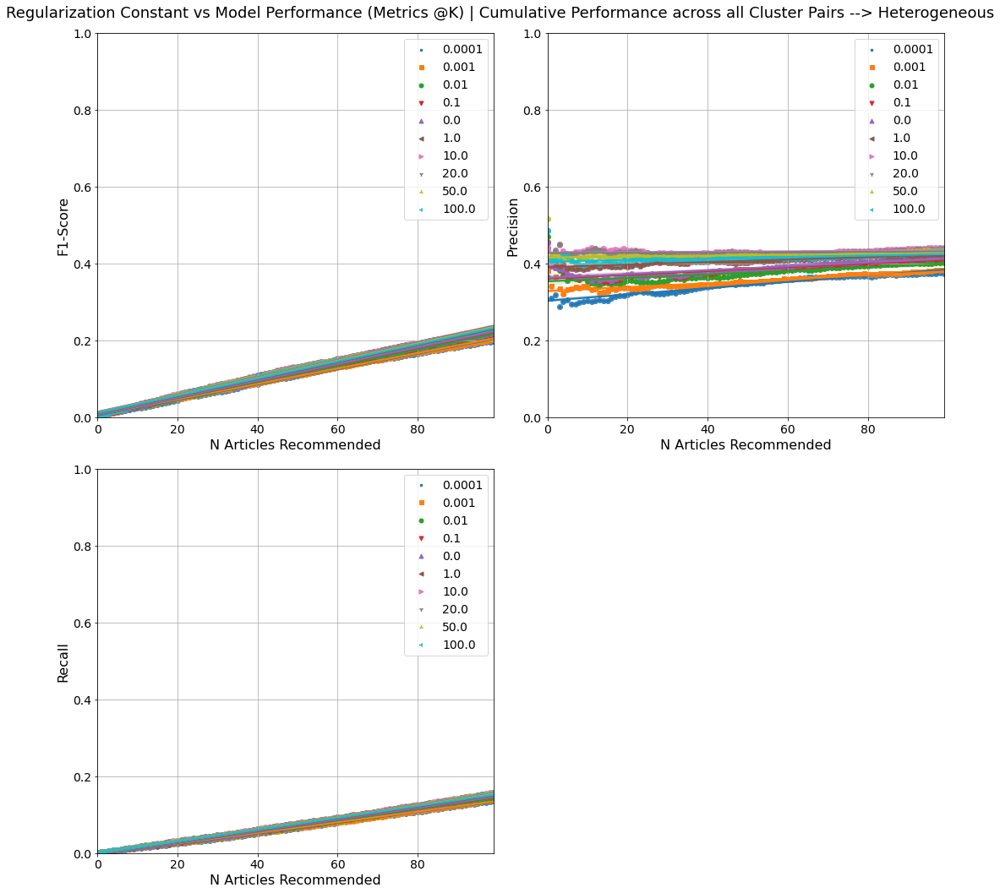


Finished running 'plot_regularization_vs_metrics_at_k' in 0.0582 mins


Finished running 'plot_regularization_vs_metrics_at_k_cumu' in 0.0583 mins



In [49]:
plot_regularization_vs_metrics_at_k_cumu(hetero_scores,
                                         regularization_constants=[0.0001,0.001,0.01,0.1,0.0,1.0,10.0,20.0,50.0,100.0])

## Learning rate vs Performance@K

In [50]:
hetero_scores,df_het_res_100,df_het_res_500 = run_learningrate_variation(X=reduced_vectors,sample_df=sampled_df,
                                   cluster_2_doc_map=doc_2_cluster_map,
                                   df=sampled_df,
                                   cluster_pairs=top100,
                                   cosine_mat=cluster_pair_dist_mat,
                                 user_type="Heterogeneous",
                                 lr=[0.001,0.01,0.1,1.0,10,15,20,50,100,500])

Training model for cluster pair : 0

*************** CP = (585, 712) , LR = 0.001 ****************
SGDClassifier(eta0=0.001, learning_rate='constant', loss='log',
              random_state=15112)

*************** CP = (585, 712) , LR = 0.01 ****************
SGDClassifier(eta0=0.01, learning_rate='constant', loss='log',
              random_state=15112)

*************** CP = (585, 712) , LR = 0.1 ****************
SGDClassifier(eta0=0.1, learning_rate='constant', loss='log',
              random_state=15112)

*************** CP = (585, 712) , LR = 1.0 ****************
SGDClassifier(eta0=1.0, learning_rate='constant', loss='log',
              random_state=15112)

*************** CP = (585, 712) , LR = 10 ****************
SGDClassifier(eta0=10, learning_rate='constant', loss='log', random_state=15112)

*************** CP = (585, 712) , LR = 15 ****************
SGDClassifier(eta0=15, learning_rate='constant', loss='log', random_state=15112)

*************** CP = (585, 712) , LR = 20 *****

In [51]:
homo_scores,df_hom_res_100,df_hom_res_500 = run_learningrate_variation(X=reduced_vectors,sample_df=sampled_df,
                                   cluster_2_doc_map=doc_2_cluster_map,
                                   df=sampled_df,
                                   cluster_pairs=top100,
                                   cosine_mat=cluster_pair_dist_mat,
                                 user_type="Homogeneous",
                                 lr=[0.001,0.01,0.1,1.0,10,15,20,50,100,500])

Training model for cluster pair : 0

*************** CP = (585, 712) , LR = 0.001 ****************
SGDClassifier(eta0=0.001, learning_rate='constant', loss='log',
              random_state=15112)

*************** CP = (585, 712) , LR = 0.01 ****************
SGDClassifier(eta0=0.01, learning_rate='constant', loss='log',
              random_state=15112)

*************** CP = (585, 712) , LR = 0.1 ****************
SGDClassifier(eta0=0.1, learning_rate='constant', loss='log',
              random_state=15112)

*************** CP = (585, 712) , LR = 1.0 ****************
SGDClassifier(eta0=1.0, learning_rate='constant', loss='log',
              random_state=15112)

*************** CP = (585, 712) , LR = 10 ****************
SGDClassifier(eta0=10, learning_rate='constant', loss='log', random_state=15112)

*************** CP = (585, 712) , LR = 15 ****************
SGDClassifier(eta0=15, learning_rate='constant', loss='log', random_state=15112)

*************** CP = (585, 712) , LR = 20 *****

In [52]:
homo_scores.keys()

dict_keys([(585, 712), (585, 707), (363, 418), (405, 585), (405, 707), (160, 363), (418, 892), (33, 707), (33, 585), (33, 712), (707, 712), (160, 892), (33, 390), (2, 585), (33, 405), (2, 33), (405, 712), (160, 418), (2, 405), (363, 892), (33, 160), (33, 73), (2, 712), (33, 892), (33, 418), (73, 160), (2, 707), (33, 363), (73, 390), (160, 405), (363, 585), (585, 892), (405, 892), (405, 418), (363, 405), (160, 585), (390, 585), (160, 390), (2, 418), (418, 585), (2, 892), (390, 712), (73, 707), (73, 585), (390, 405), (73, 405), (2, 363), (2, 160), (363, 712), (73, 363), (712, 892), (418, 712), (160, 712), (160, 707), (73, 892), (707, 892), (390, 707), (73, 712), (363, 707), (2, 390), (73, 418), (363, 390), (390, 418), (390, 892), (418, 707), (2, 73)])

In [53]:
df_het_res_500[(390, 892)].head(50)

,Shown at K,Recall at K,Precision at K,Top Article
0,0.0,0.000000,0.000000,the following transcript interview with former...
1,0.0,0.000000,0.000000,the political world may have reached fever pit...
2,1.0,0.002703,0.333333,according the polls joe biden doesn have praye...
3,0.0,0.002703,0.250000,during town hall cnn monday 2020 democratic pr...
4,1.0,0.005405,0.400000,former vice president and 2020 contender joe b...
5,0.0,0.005405,0.333333,dan mclaughlin writes joe biden has idea how ...
6,1.0,0.008108,0.428571,former vice president joe biden said that inst...
7,1.0,0.010811,0.500000,the root michael harriot called out recently s...
8,0.0,0.010811,0.444444,lucy flores former nevada state assemblywoman ...
9,1.0,0.013514,0.500000,former vice president joe biden who weighing 2...


In [54]:
df_het_res_500[(585, 712)].head(50)

,Shown at K,Recall at K,Precision at K,Top Article
0,0.0,0.000000,0.000000,hugh jackman wife deborra lee furness set retu...
1,0.0,0.000000,0.000000,alison gopnik professor psychology and philoso...
2,0.0,0.000000,0.000000,before had kids thought knew everything there ...
3,0.0,0.000000,0.000000,together with several colleagues turkheimer se...
4,1.0,0.004292,0.200000,the trend has continued the 2000s recess and f...
5,1.0,0.008584,0.333333,child welfare records released monday reveal t...
6,0.0,0.008584,0.285714,schoolgirl organ donor has saved record eight...
7,0.0,0.008584,0.250000,father has given the fight see his children a...
8,0.0,0.008584,0.222222,french fancy children clothes designer rachel ...
9,0.0,0.008584,0.200000,monday investigation revealed that officials ...


In [55]:
df_het_res_500[(585, 712)].tail(50)

,Shown at K,Recall at K,Precision at K,Top Article
150,1.0,0.287554,0.443709,the age with menopausal mum tum and imperfect...
151,0.0,0.287554,0.440789,there are too many guys colombia who after tw...
152,1.0,0.291845,0.444444,mother three children florida has been arrest...
153,1.0,0.296137,0.448052,childhood leukemia rare but the second biggest...
154,1.0,0.300429,0.451613,dorm located michigan state university campus...
155,0.0,0.300429,0.448718,when seemed turn his ire their children hall w...
156,0.0,0.300429,0.445860,alison gopnik professor psychology and philoso...
157,1.0,0.304721,0.449367,bookstore employees from mystic connecticut ho...
158,0.0,0.304721,0.446541,children sacrificed the gods the incas could h...
159,0.0,0.304721,0.443750,doesn seem like doomsday mom lori vallow read...


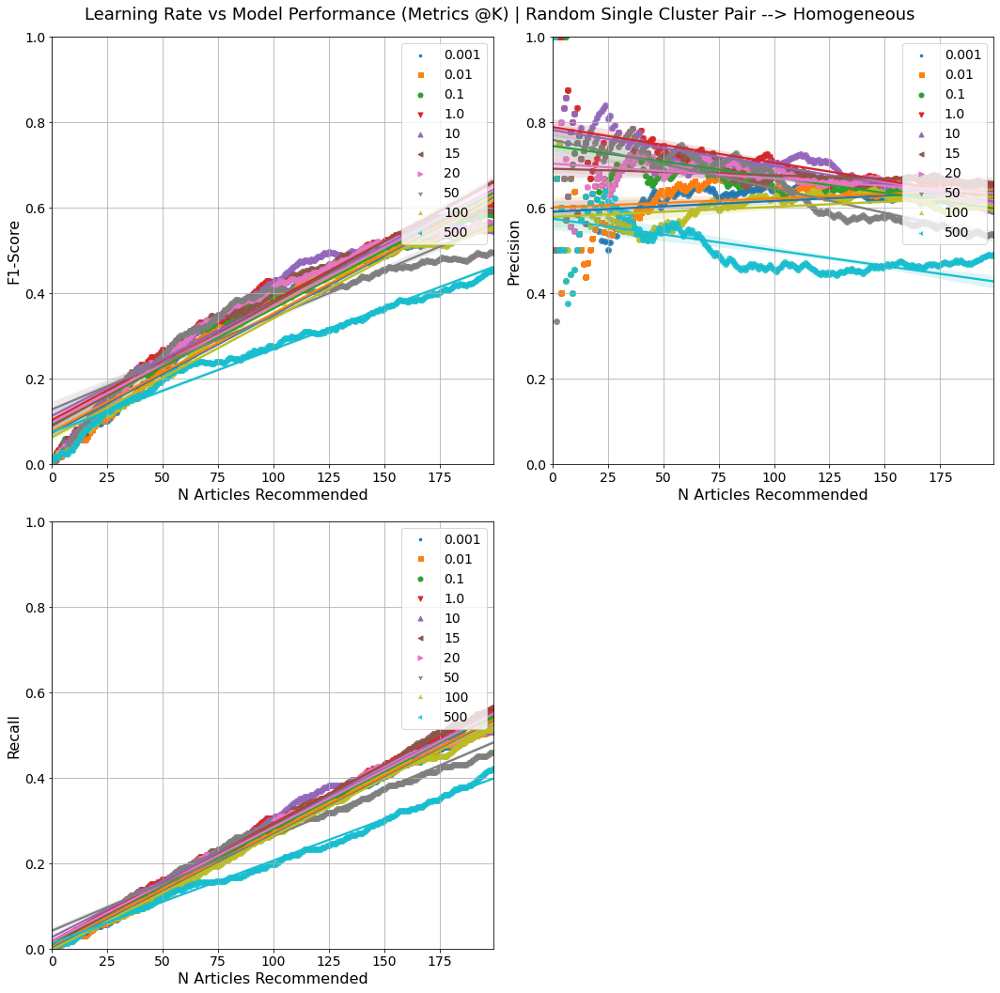


Finished running 'plot_lr_vs_metrics_at_k' in 0.0666 mins



In [56]:
plot_lr_vs_metrics_at_k(homo_scores[(585, 712)],
                                    lr=[0.001,0.01,0.1,1.0,10,15,20,50,100,500],
                                    single=True,user_type="Homogeneous")

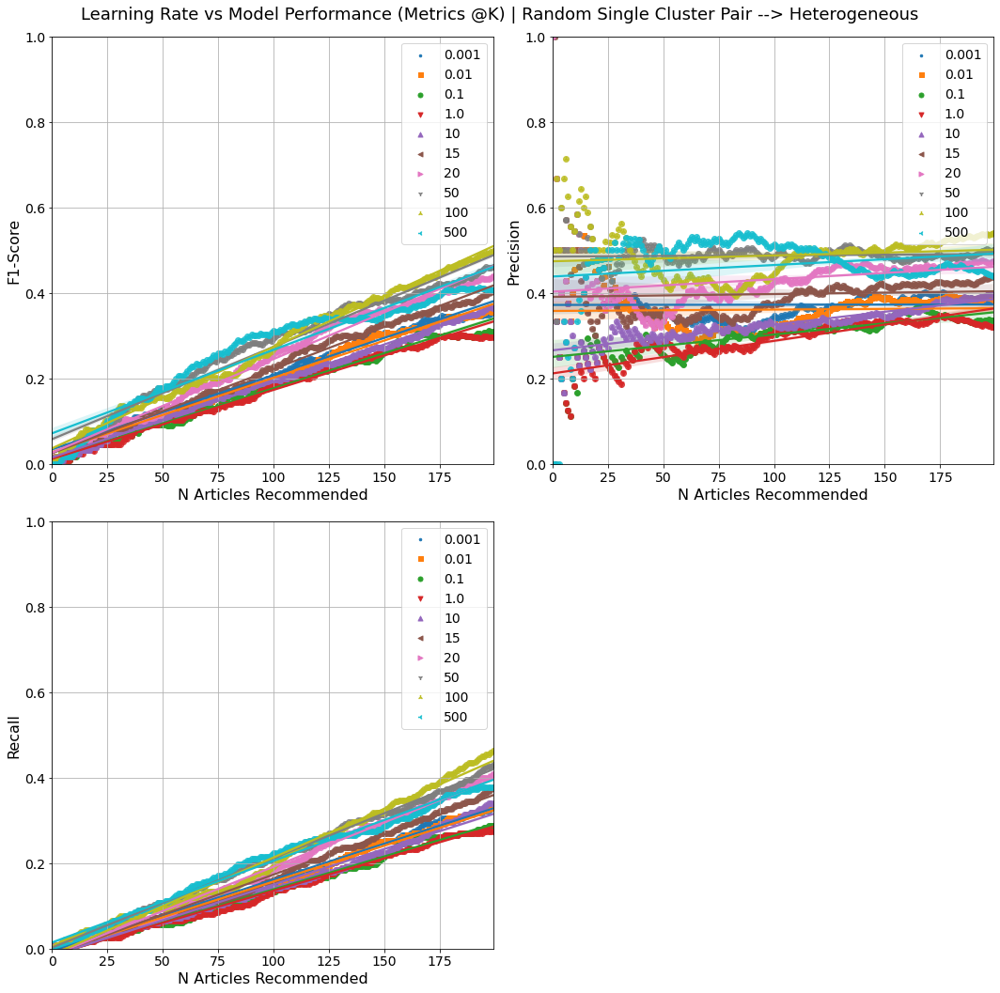


Finished running 'plot_lr_vs_metrics_at_k' in 0.0652 mins



In [57]:
plot_lr_vs_metrics_at_k(hetero_scores[(585, 712)],
                                    lr=[0.001,0.01,0.1,1.0,10,15,20,50,100,500],
                                    single=True)


Finished running 'combine_scores_reg_vs_metrics_at_k' in 0.0003 mins



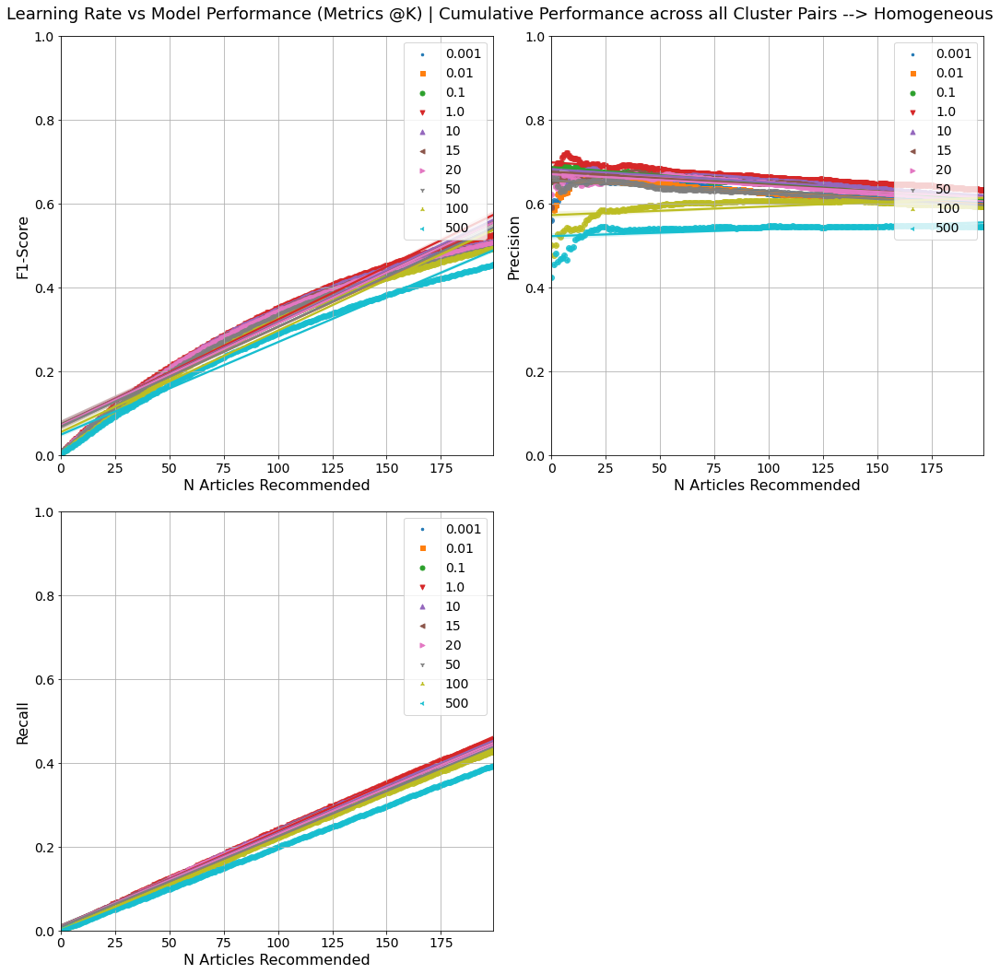


Finished running 'plot_lr_vs_metrics_at_k' in 0.0666 mins


Finished running 'plot_lr_vs_metrics_at_k_cumu' in 0.0669 mins



In [58]:
plot_lr_vs_metrics_at_k_cumu(homo_scores,
                             lr=[0.001,0.01,0.1,1.0,10,15,20,50,100,500],
                             user_type="Homogeneous")


Finished running 'combine_scores_reg_vs_metrics_at_k' in 0.0003 mins



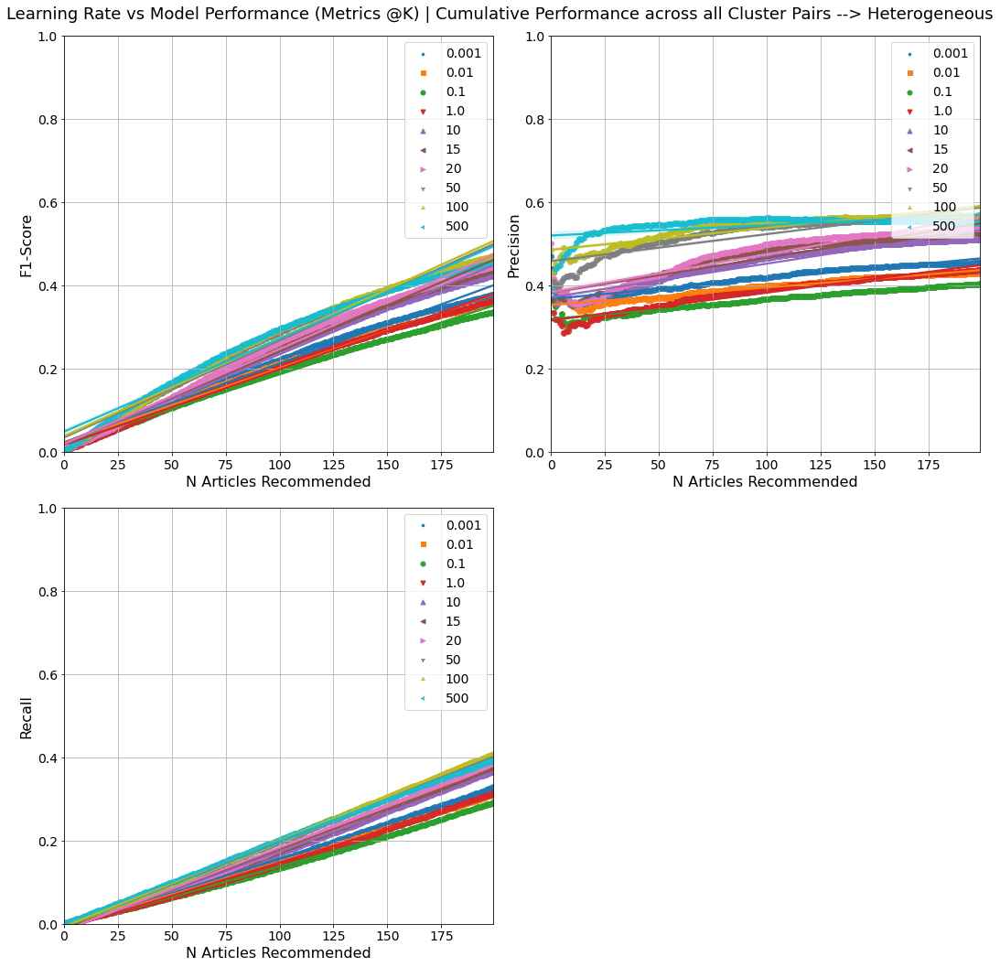


Finished running 'plot_lr_vs_metrics_at_k' in 0.0652 mins


Finished running 'plot_lr_vs_metrics_at_k_cumu' in 0.0655 mins



In [59]:
plot_lr_vs_metrics_at_k_cumu(hetero_scores,
                             lr=[0.001,0.01,0.1,1.0,10,15,20,50,100,500])

## Mixed Topic Performance

In [60]:
hetero_scores = run_mixeddata_performance_check(X=reduced_vectors,
                                   cluster_2_doc_map=doc_2_cluster_map,
                                   df=sampled_df,
                                   cluster_pairs=top100,
                                   cosine_mat=cluster_pair_dist_mat,
                                 user_type="Heterogeneous")

Training model for cluster pair : 0
Training model for cluster pair : 1
Training model for cluster pair : 2
Training model for cluster pair : 3
Training model for cluster pair : 4
Training model for cluster pair : 5
Training model for cluster pair : 6
Training model for cluster pair : 7
Training model for cluster pair : 8
Training model for cluster pair : 9
Training model for cluster pair : 10
Training model for cluster pair : 11
Training model for cluster pair : 12
Training model for cluster pair : 13
Training model for cluster pair : 14
Training model for cluster pair : 15
Training model for cluster pair : 16
Training model for cluster pair : 17
Training model for cluster pair : 18
Training model for cluster pair : 19
Training model for cluster pair : 20
Training model for cluster pair : 21
Training model for cluster pair : 22
Training model for cluster pair : 23
Training model for cluster pair : 24
Training model for cluster pair : 25
Training model for cluster pair : 26
Training mo

In [61]:
homo_scores = run_mixeddata_performance_check(X=reduced_vectors,
                                   cluster_2_doc_map=doc_2_cluster_map,
                                   df=sampled_df,
                                   cluster_pairs=top100,
                                   cosine_mat=cluster_pair_dist_mat,
                                 user_type="Homogeneous")

Training model for cluster pair : 0
Training model for cluster pair : 1
Training model for cluster pair : 2
Training model for cluster pair : 3
Training model for cluster pair : 4
Training model for cluster pair : 5
Training model for cluster pair : 6
Training model for cluster pair : 7
Training model for cluster pair : 8
Training model for cluster pair : 9
Training model for cluster pair : 10
Training model for cluster pair : 11
Training model for cluster pair : 12
Training model for cluster pair : 13
Training model for cluster pair : 14
Training model for cluster pair : 15
Training model for cluster pair : 16
Training model for cluster pair : 17
Training model for cluster pair : 18
Training model for cluster pair : 19
Training model for cluster pair : 20
Training model for cluster pair : 21
Training model for cluster pair : 22
Training model for cluster pair : 23
Training model for cluster pair : 24
Training model for cluster pair : 25
Training model for cluster pair : 26
Training mo

In [62]:
homo_scores.keys()

dict_keys([(585, 712), (585, 707), (363, 418), (405, 585), (405, 707), (160, 363), (418, 892), (33, 707), (33, 585), (33, 712), (707, 712), (160, 892), (33, 390), (2, 585), (33, 405), (2, 33), (405, 712), (160, 418), (2, 405), (363, 892), (33, 160), (33, 73), (2, 712), (33, 892), (33, 418), (73, 160), (2, 707), (33, 363), (73, 390), (160, 405), (363, 585), (585, 892), (405, 892), (405, 418), (363, 405), (160, 585), (390, 585), (160, 390), (2, 418), (418, 585), (2, 892), (390, 712), (73, 707), (73, 585), (390, 405), (73, 405), (2, 363), (2, 160), (363, 712), (73, 363), (712, 892), (418, 712), (160, 712), (160, 707), (73, 892), (707, 892), (390, 707), (73, 712), (363, 707), (2, 390), (73, 418), (363, 390), (390, 418), (390, 892), (418, 707), (2, 73)])

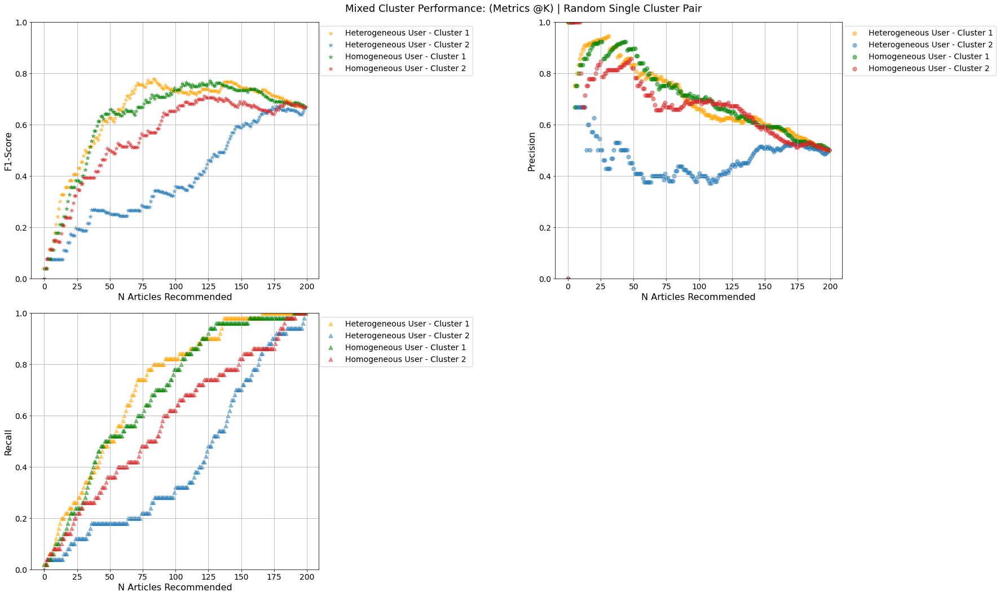


Finished running 'plot_mixed_data_performance_per_cluster' in 0.0101 mins



In [63]:
plot_mixed_data_performance_per_cluster(homo_scores[(585, 712)],hetero_scores[(585, 712)])


Finished running 'combine_scores_cumu_online_setting' in 0.0000 mins


Finished running 'combine_scores_cumu_online_setting' in 0.0000 mins



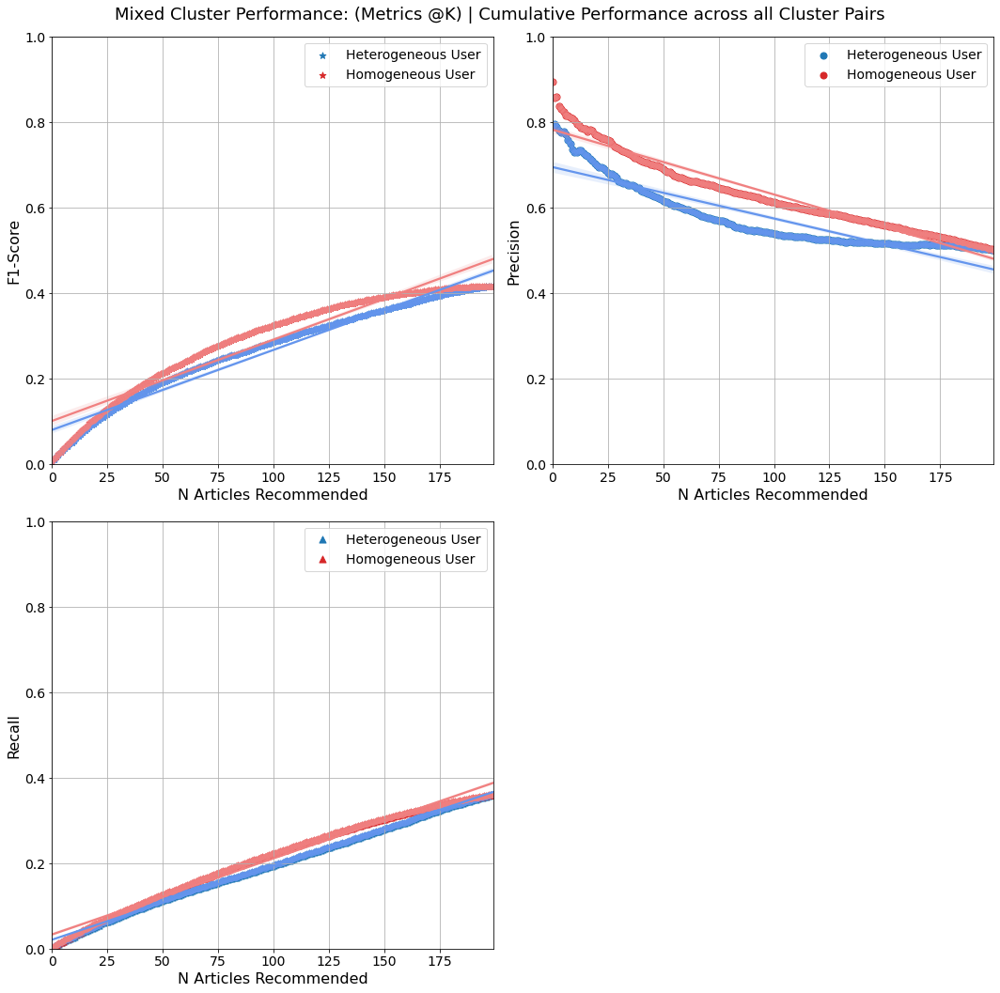


Finished running 'plot_mixed_data_performance' in 0.0177 mins


Finished running 'plot_mixed_cluster_cumulative' in 0.0178 mins



In [64]:
plot_mixed_cluster_cumulative(homo_scores,hetero_scores)

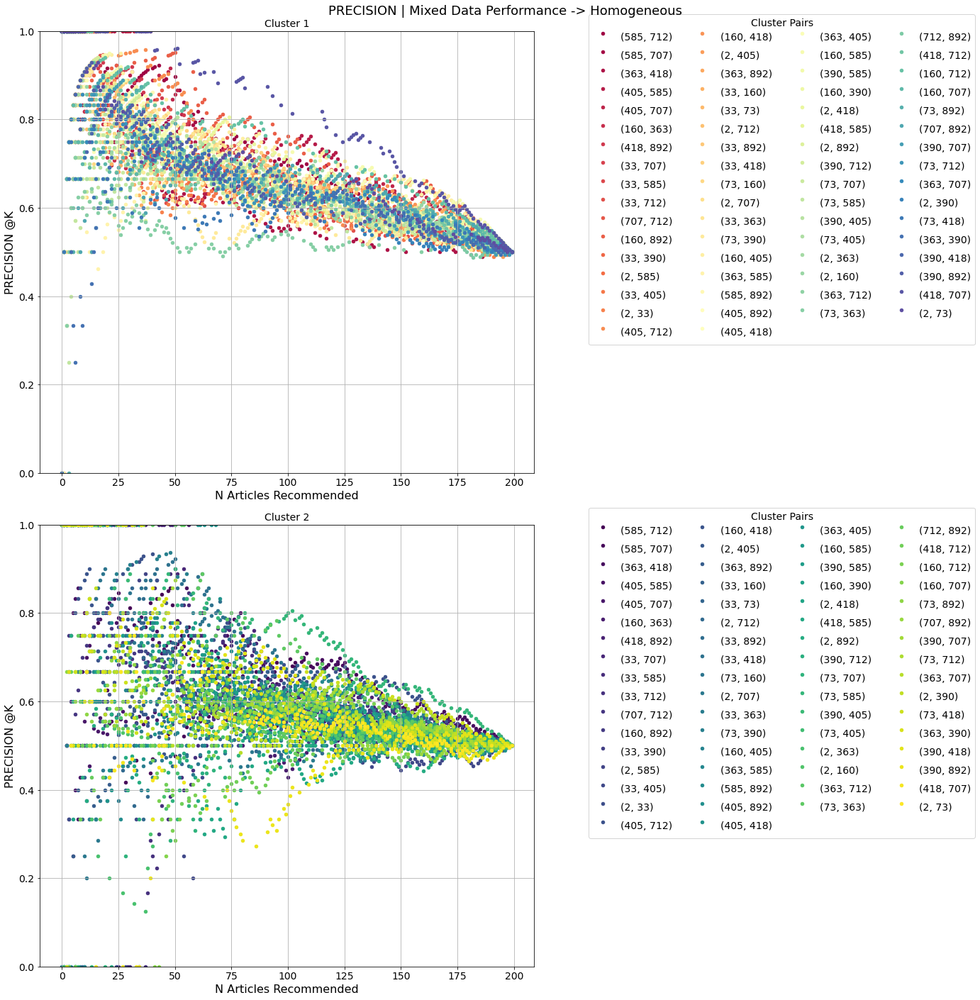


Finished running 'plot_mixed_data_all_cp_perf' in 0.0772 mins



In [65]:
plot_mixed_data_all_cp_perf(scores_cp=homo_scores,user_type="Homogeneous",metric="precision")

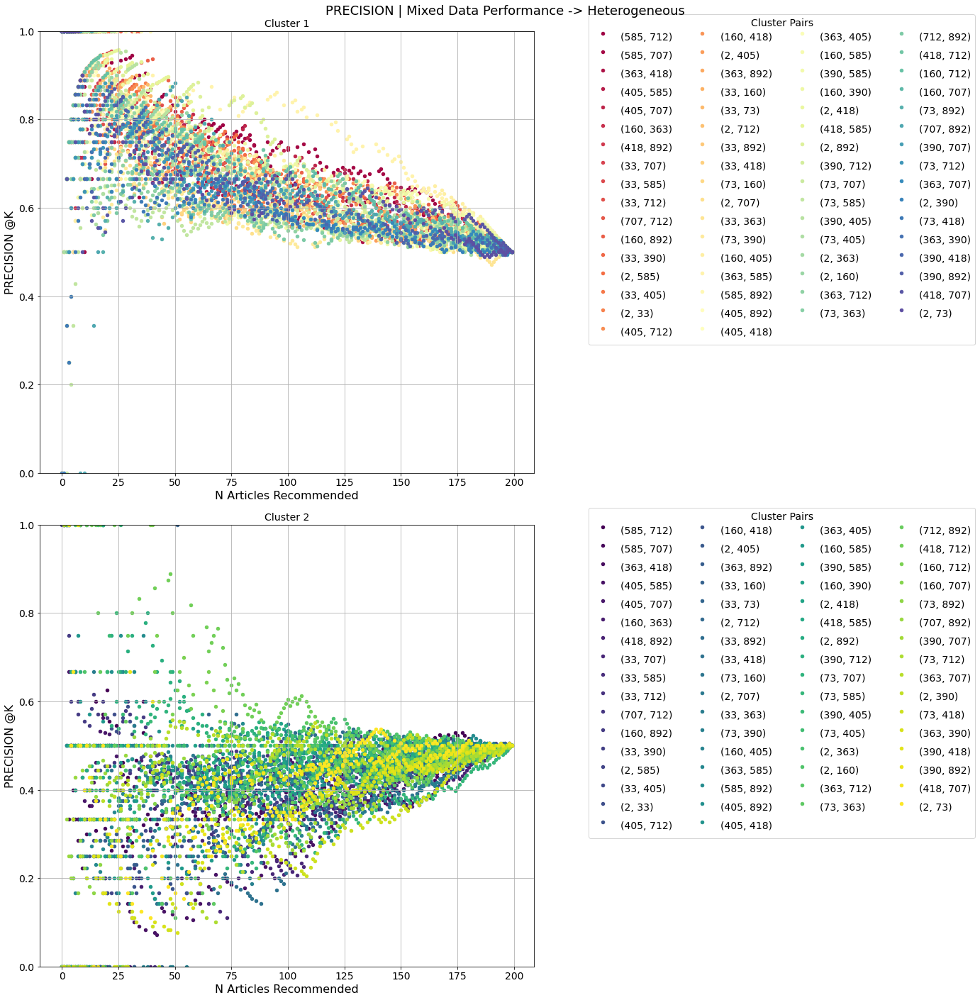


Finished running 'plot_mixed_data_all_cp_perf' in 0.0788 mins



In [66]:
plot_mixed_data_all_cp_perf(scores_cp=hetero_scores,user_type="Heterogeneous",metric="precision")

## Mixed Data with learning rate variation

In [67]:
hetero_scores = run_learningrate_variation_mixed_data(X=reduced_vectors,
                                   cluster_2_doc_map=doc_2_cluster_map,
                                   df=sampled_df,
                                   cluster_pairs=top100,
                                   cosine_mat=cluster_pair_dist_mat,
                                 user_type="Heterogeneous",
                                 lr=[0.001,0.01,0.1,1.0,10,15,20,50,100,500])

Training model for cluster pair : 0
Training model for cluster pair : 1
Training model for cluster pair : 2
Training model for cluster pair : 3
Training model for cluster pair : 4
Training model for cluster pair : 5
Training model for cluster pair : 6
Training model for cluster pair : 7
Training model for cluster pair : 8
Training model for cluster pair : 9
Training model for cluster pair : 10
Training model for cluster pair : 11
Training model for cluster pair : 12
Training model for cluster pair : 13
Training model for cluster pair : 14
Training model for cluster pair : 15
Training model for cluster pair : 16
Training model for cluster pair : 17
Training model for cluster pair : 18
Training model for cluster pair : 19
Training model for cluster pair : 20
Training model for cluster pair : 21
Training model for cluster pair : 22
Training model for cluster pair : 23
Training model for cluster pair : 24
Training model for cluster pair : 25
Training model for cluster pair : 26
Training mo

In [68]:
homo_scores = run_learningrate_variation_mixed_data(X=reduced_vectors,
                                   cluster_2_doc_map=doc_2_cluster_map,
                                   df=sampled_df,
                                   cluster_pairs=top100,
                                   cosine_mat=cluster_pair_dist_mat,
                                 user_type="Homogeneous",
                                 lr=[0.001,0.01,0.1,1.0,10,15,20,50,100,500])

Training model for cluster pair : 0
Training model for cluster pair : 1
Training model for cluster pair : 2
Training model for cluster pair : 3
Training model for cluster pair : 4
Training model for cluster pair : 5
Training model for cluster pair : 6
Training model for cluster pair : 7
Training model for cluster pair : 8
Training model for cluster pair : 9
Training model for cluster pair : 10
Training model for cluster pair : 11
Training model for cluster pair : 12
Training model for cluster pair : 13
Training model for cluster pair : 14
Training model for cluster pair : 15
Training model for cluster pair : 16
Training model for cluster pair : 17
Training model for cluster pair : 18
Training model for cluster pair : 19
Training model for cluster pair : 20
Training model for cluster pair : 21
Training model for cluster pair : 22
Training model for cluster pair : 23
Training model for cluster pair : 24
Training model for cluster pair : 25
Training model for cluster pair : 26
Training mo

In [69]:
homo_scores.keys()

dict_keys([(585, 712), (585, 707), (363, 418), (405, 585), (405, 707), (160, 363), (418, 892), (33, 707), (33, 585), (33, 712), (707, 712), (160, 892), (33, 390), (2, 585), (33, 405), (2, 33), (405, 712), (160, 418), (2, 405), (363, 892), (33, 160), (33, 73), (2, 712), (33, 892), (33, 418), (73, 160), (2, 707), (33, 363), (73, 390), (160, 405), (363, 585), (585, 892), (405, 892), (405, 418), (363, 405), (160, 585), (390, 585), (160, 390), (2, 418), (418, 585), (2, 892), (390, 712), (73, 707), (73, 585), (390, 405), (73, 405), (2, 363), (2, 160), (363, 712), (73, 363), (712, 892), (418, 712), (160, 712), (160, 707), (73, 892), (707, 892), (390, 707), (73, 712), (363, 707), (2, 390), (73, 418), (363, 390), (390, 418), (390, 892), (418, 707), (2, 73)])

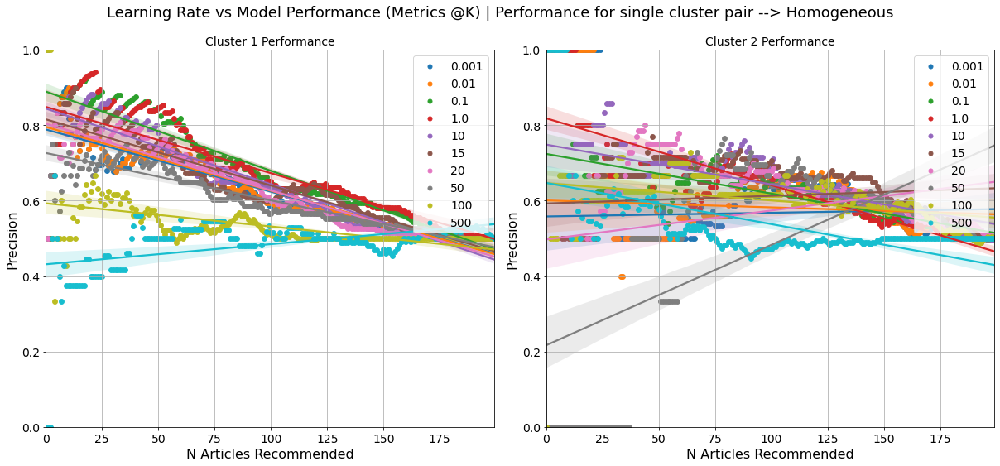


Finished running 'plot_lr_vs_metrics_at_k_mixed' in 0.0467 mins



In [70]:
plot_lr_vs_metrics_at_k_mixed(homo_scores[(585, 712)],
                                    lr=[0.001,0.01,0.1,1.0,10,15,20,50,100,500],user_type="Homogeneous")

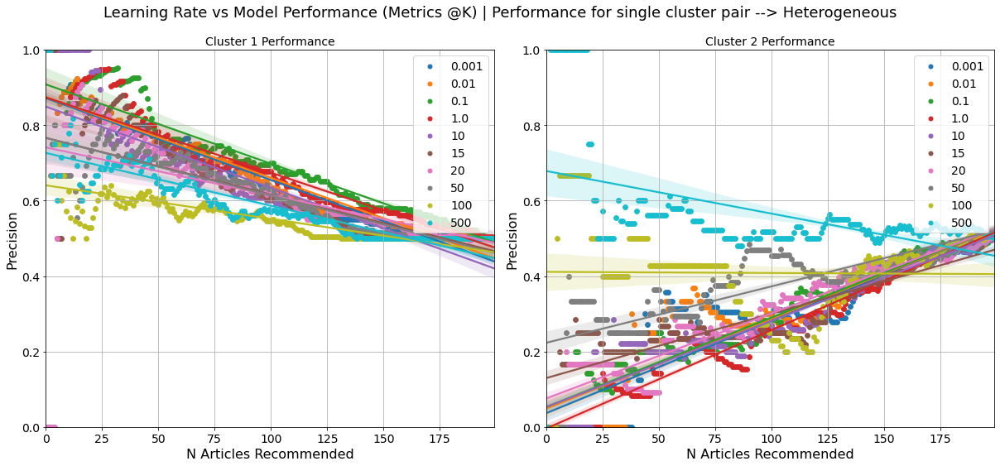


Finished running 'plot_lr_vs_metrics_at_k_mixed' in 0.0469 mins



In [71]:
plot_lr_vs_metrics_at_k_mixed(hetero_scores[(585, 712)],
                                    lr=[0.001,0.01,0.1,1.0,10,15,20,50,100,500])


Finished running 'combine_scores_reg_vs_metrics_at_k' in 0.0004 mins



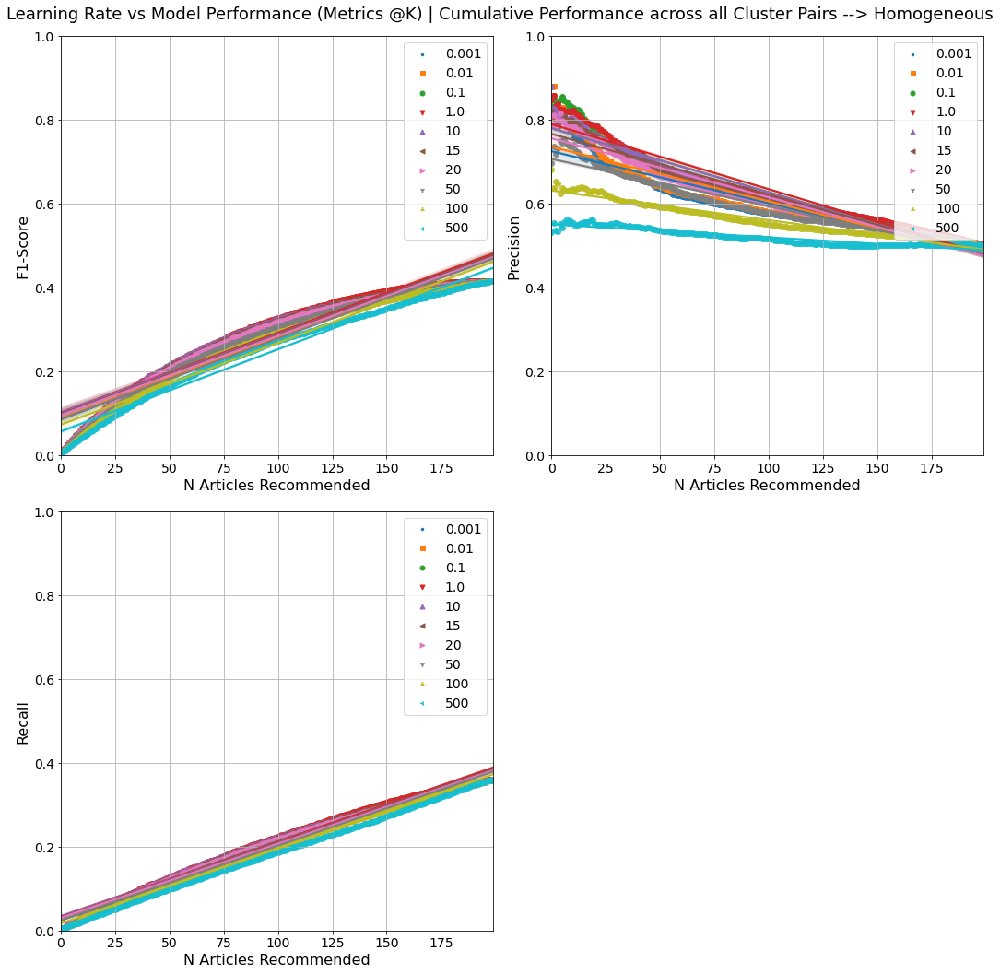


Finished running 'plot_lr_vs_metrics_at_k' in 0.0661 mins


Finished running 'plot_lr_vs_metrics_at_k_cumu' in 0.0665 mins



In [72]:
plot_lr_vs_metrics_at_k_cumu(homo_scores,
                             lr=[0.001,0.01,0.1,1.0,10,15,20,50,100,500],
                             user_type="Homogeneous",mixed_data=True)


Finished running 'combine_scores_reg_vs_metrics_at_k' in 0.0004 mins



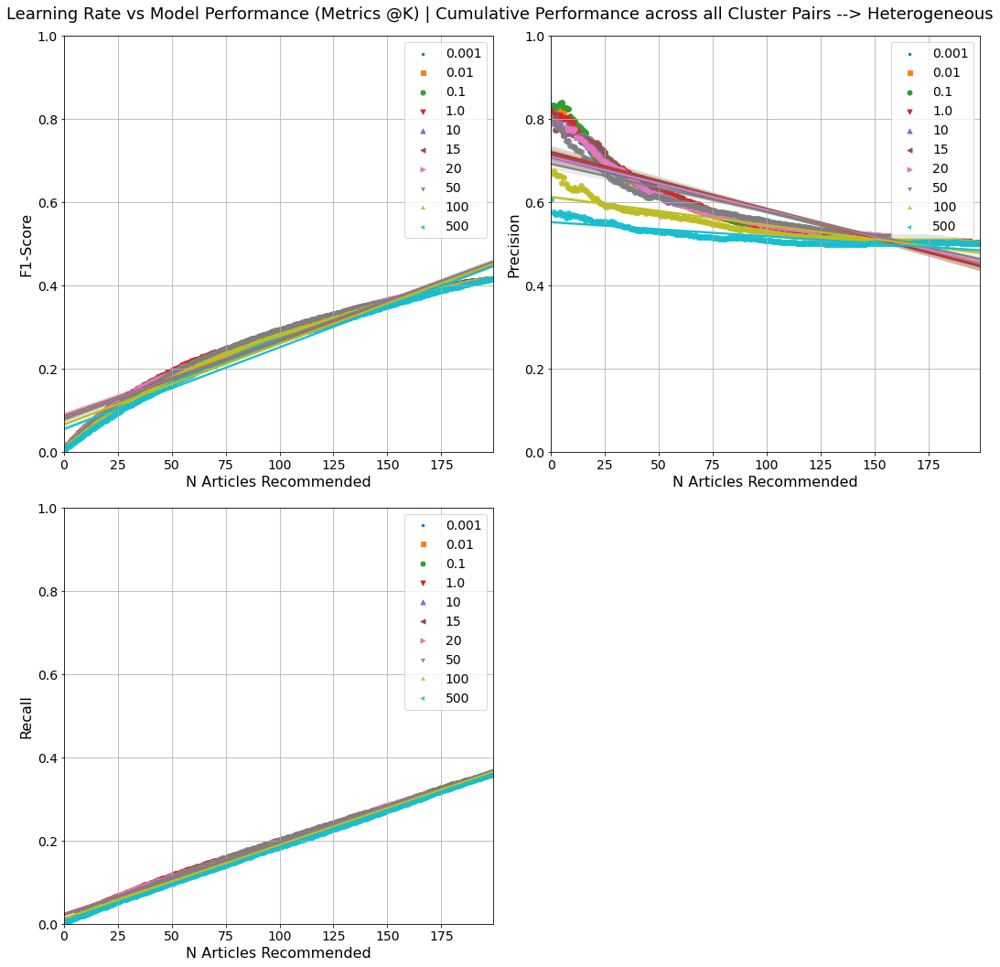


Finished running 'plot_lr_vs_metrics_at_k' in 0.0646 mins


Finished running 'plot_lr_vs_metrics_at_k_cumu' in 0.0651 mins



In [73]:
plot_lr_vs_metrics_at_k_cumu(hetero_scores,
                             lr=[0.001,0.01,0.1,1.0,10,15,20,50,100,500],mixed_data=True)

In [74]:
homo_scores.keys()

dict_keys([(585, 712), (585, 707), (363, 418), (405, 585), (405, 707), (160, 363), (418, 892), (33, 707), (33, 585), (33, 712), (707, 712), (160, 892), (33, 390), (2, 585), (33, 405), (2, 33), (405, 712), (160, 418), (2, 405), (363, 892), (33, 160), (33, 73), (2, 712), (33, 892), (33, 418), (73, 160), (2, 707), (33, 363), (73, 390), (160, 405), (363, 585), (585, 892), (405, 892), (405, 418), (363, 405), (160, 585), (390, 585), (160, 390), (2, 418), (418, 585), (2, 892), (390, 712), (73, 707), (73, 585), (390, 405), (73, 405), (2, 363), (2, 160), (363, 712), (73, 363), (712, 892), (418, 712), (160, 712), (160, 707), (73, 892), (707, 892), (390, 707), (73, 712), (363, 707), (2, 390), (73, 418), (363, 390), (390, 418), (390, 892), (418, 707), (2, 73)])

In [75]:
homo_scores[(585, 712)].keys()

dict_keys(['0.001', '0.01', '0.1', '1.0', '10', '15', '20', '50', '100', '500'])

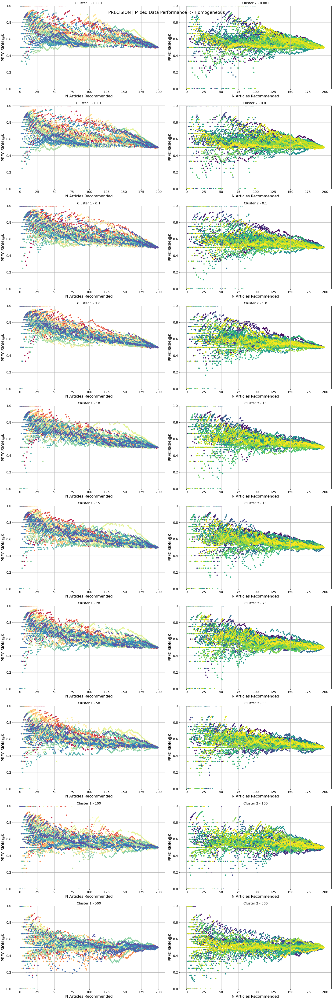

In [76]:
 plot_mixed_data_all_cp_precis_lr(scores_=homo_scores,
                             lr=[0.001,0.01,0.1,1.0,10,15,20,50,100,500],
                             user_type="Homogeneous",metric="precision")

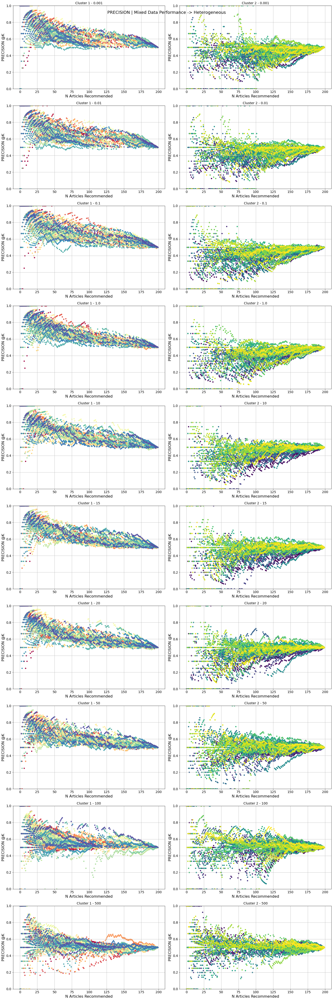

In [77]:
 plot_mixed_data_all_cp_precis_lr(scores_=hetero_scores,
                             lr=[0.001,0.01,0.1,1.0,10,15,20,50,100,500],
                             user_type="Heterogeneous",metric="precision")